In [ ]:
import pandas as pd

In [ ]:
df_new = pd.read_csv('/content/all_commodity_data.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/content/all_commodity_data.csv'

In [ ]:
df = df_new[['District Name','Variety','Modal Price (Rs./Quintal)','Price Date']]

In [ ]:
df.head()

In [ ]:
import pandas as pd
# Handle missing values or incorrect formats
df['Price Date'] = pd.to_datetime(df['Price Date'], format='%d %b %Y', errors='coerce')

#Check to see if the Price Date column has any null values that need to be addressed
df.isnull().sum()


In [ ]:
df.head()

,District Name,Variety,Modal Price (Rs./Quintal),Price Date
0,Chikmagalur,Alsandikai,1750,2023-12-17
1,Chikmagalur,Alsandikai,1750,2023-12-18
2,Chikmagalur,Alsandikai,2700,2023-08-04
3,Chikmagalur,Alsandikai,3500,2024-03-11
4,Bangalore,Alsandikai,1900,2018-02-24


In [ ]:
df.set_index('Price Date',drop = True,inplace = True)

In [ ]:
df.sort_index(inplace = True)

<ipython-input-60-a34e114adea6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.sort_index(inplace = True)


In [ ]:
df.head()

,District Name,Variety,Modal Price (Rs./Quintal)
Price Date,,,
2015-01-01,Hassan,Beetroot,1000
2015-01-01,Chikmagalur,Green Chilly,1800
2015-01-01,Mysore,Beetroot,1250
2015-01-01,Bangalore,Tomato,1400
2015-01-01,Bangalore,Thogarikai,1000


In [ ]:
tomato_df = df[df['Variety'] == 'Tomato']

In [ ]:
tomato_df[tomato_df.index == '2015-01-01']

,District Name,Variety,Modal Price (Rs./Quintal)
Price Date,,,
2015-01-01,Bangalore,Tomato,1400
2015-01-01,Mysore,Tomato,1200
2015-01-01,Hassan,Tomato,1500
2015-01-01,Kolar,Tomato,935
2015-01-01,Chikmagalur,Tomato,600
2015-01-01,Hassan,Tomato,913
2015-01-01,Bangalore,Tomato,1400
2015-01-01,Mysore,Tomato,1000
2015-01-01,Kolar,Tomato,1100


In [ ]:
tomato_df[tomato_df.index == '2015-01-02']

,District Name,Variety,Modal Price (Rs./Quintal)
Price Date,,,
2015-01-02,Bangalore,Tomato,1300
2015-01-02,Shimoga,Tomato,500
2015-01-02,Kolar,Tomato,1700
2015-01-02,Davangere,Tomato,900
2015-01-02,Chamrajnagar,Tomato,800
2015-01-02,Davangere,Tomato,500
2015-01-02,Bangalore,Tomato,1400
2015-01-02,Bangalore,Tomato,1350
2015-01-02,Kolar,Tomato,1150


In [ ]:
tomato_df['Modal Price (Rs./Quintal)'] = pd.to_numeric(tomato_df['Modal Price (Rs./Quintal)'].str.replace(',', ''), errors='coerce')

<ipython-input-65-60f402996ac5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tomato_df['Modal Price (Rs./Quintal)'] = pd.to_numeric(tomato_df['Modal Price (Rs./Quintal)'].str.replace(',', ''), errors='coerce')


In [ ]:
tomato_df.isnull().sum()

,0
District Name,0
Variety,0
Modal Price (Rs./Quintal),0


In [ ]:
tomato_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 56306 entries, 2015-01-01 to 2024-10-04
Data columns (total 3 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   District Name              56306 non-null  object
 1   Variety                    56306 non-null  object
 2   Modal Price (Rs./Quintal)  56306 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 1.7+ MB


In [ ]:
q3 =  tomato_df['Modal Price (Rs./Quintal)'].quantile(0.75)
q1 = tomato_df['Modal Price (Rs./Quintal)'].quantile(0.25)
iqr = q3 - q1

In [ ]:
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

In [ ]:

outliers = tomato_df[(tomato_df['Modal Price (Rs./Quintal)'] > (q3 + 1.5 * iqr)) | (tomato_df['Modal Price (Rs./Quintal)'] < (q1 - 1.5 * iqr))]

In [ ]:
tomato_df['Capped Prices'] = tomato_df['Modal Price (Rs./Quintal)'].clip(lower=lower_bound, upper=upper_bound)

<ipython-input-21-caf8b8c23dd7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tomato_df['Capped Prices'] = tomato_df['Modal Price (Rs./Quintal)'].clip(lower=lower_bound, upper=upper_bound)


In [ ]:
tomato_df

,District Name,Variety,Modal Price (Rs./Quintal),Capped Prices
Price Date,,,,
2015-01-01,Bangalore,Tomato,1400,1400.0
2015-01-01,Mysore,Tomato,1200,1200.0
2015-01-01,Hassan,Tomato,1500,1500.0
2015-01-01,Kolar,Tomato,935,935.0
2015-01-01,Chikmagalur,Tomato,600,600.0
...,...,...,...,...
2024-10-04,Chikmagalur,Tomato,4082,3502.5
2024-10-04,Chamrajnagar,Tomato,4000,3502.5
2024-10-04,Udupi,Tomato,8000,3502.5


In [ ]:
tomato_df.columns

Index(['District Name', 'Variety', 'Modal Price (Rs./Quintal)',
       'Capped Prices'],
      dtype='object')

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


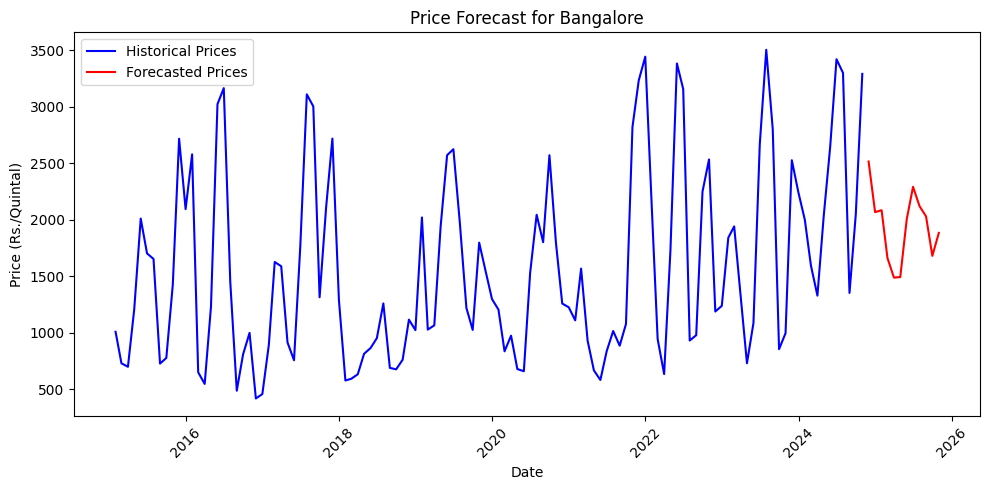

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


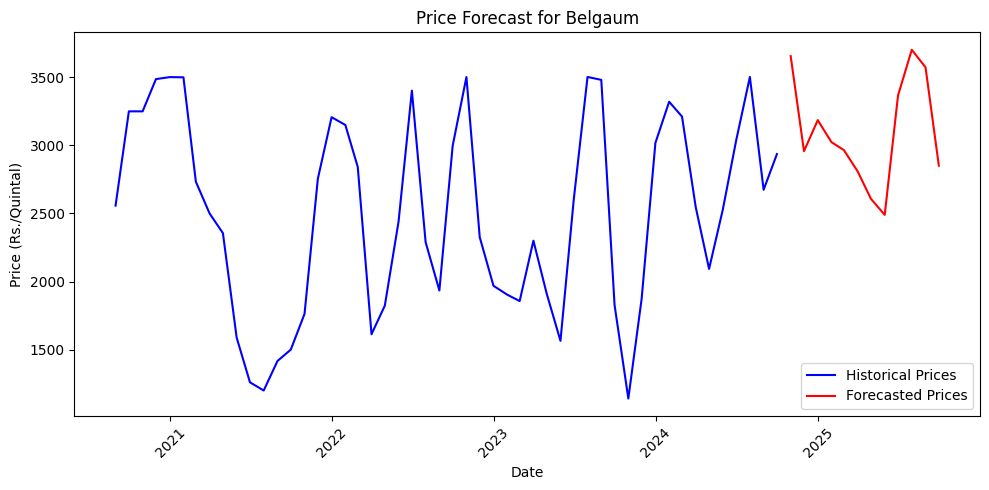

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


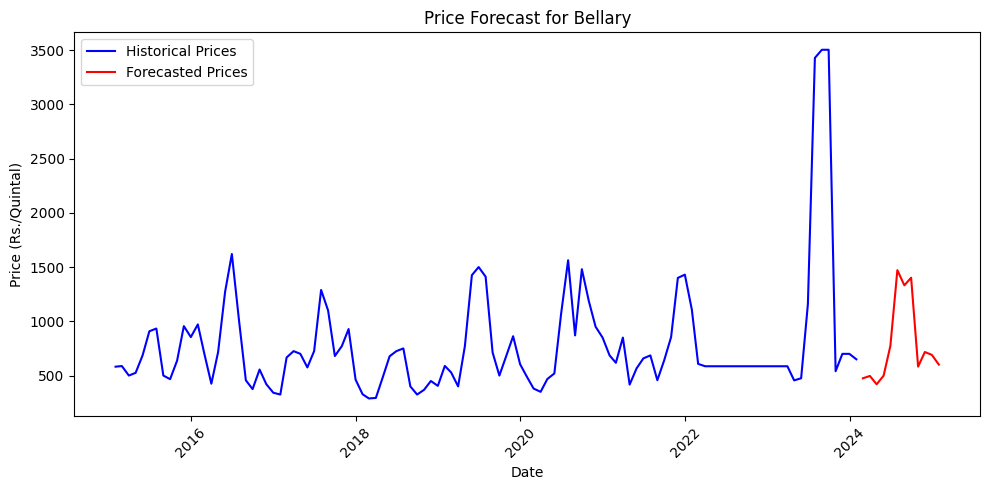

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


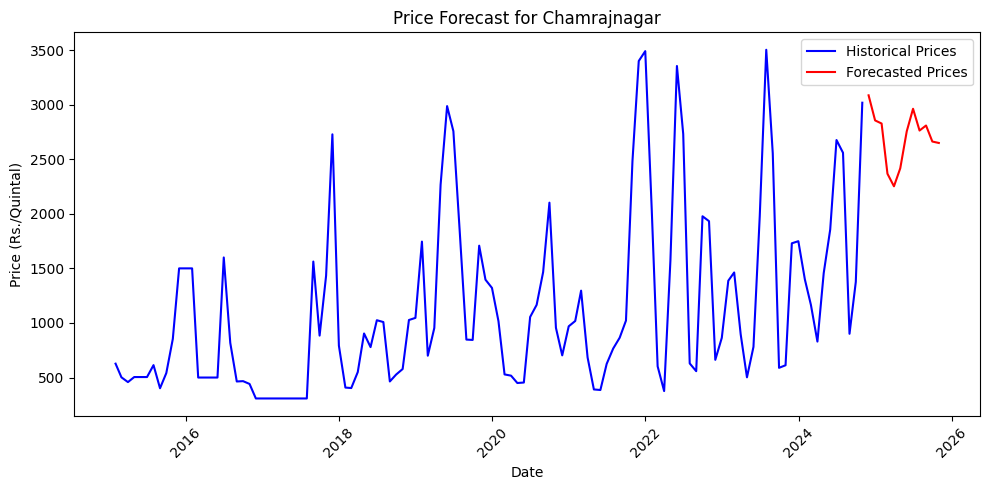

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


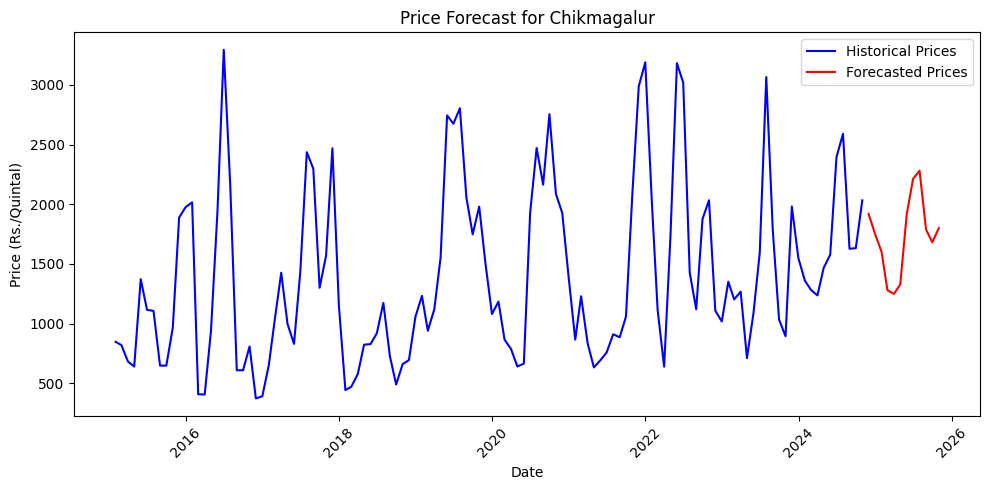

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


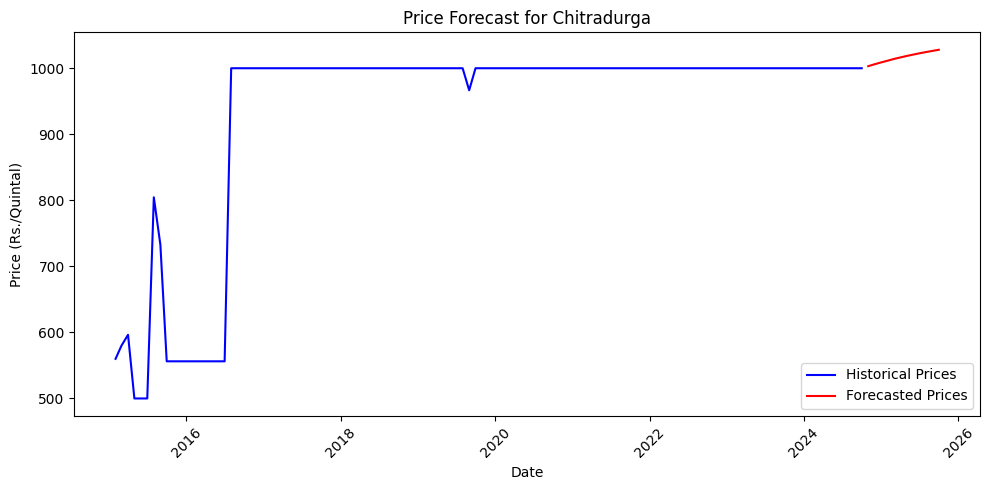

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


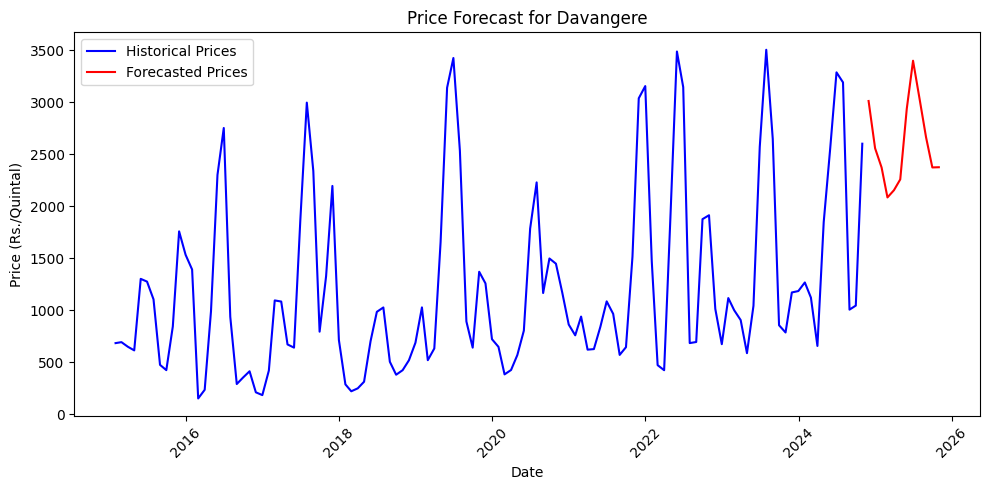

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


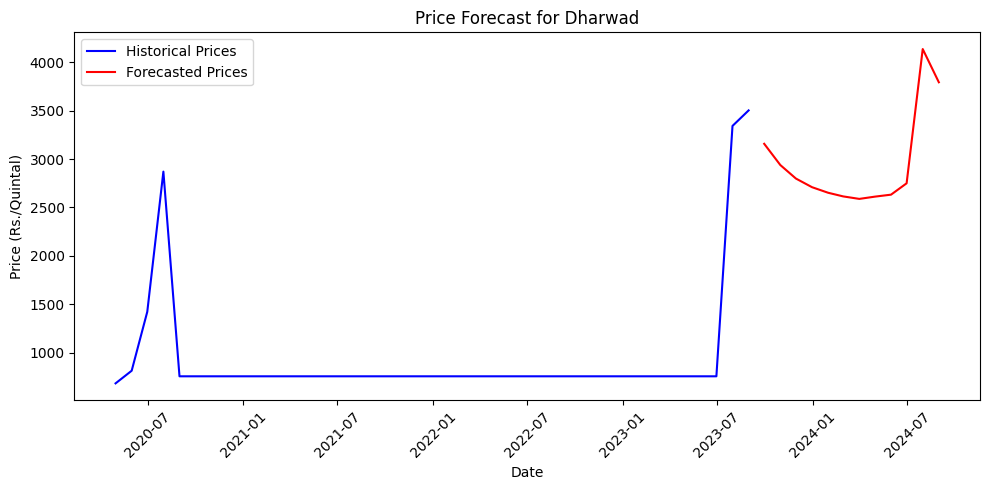

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


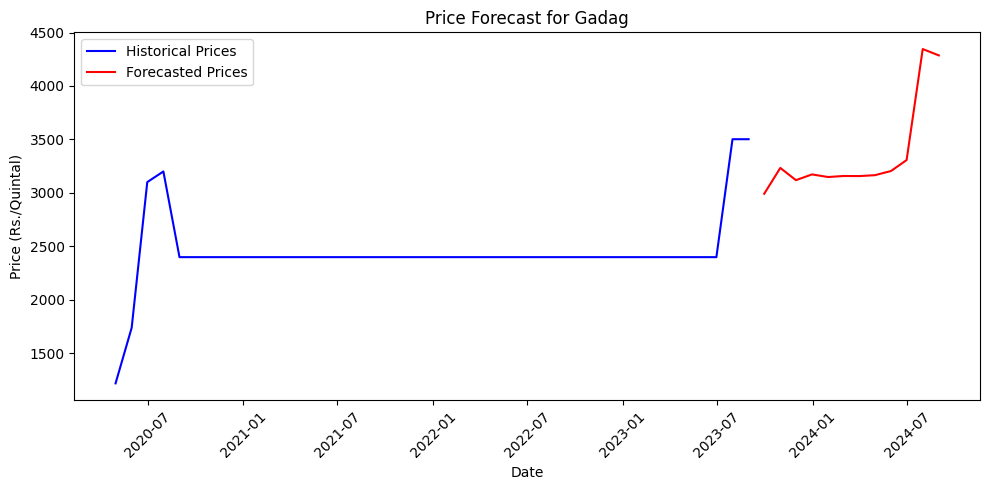

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


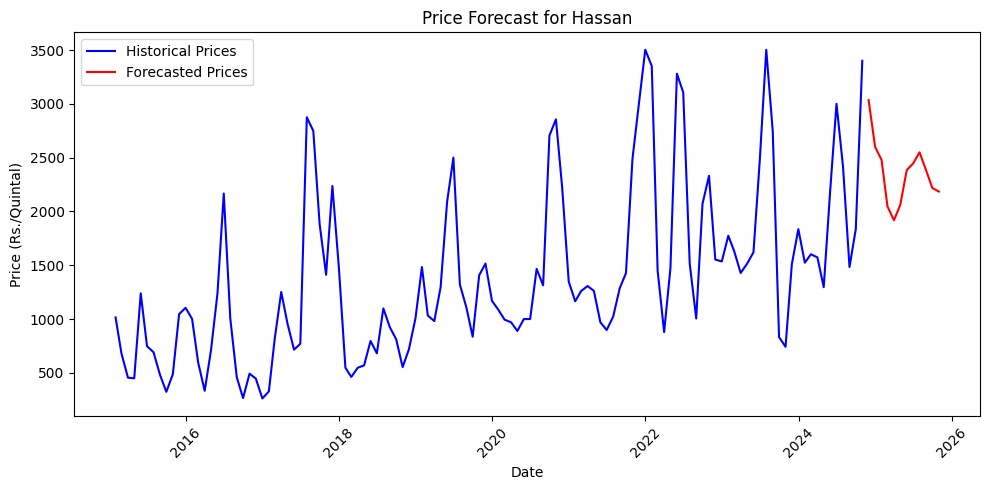

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


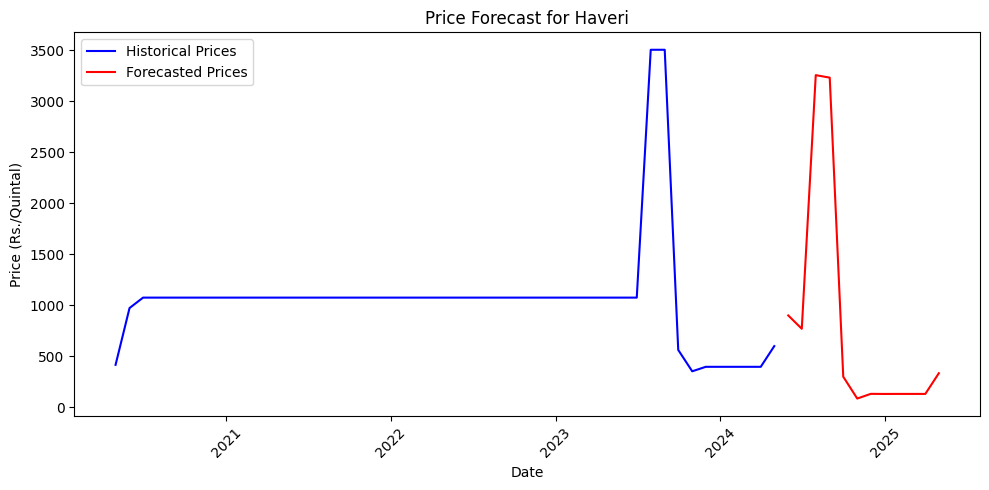

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


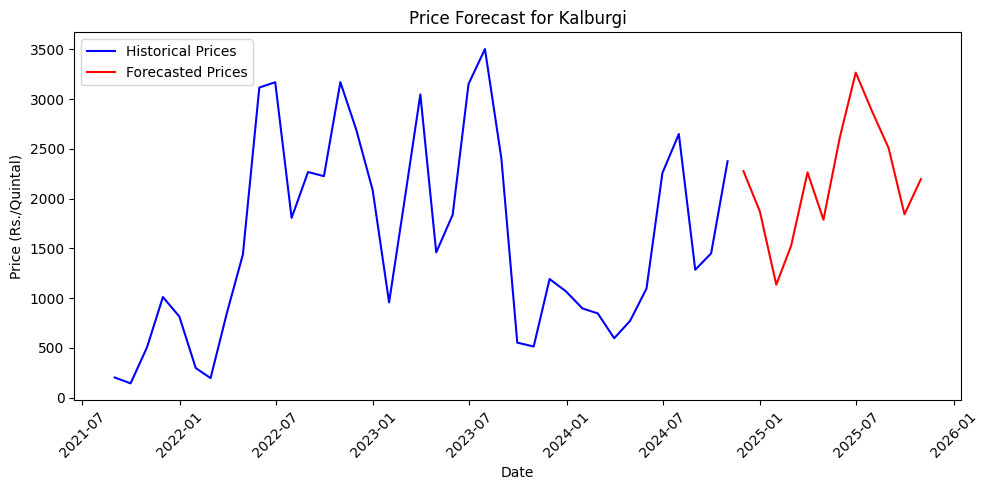

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


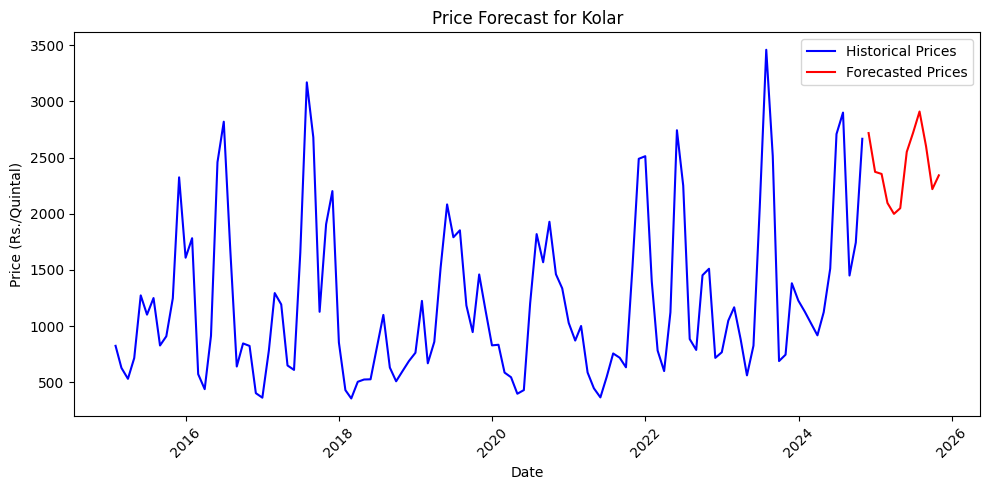

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observat

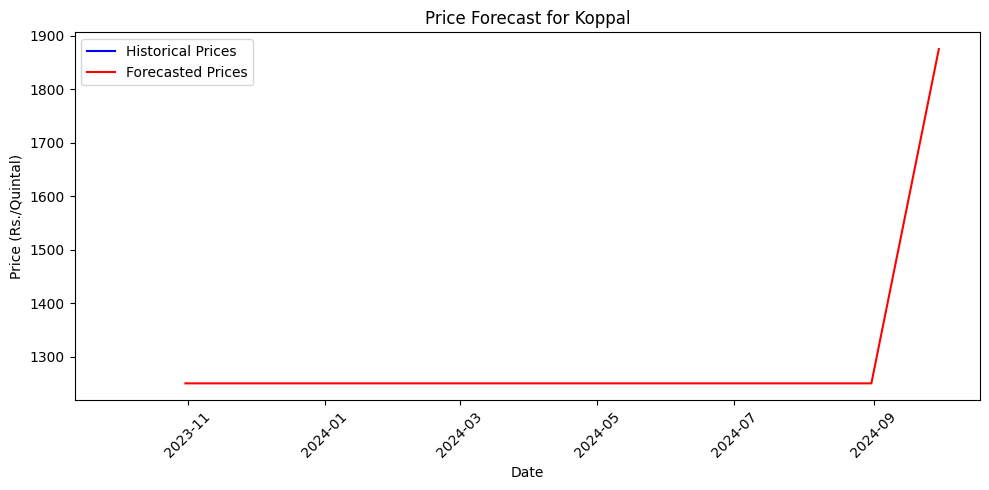

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observat

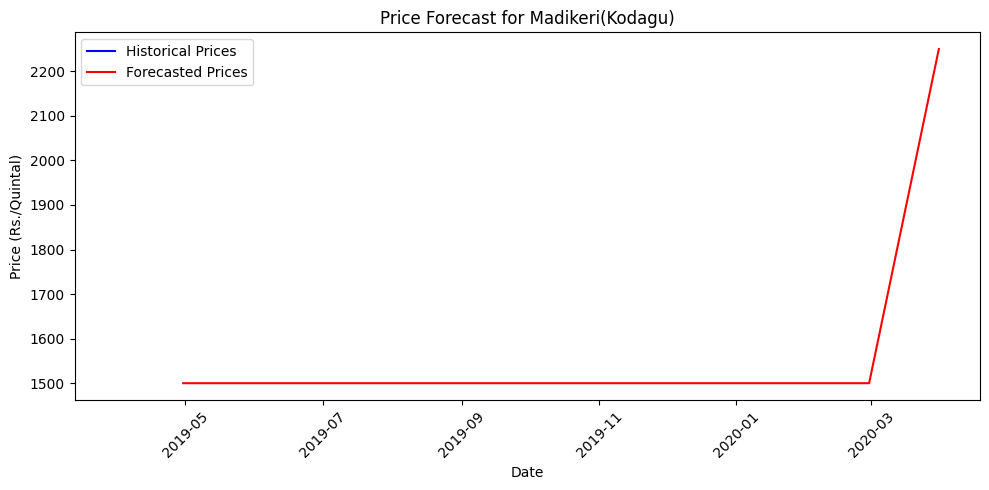

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


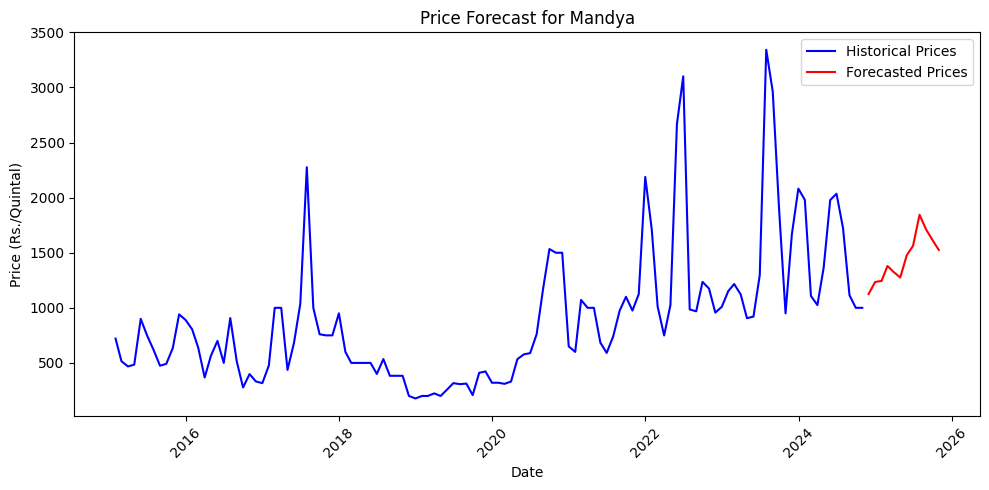

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


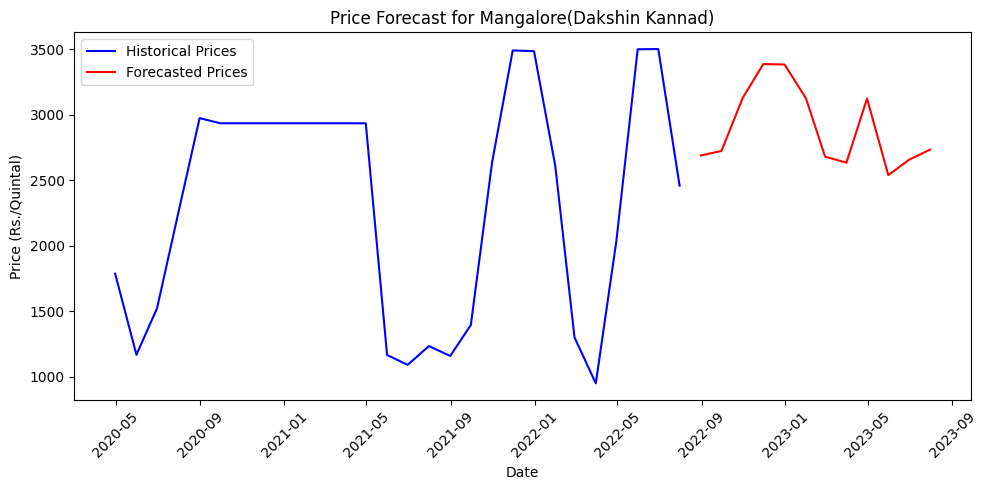

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


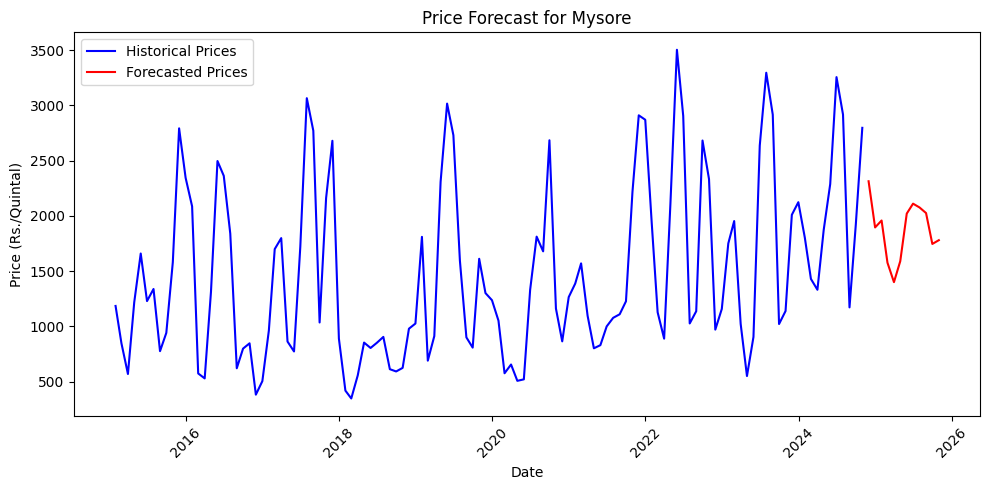

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


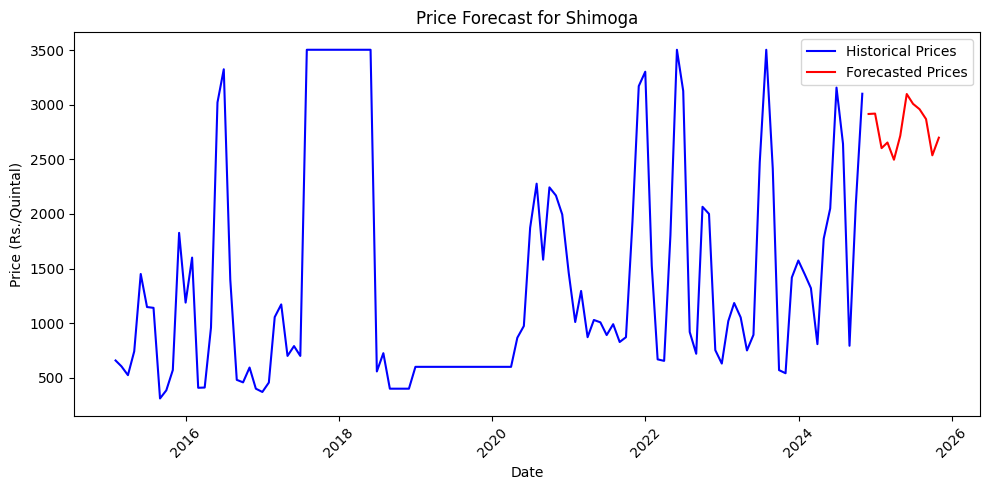

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


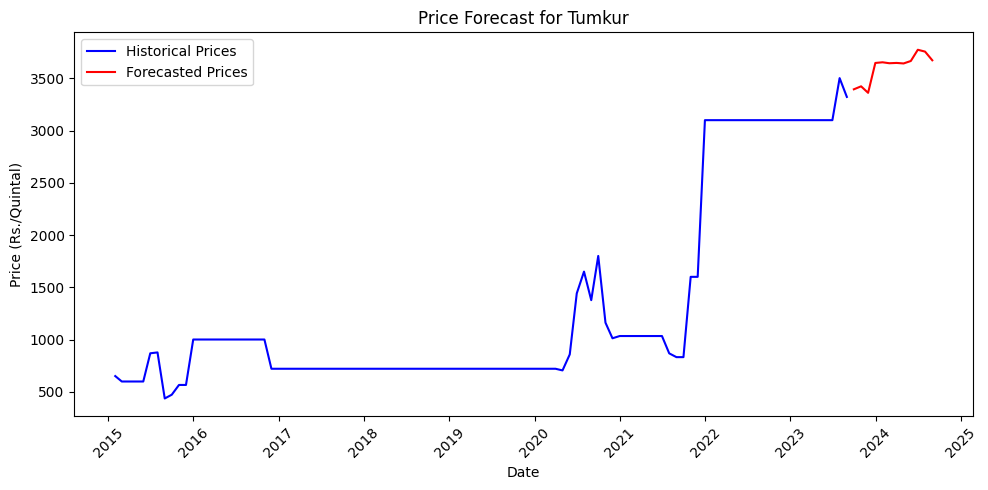

<ipython-input-75-d6df29444074>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-75-d6df29444074>:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


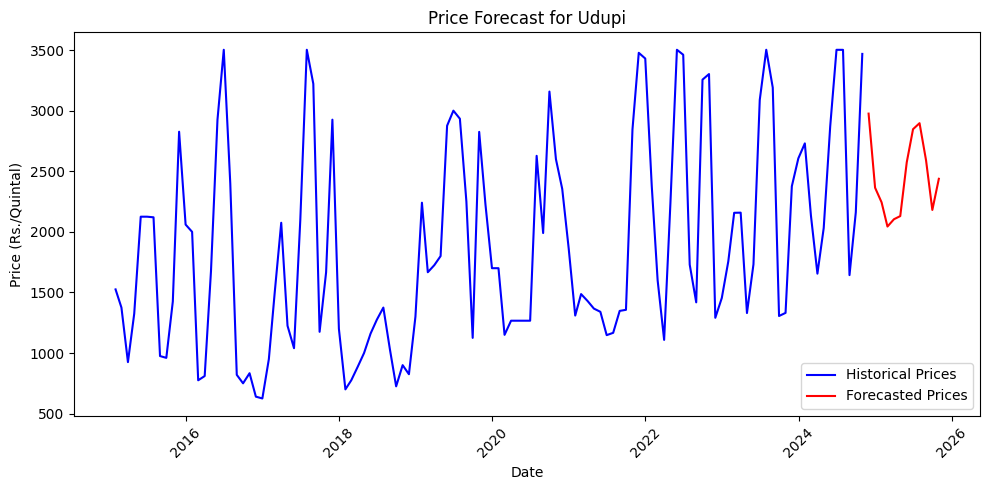

In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt

# Assuming your dataframe tomato_df has 'Date' already as the index
# Group the data by District_Market and Date, then aggregate the prices
# Here we can take the mean price for the same date if there are multiple entries
aggregated_df = tomato_df.groupby(['District Name', tomato_df.index]).agg({'Capped Prices': 'mean'}).reset_index()

# Rename the columns for clarity
aggregated_df.columns = ['District Name', 'Date', 'Capped Prices']

# Set the 'Date' column as the index again (if necessary for further processing)
aggregated_df.set_index('Date', inplace=True)

# Group the data by District_Market for forecasting
grouped = aggregated_df.groupby('District Name')

# Initialize a dictionary to store forecast results
forecast_results = {}

# Iterate over each group (district)
for district, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')

    # Train a SARIMA model (or choose another model like Prophet)
    model = SARIMAX(group, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    model_fit = model.fit(disp=False)

    # Forecast for the next 12 months
    forecast = model_fit.forecast(steps=12)

    # Store the results
    forecast_results[district] = forecast

    # Optional: Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(group, label='Historical Prices', color='blue')
    plt.plot(forecast, label='Forecasted Prices', color='red')
    plt.title(f'Price Forecast for {district}')
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Convert forecast results to DataFrame for further analysis or export
forecast_df = pd.DataFrame(forecast_results)


<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


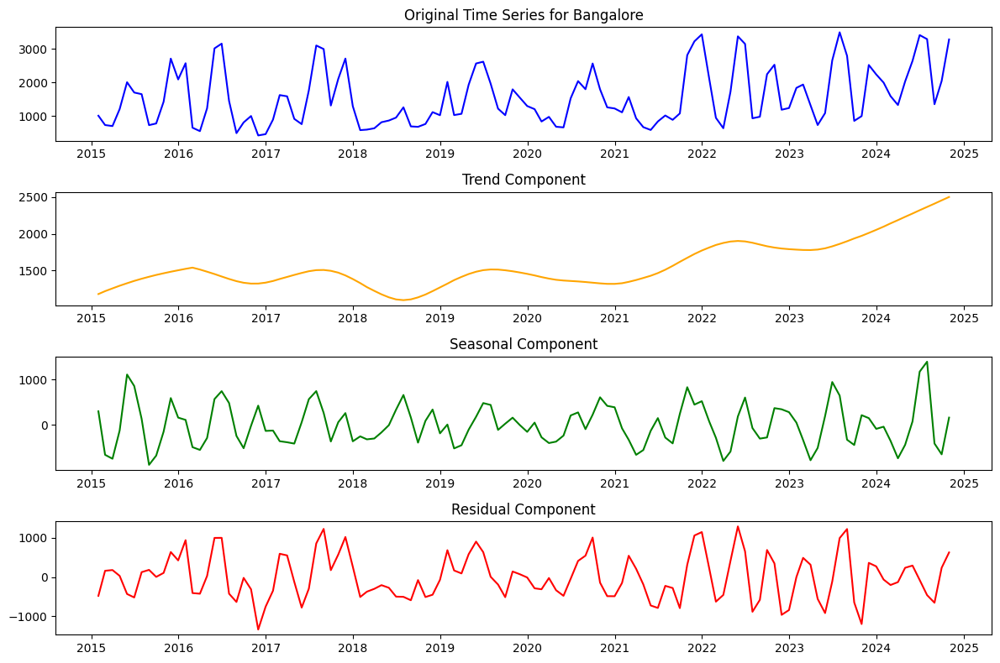

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


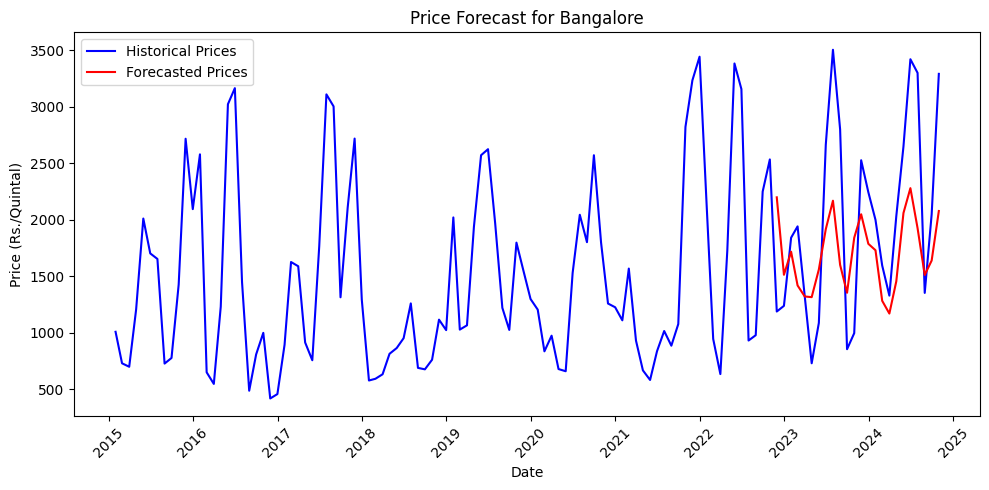

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


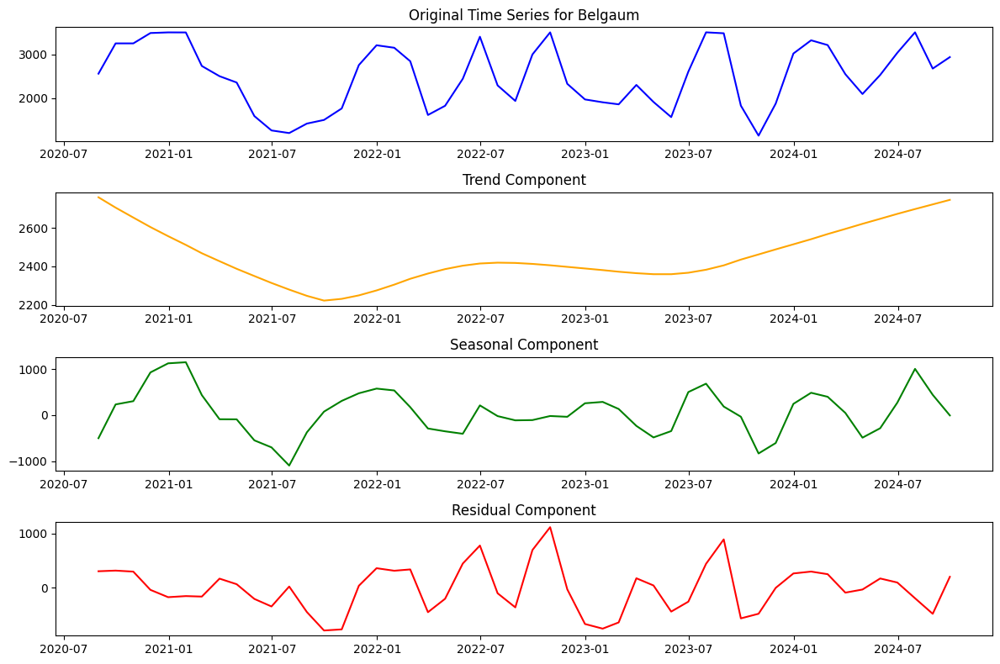

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


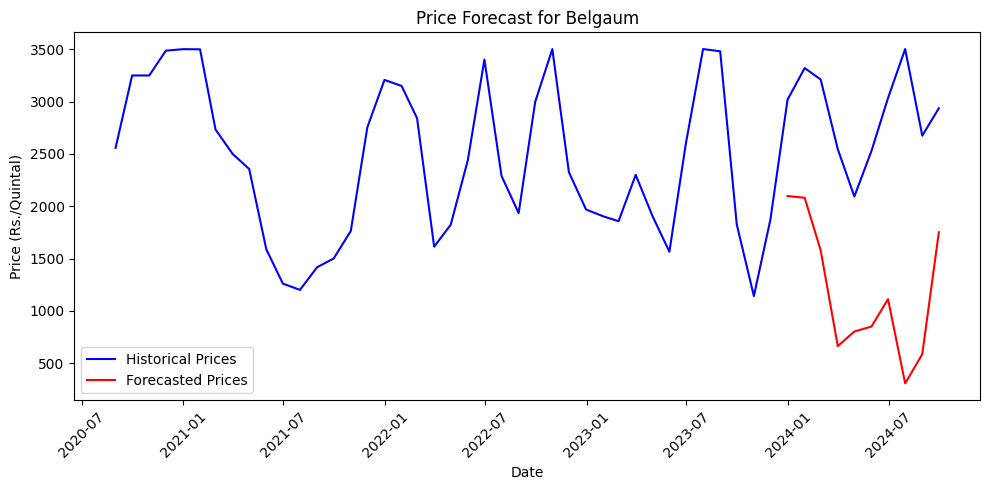

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


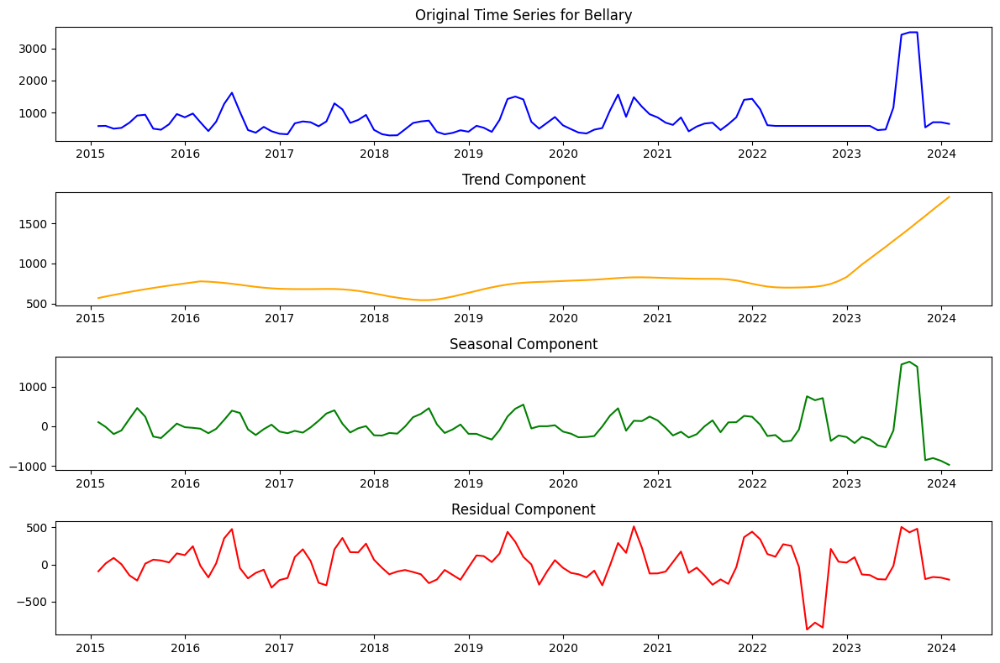

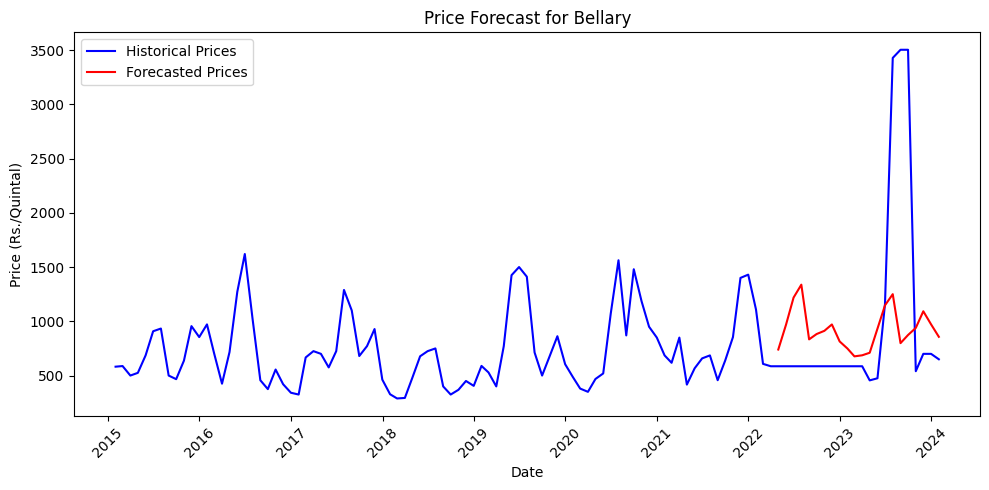

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


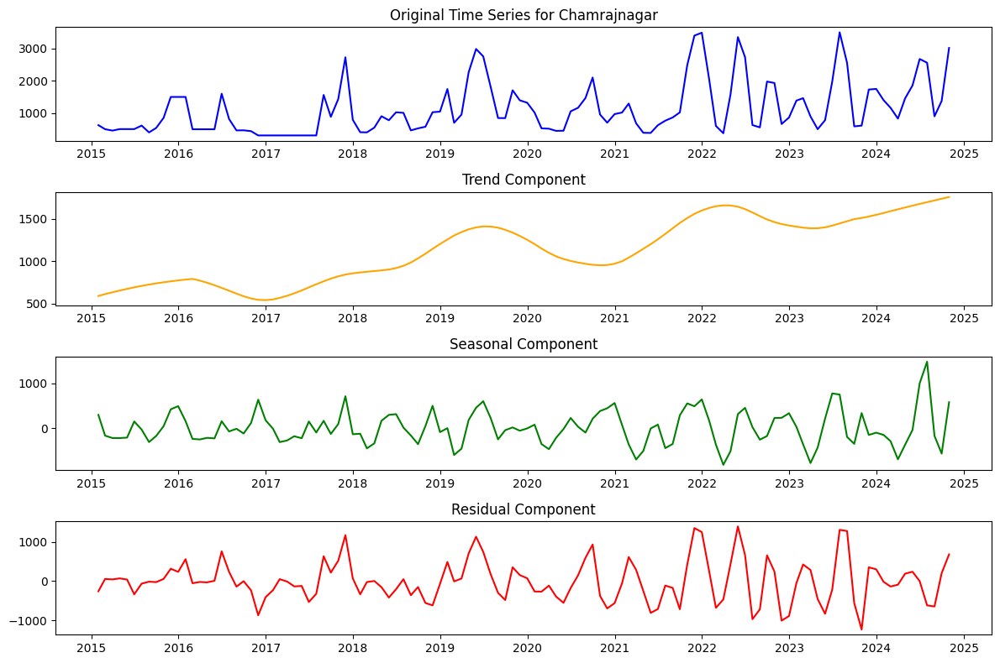

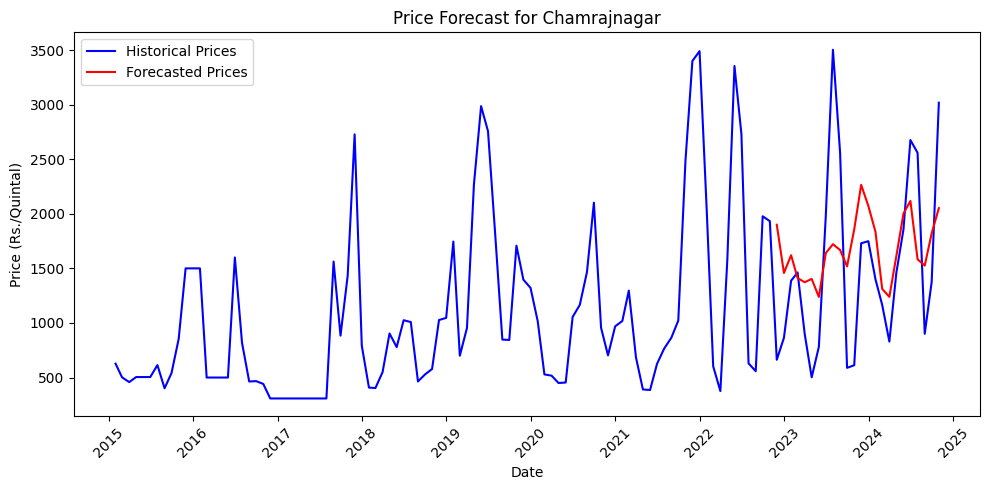

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


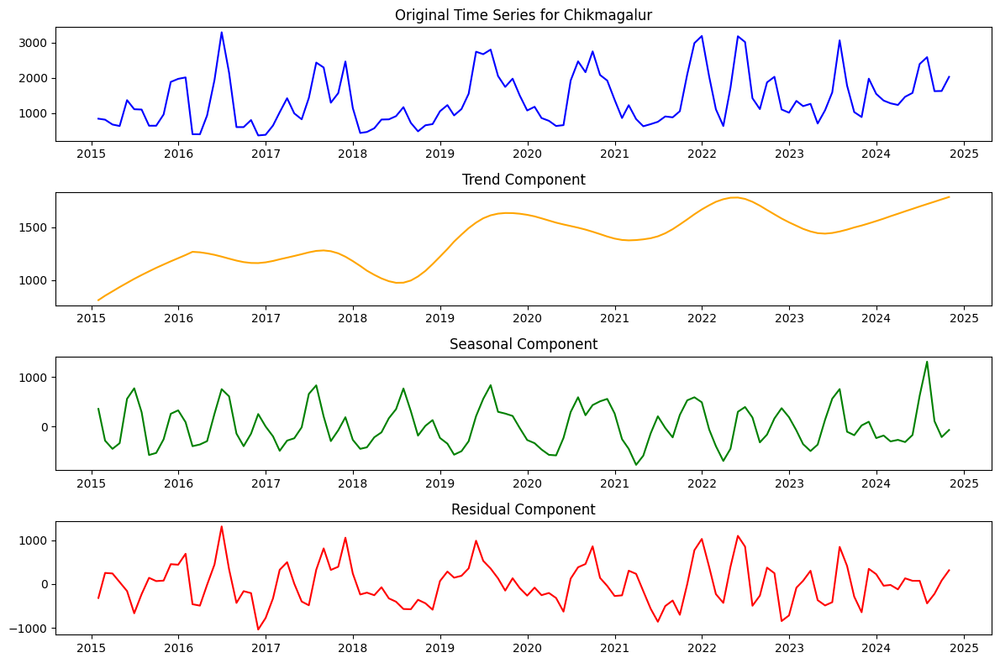

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


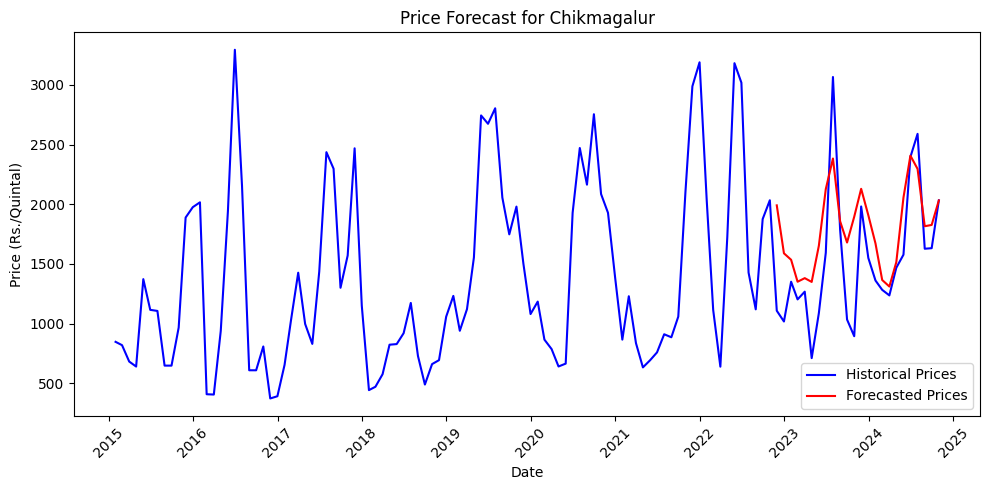

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


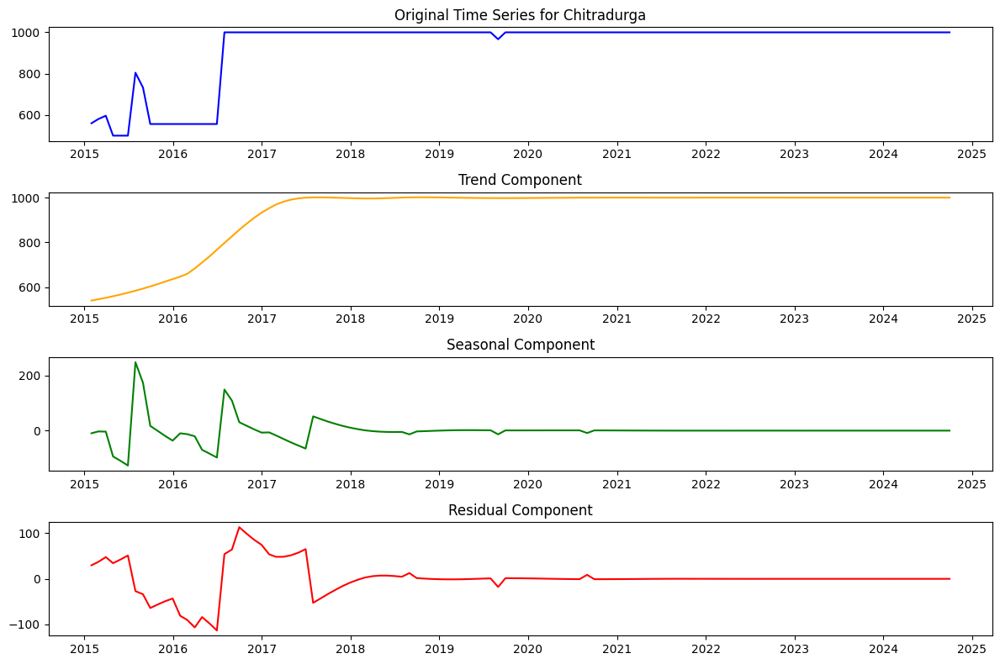

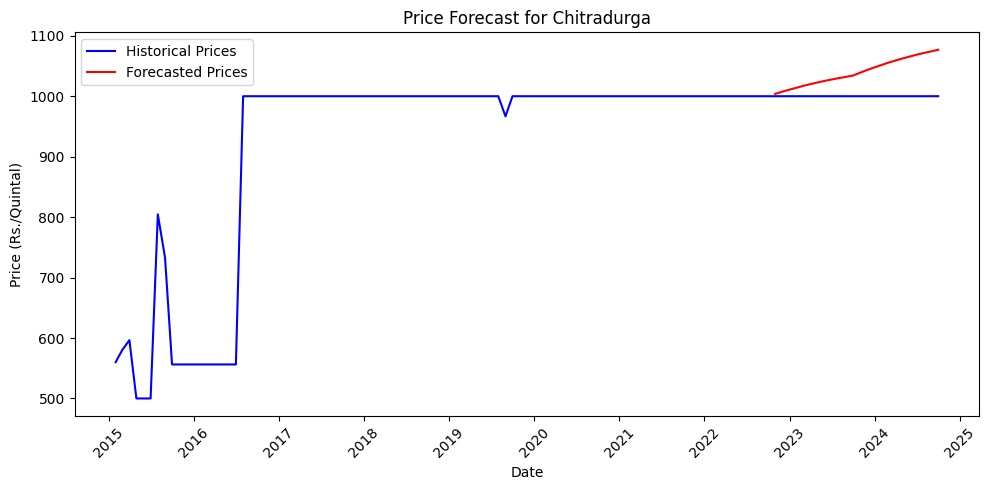

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


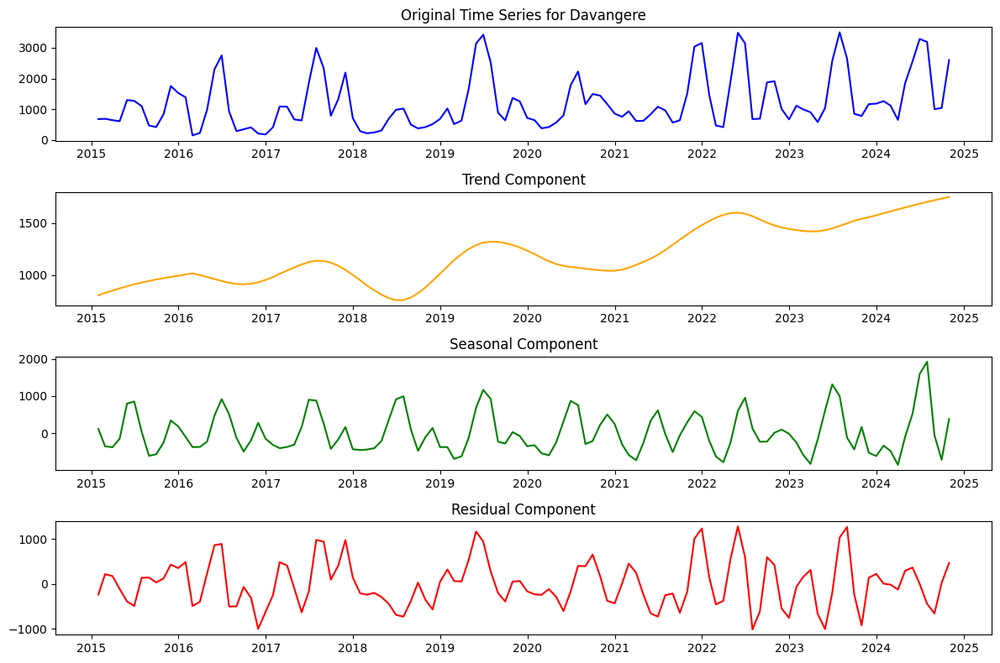

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


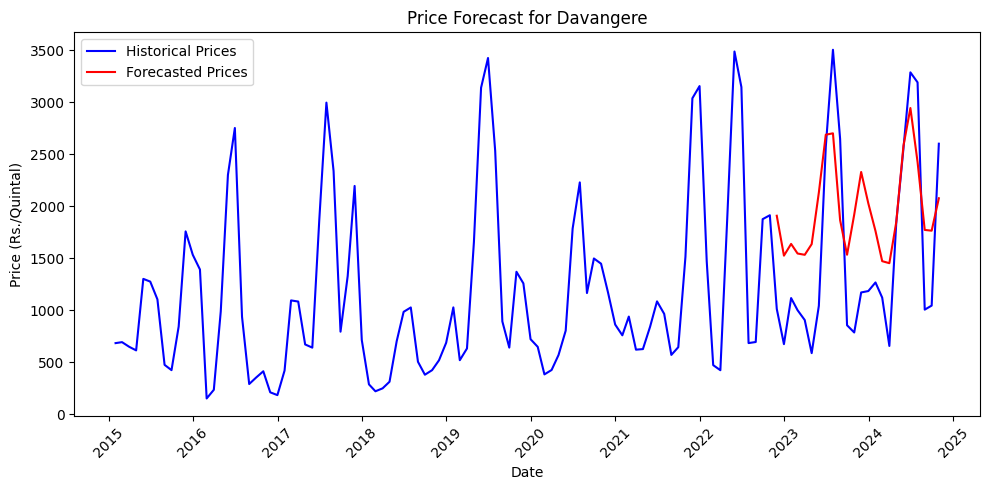

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


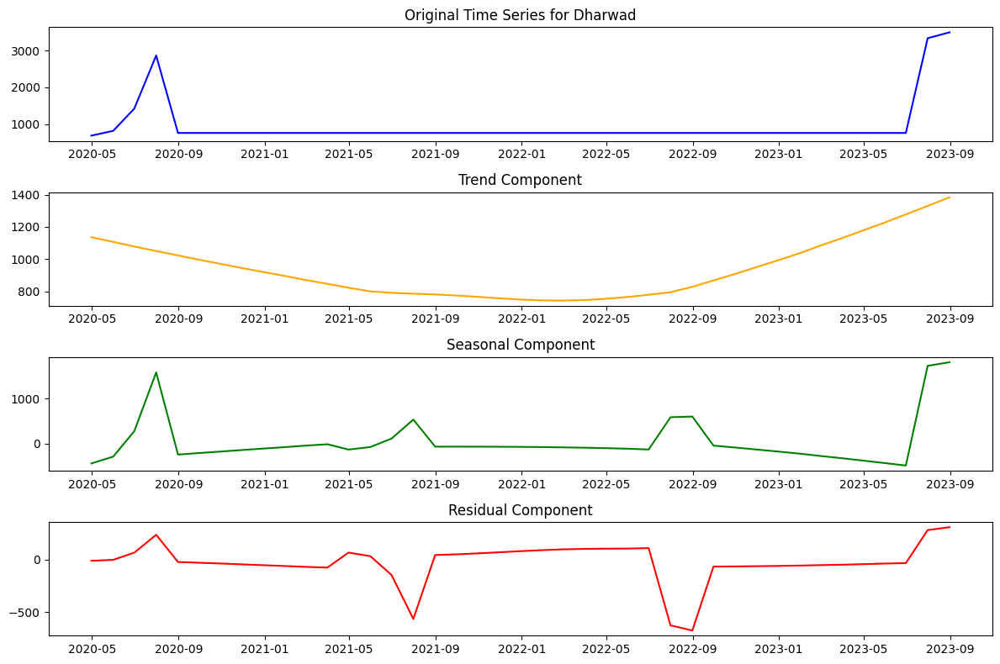

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


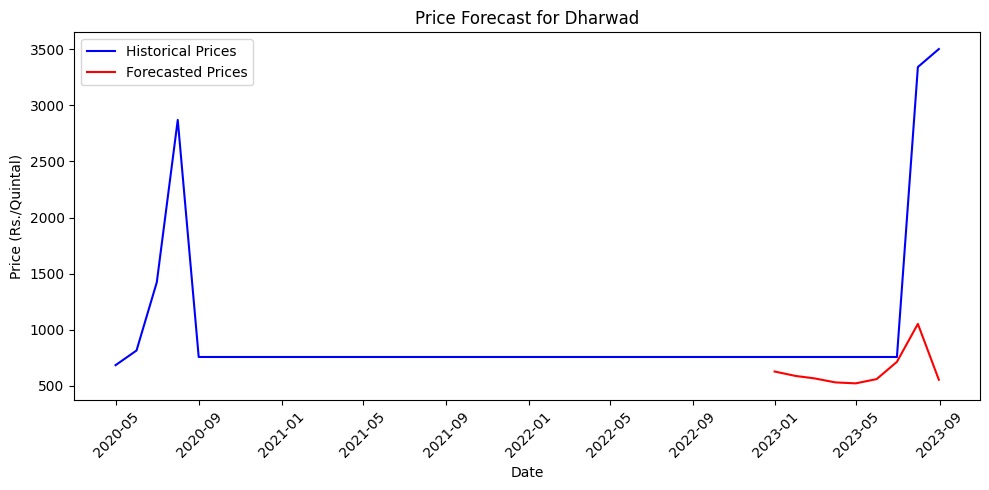

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


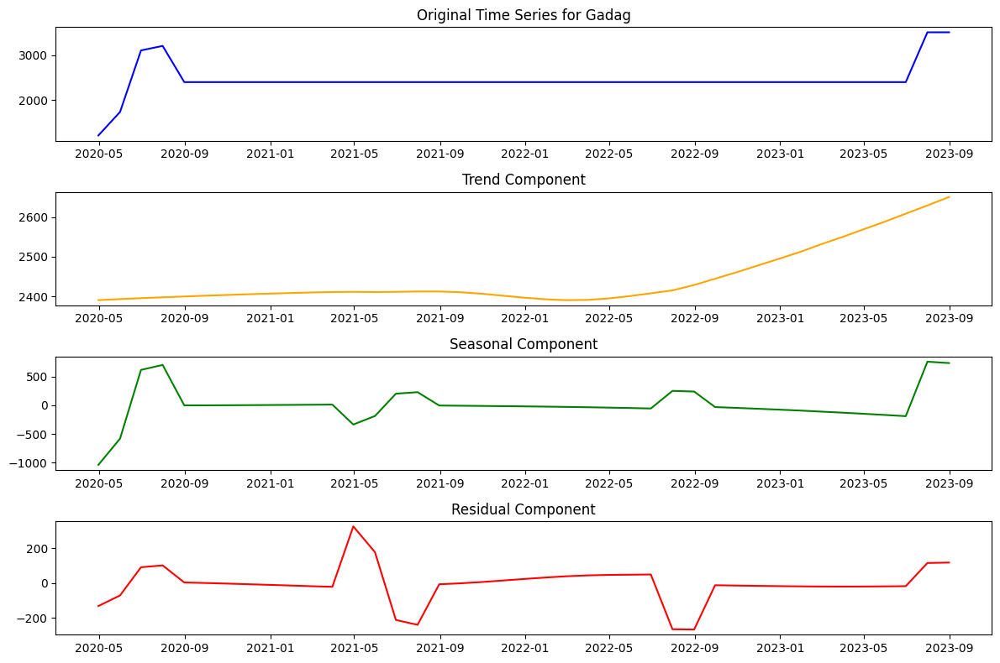

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


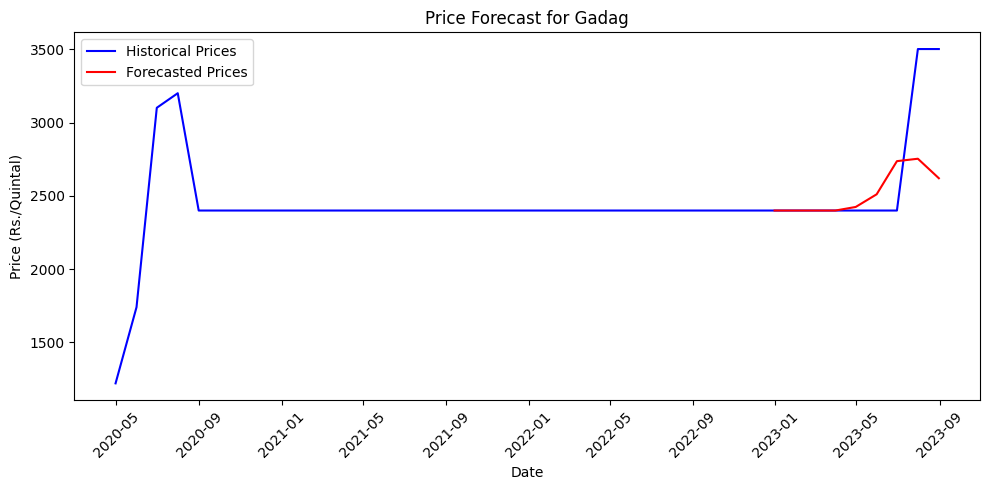

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


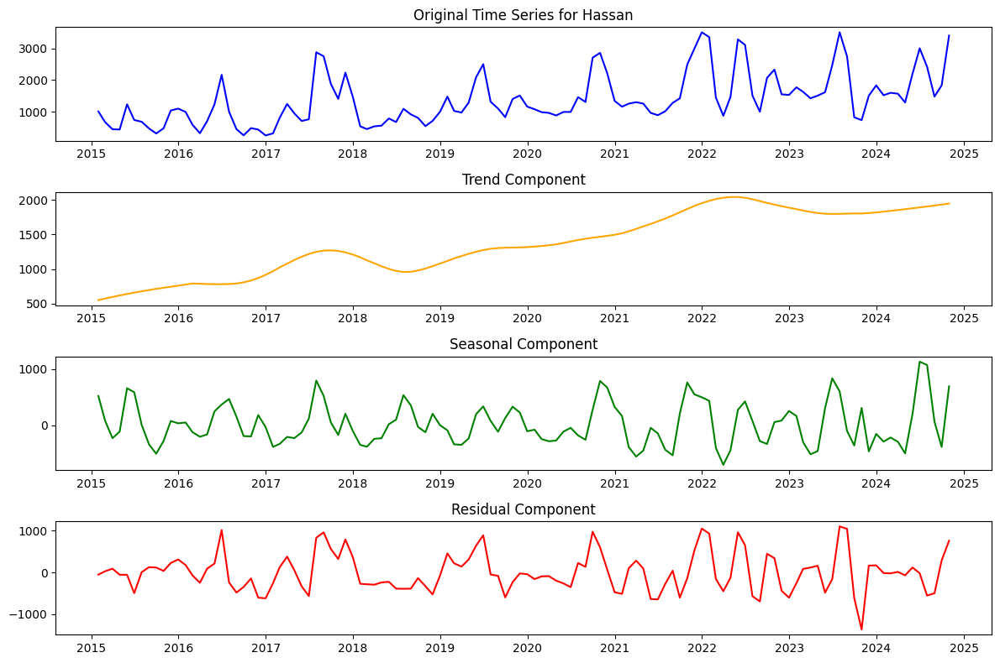

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


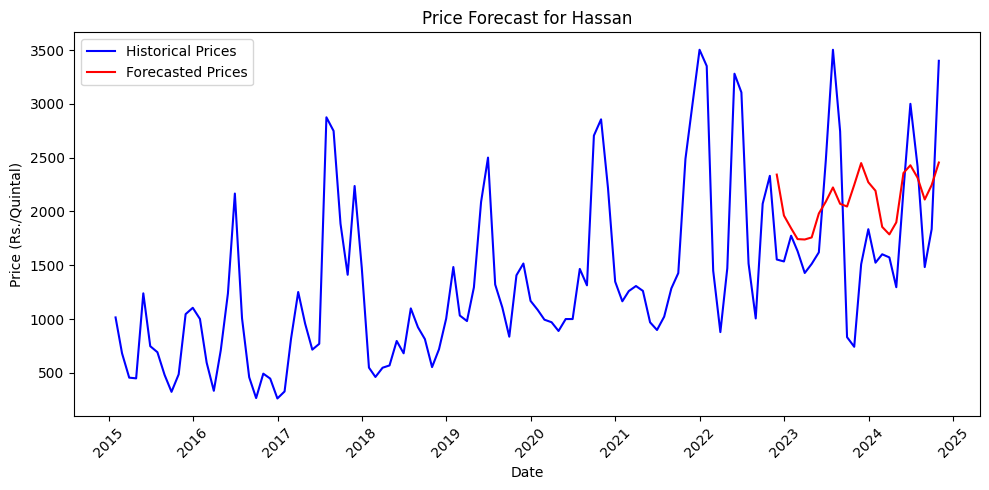

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


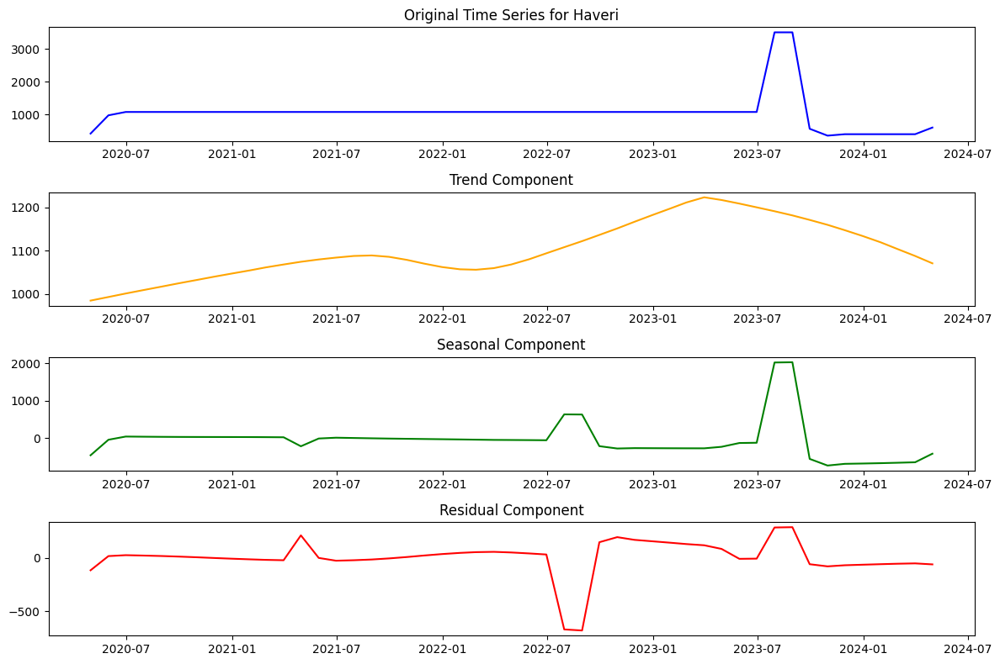

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


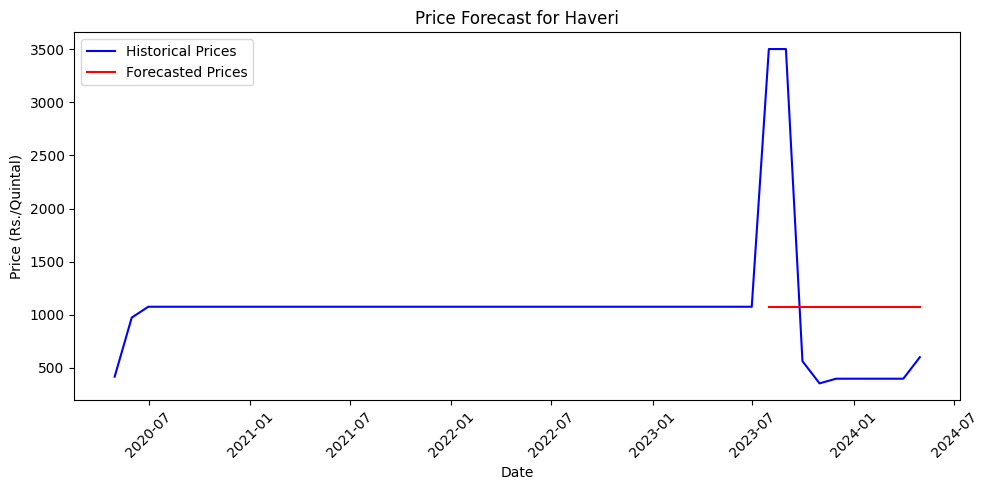

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


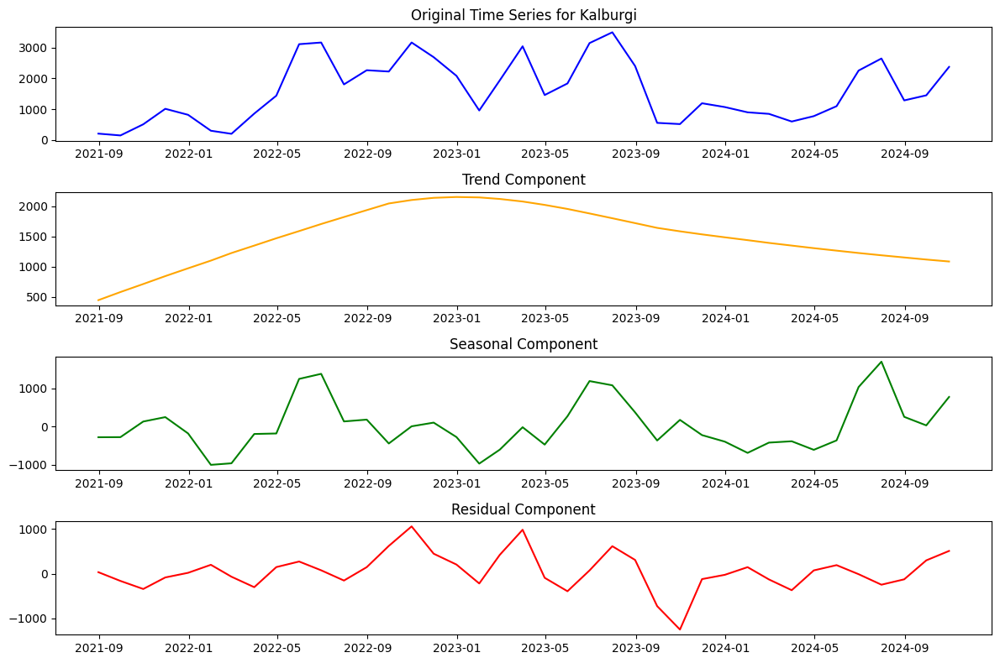

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


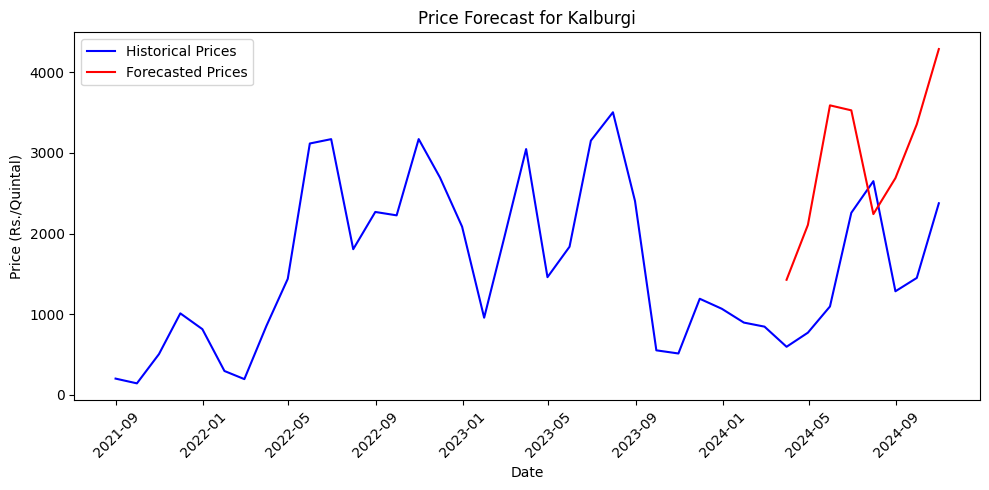

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


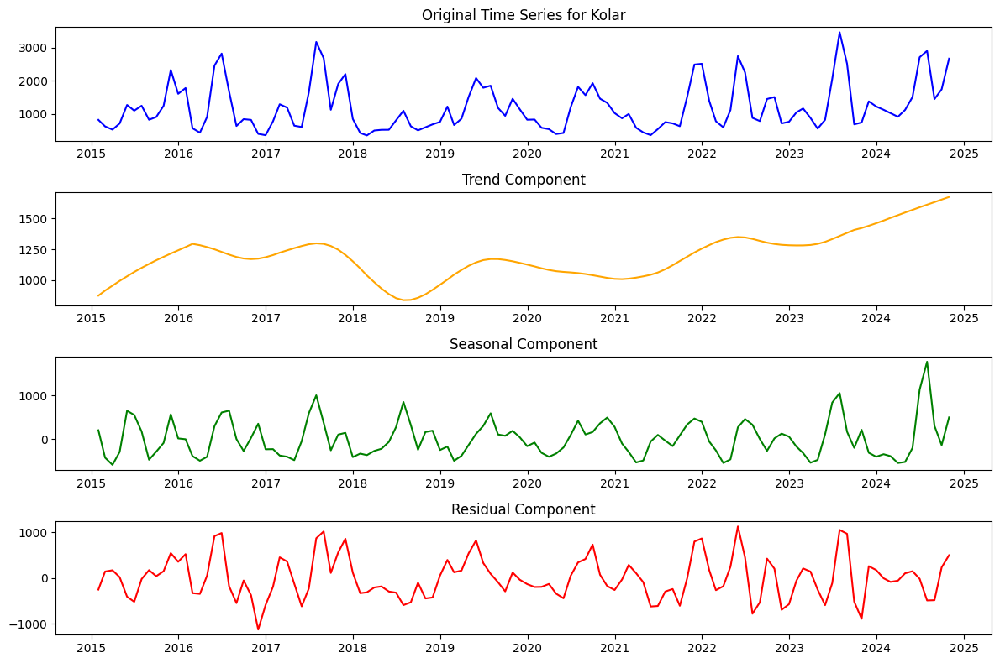

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


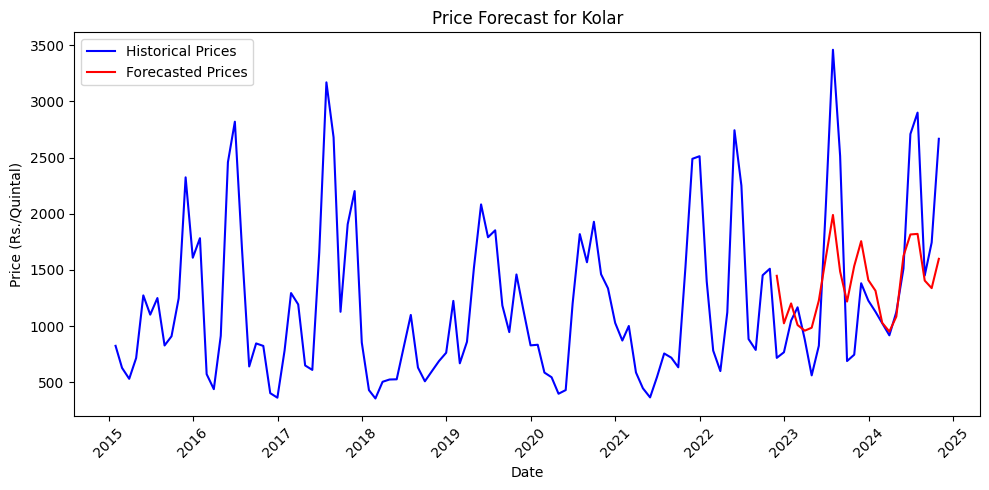

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


Not enough data for Koppal. Skipping decomposition.
Not enough data for Madikeri(Kodagu). Skipping decomposition.


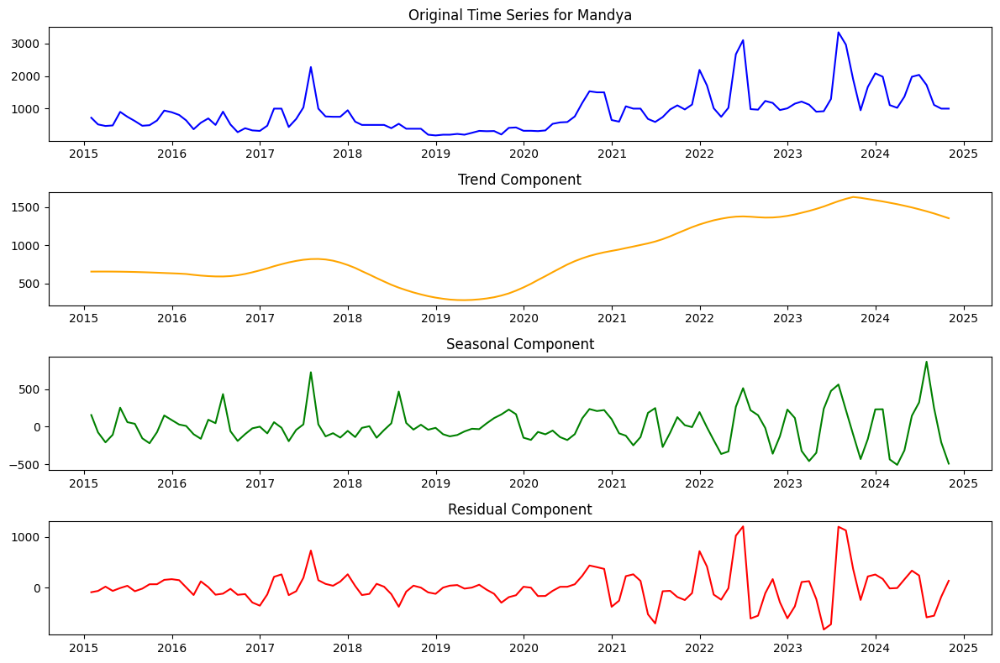

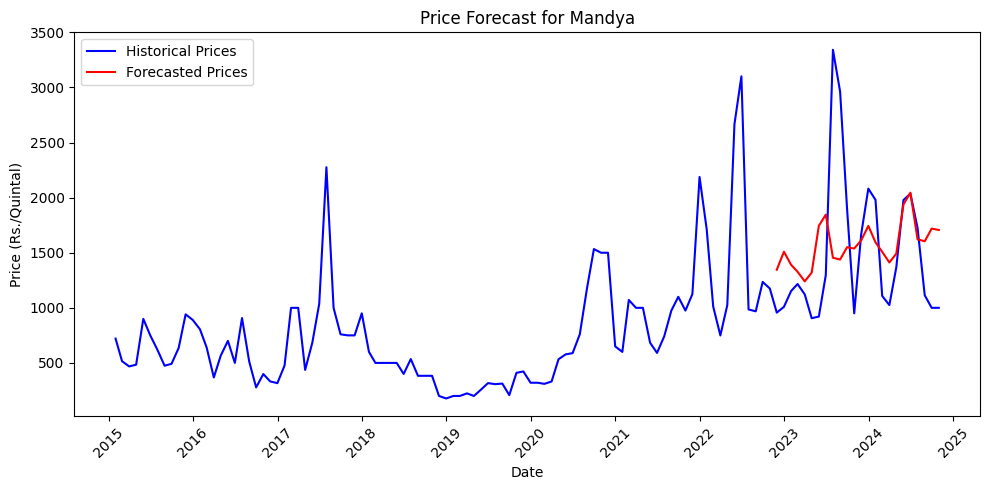

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


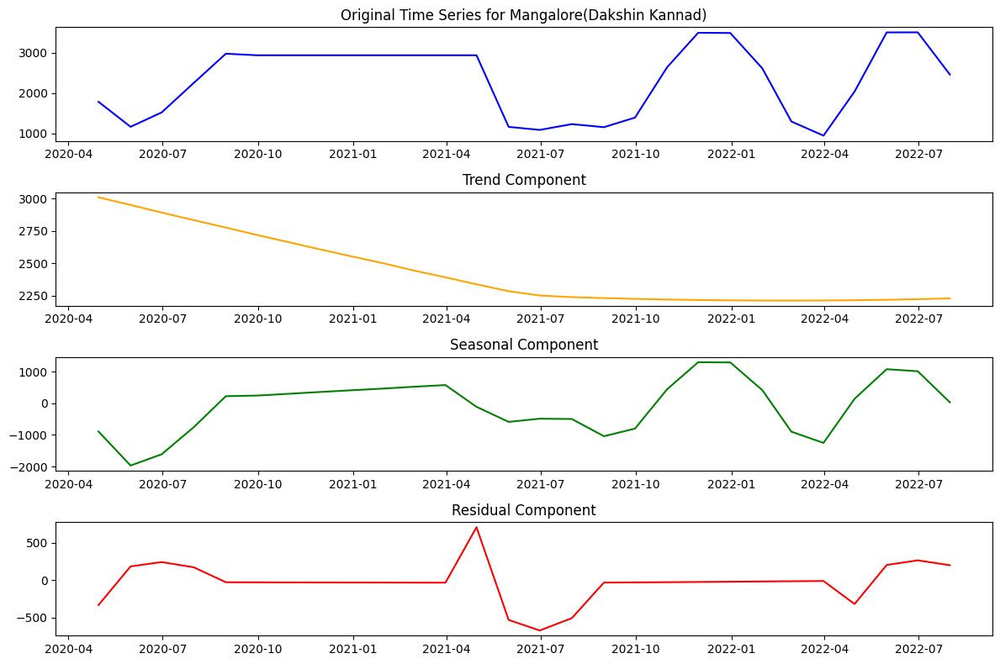

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


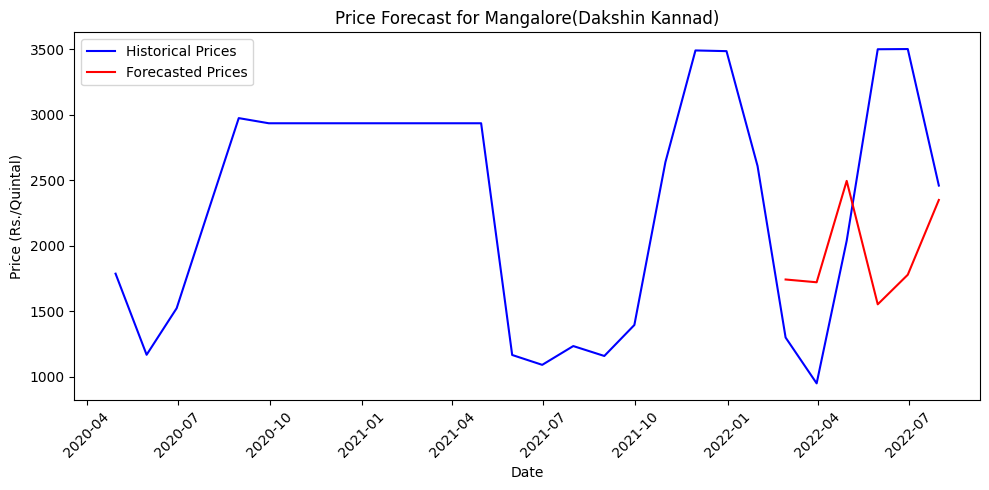

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


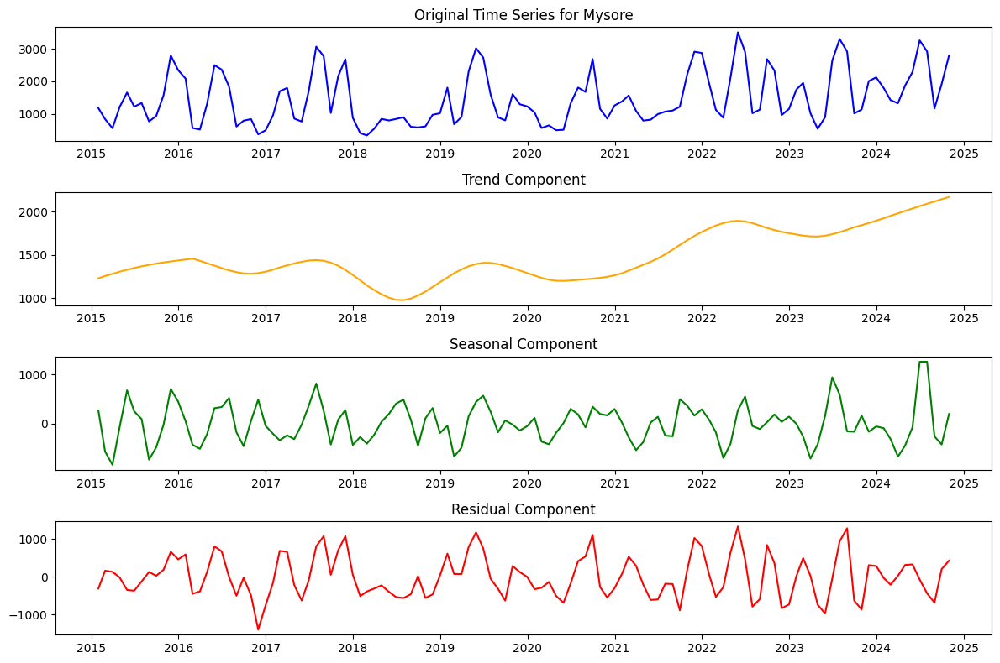

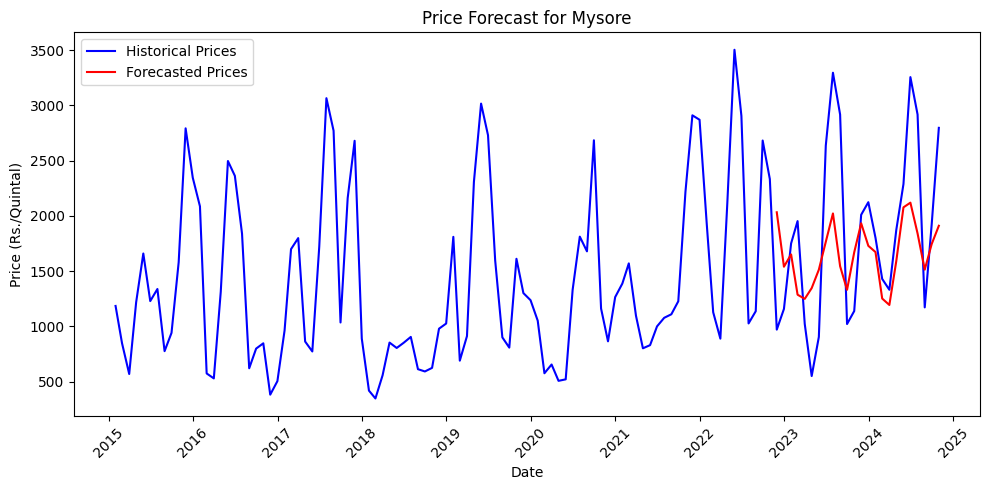

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


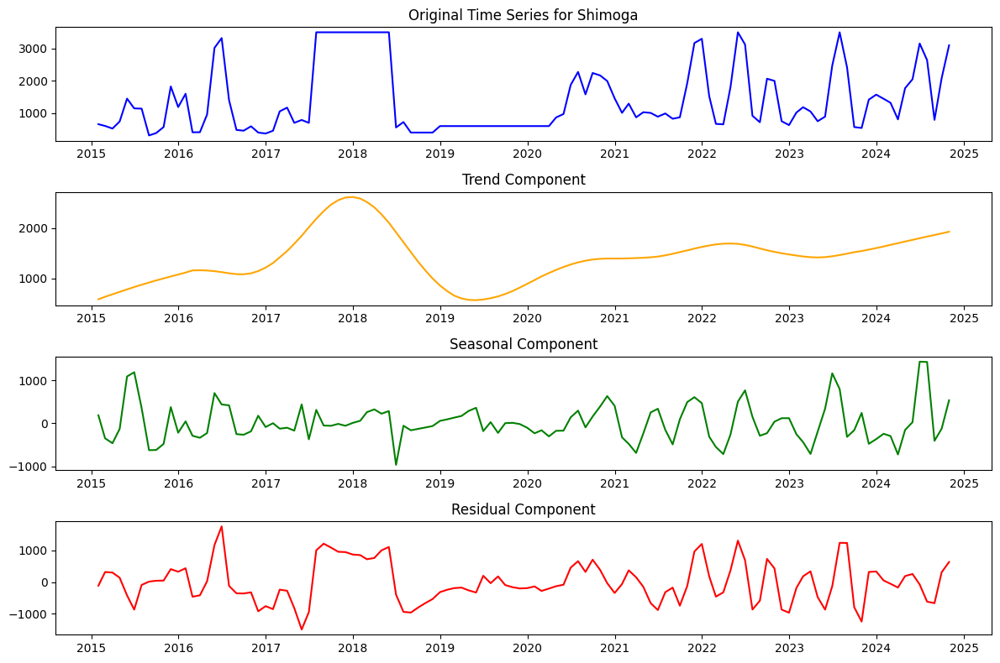

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


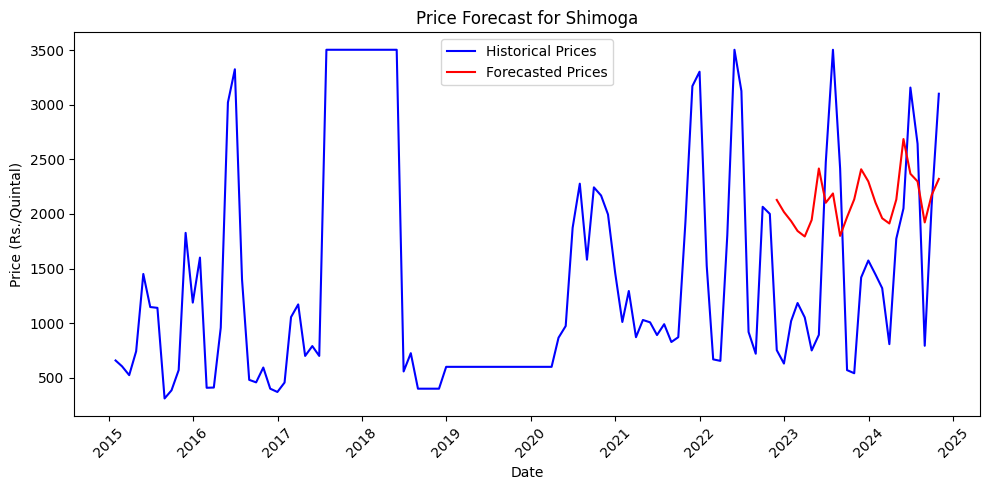

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


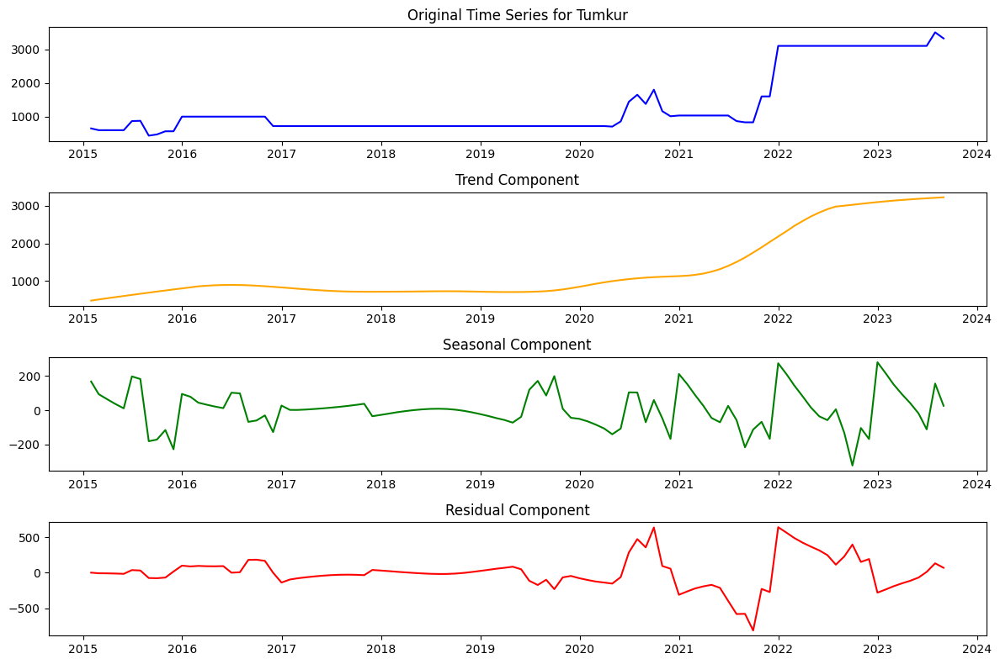

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


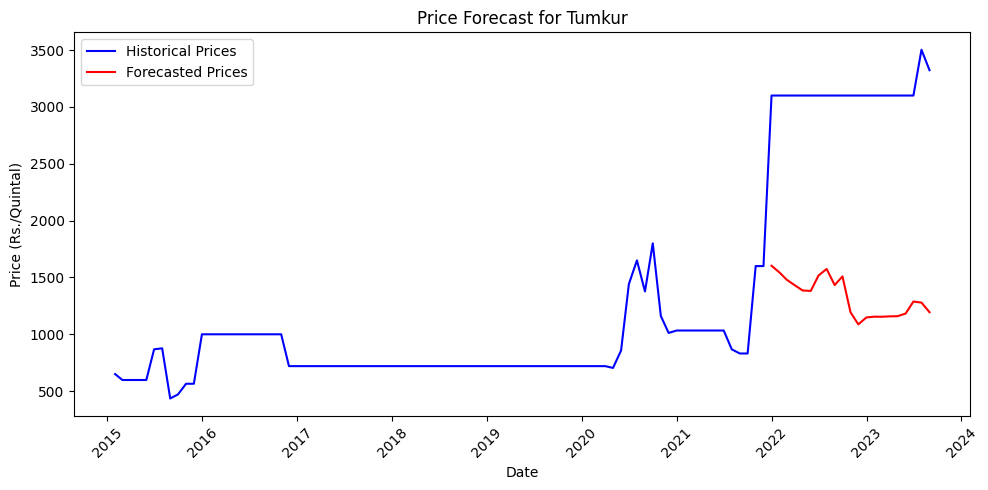

<ipython-input-82-c86ad142acfa>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-82-c86ad142acfa>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


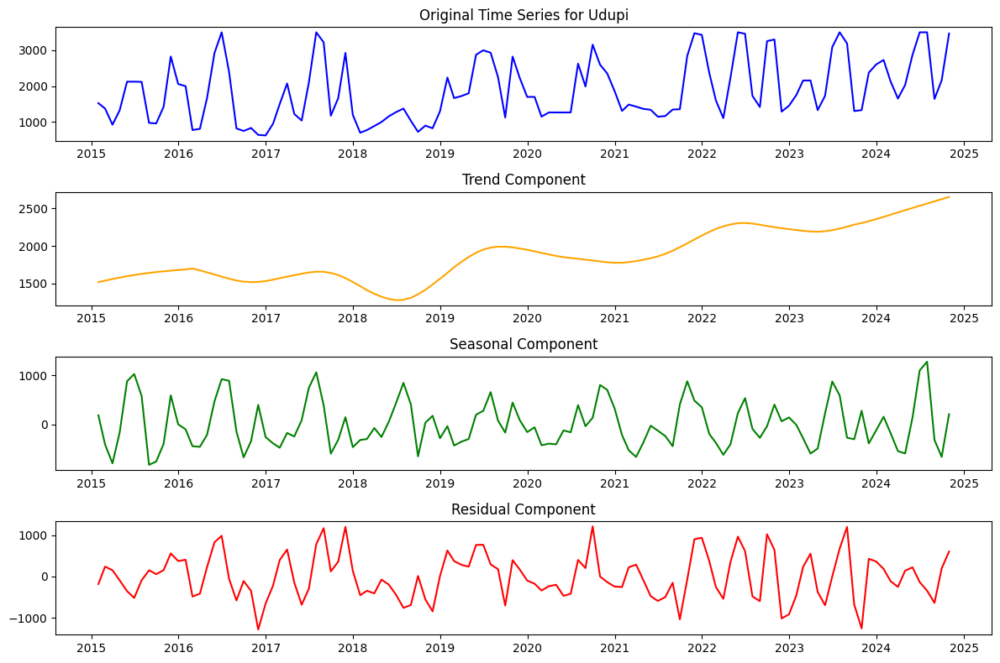

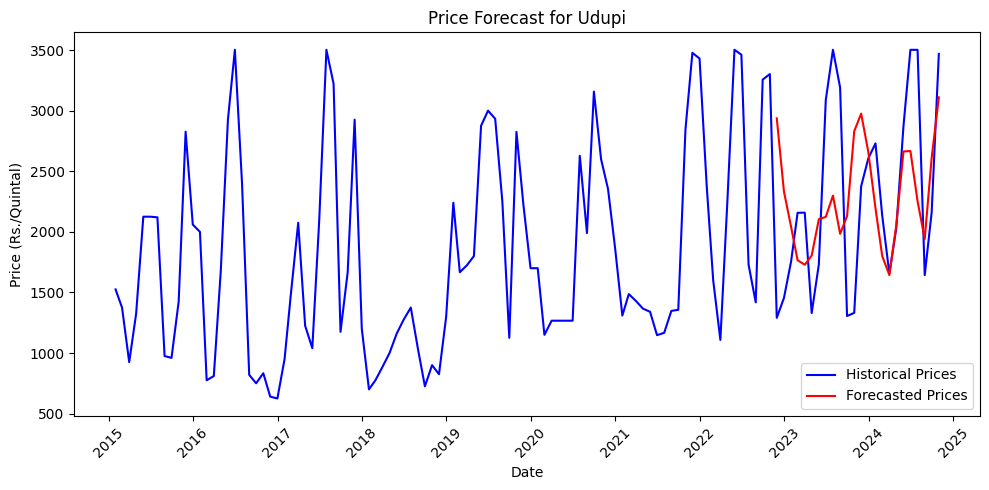

                                   MAE           MSE         RMSE          R2
Bangalore                   614.838585  5.360039e+05   732.122902    0.243796
Belgaum                    1704.000757  3.276490e+06  1810.107717  -19.042435
Bellary                     603.101722  9.684553e+05   984.101249    0.013027
Chamrajnagar                618.822881  5.531954e+05   743.771049    0.167822
Chikmagalur                 342.781206  1.970238e+05   443.873620    0.336942
Chitradurga                  40.017119  2.102307e+03    45.850922    0.000000
Davangere                   661.204975  5.379051e+05   733.420168    0.356100
Dharwad                     714.527117  1.574501e+06  1254.791048   -0.280473
Gadag                       233.678688  1.627994e+05   403.484137    0.225087
Hassan                      554.177464  4.539418e+05   673.752018    0.070578
Haveri                      995.305556  1.509151e+06  1228.475075   -0.000392
Kalburgi                   1443.714204  2.461822e+06  1569.01934

In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import STL
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Assuming your dataframe tomato_df has 'Date' already as the index
# Group the data by District_Market and Date, then aggregate the prices
aggregated_df = tomato_df.groupby(['District Name', tomato_df.index]).agg({'Capped Prices': 'mean'}).reset_index()

# Rename the columns for clarity
aggregated_df.columns = ['District Name', 'Date', 'Capped Prices']

# Set the 'Date' column as the index again
aggregated_df.set_index('Date', inplace=True)

# Group the data by District_Market for analysis
grouped = aggregated_df.groupby('District Name')

# Initialize a dictionary to store forecast results, metrics, and smoothed data
forecast_results = {}
performance_metrics = {}
smoothed_data = {}

# Iterate over each group (district)
for district, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:  # Minimum 12 data points for a seasonal period of 12
        print(f"Not enough data for {district}. Skipping decomposition.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency and ensure it's odd and >= 3
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Store smoothed data (trend + seasonal)
    smoothed = trend + seasonal
    smoothed_data[district] = smoothed

    # Optionally plot the decomposition
    plt.figure(figsize=(12, 8))
    plt.subplot(4, 1, 1)
    plt.plot(group, label='Original', color='blue')
    plt.title(f'Original Time Series for {district}')
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend', color='orange')
    plt.title('Trend Component')
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal', color='green')
    plt.title('Seasonal Component')
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residual', color='red')
    plt.title('Residual Component')
    plt.tight_layout()
    plt.show()

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Split the data into training and testing sets for forecasting
    train_size = int(len(group) * 0.8)
    train, test = group[:train_size], group[train_size:]

    # Train a SARIMA model on the original data (or you could use detrended_data if needed)
    model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    model_fit = model.fit(disp=False)

    # Forecast for the test period
    forecast = model_fit.forecast(steps=len(test))

    # Store the forecast results
    forecast_results[district] = forecast

    # Calculate performance metrics
    mae = mean_absolute_error(test, forecast)
    mse = mean_squared_error(test, forecast)
    rmse = np.sqrt(mse)
    r2 = r2_score(test, forecast)

    # Store metrics for the district
    performance_metrics[district] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

    # Optional: Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(group, label='Historical Prices', color='blue')
    plt.plot(forecast, label='Forecasted Prices', color='red')
    plt.title(f'Price Forecast for {district}')
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Convert forecast results to DataFrame for further analysis or export
forecast_df = pd.DataFrame(forecast_results)

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T
print(performance_df)


In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller


In [ ]:
tomato_df.head()

,District Name,Variety,Modal Price (Rs./Quintal),Capped Prices
Price Date,,,,
2015-01-01,Kolar,Tomato,1100,1100.0
2015-01-01,Kolar,Tomato,750,750.0
2015-01-01,Davangere,Tomato,900,900.0
2015-01-01,Mandya,Tomato,1000,1000.0
2015-01-01,Bangalore,Tomato,1200,1200.0


In [ ]:
adufuller_result = adfuller(tomato_df['Capped Prices'],autolag = 'AIC')

print(f'ADF Statistic: {adufuller_result[0]}')
print(f'p-value: {adufuller_result[1]}')

for key, value in adufuller_result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -3.365542021054133
p-value: 0.012191151980252224
Critial Values:
   1%, -3.4304662429947816
Critial Values:
   5%, -2.861591377142328
Critial Values:
   10%, -2.5667973463317337


<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


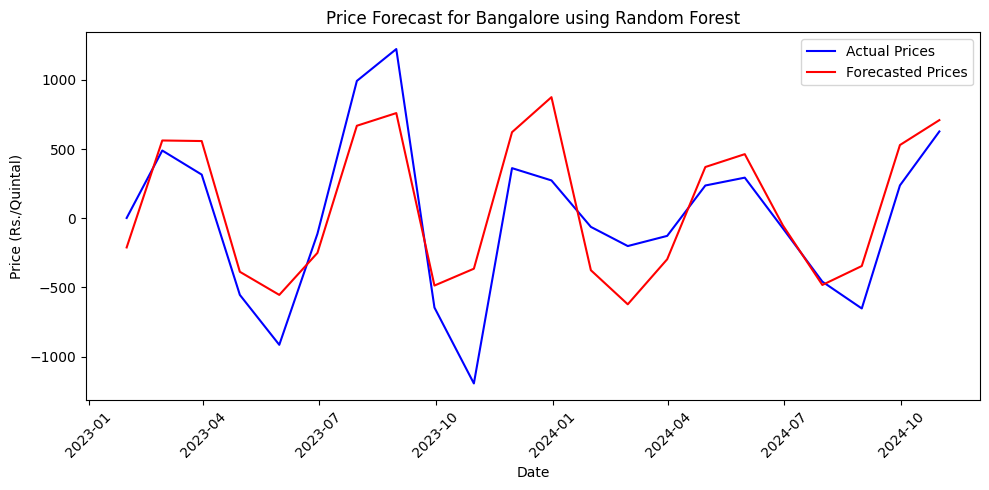

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


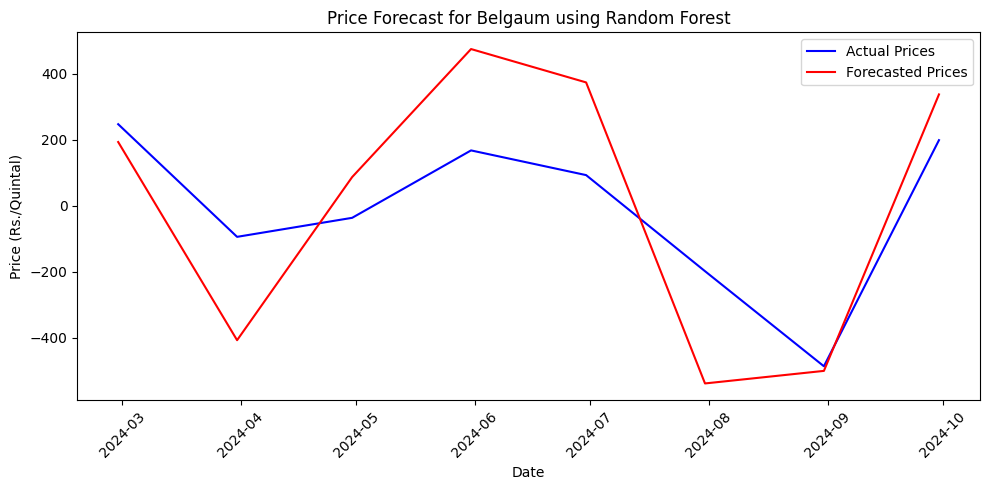

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


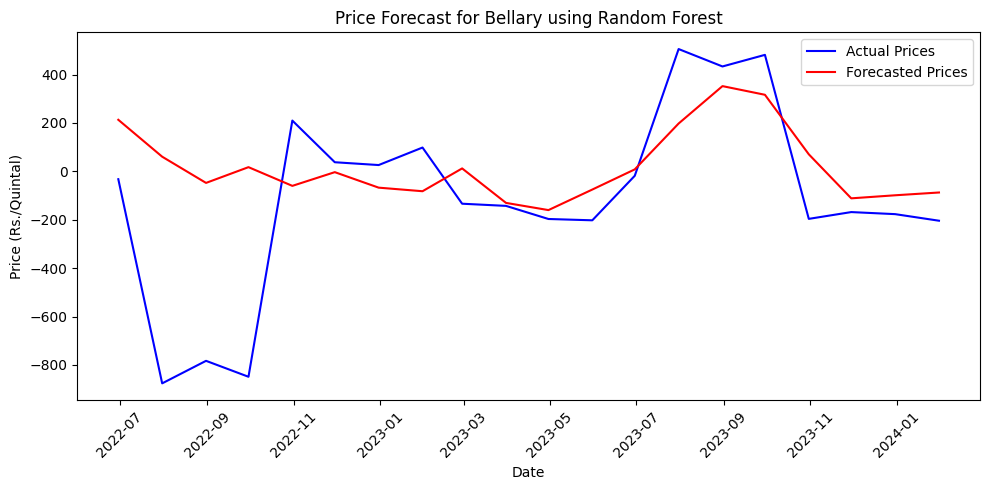

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


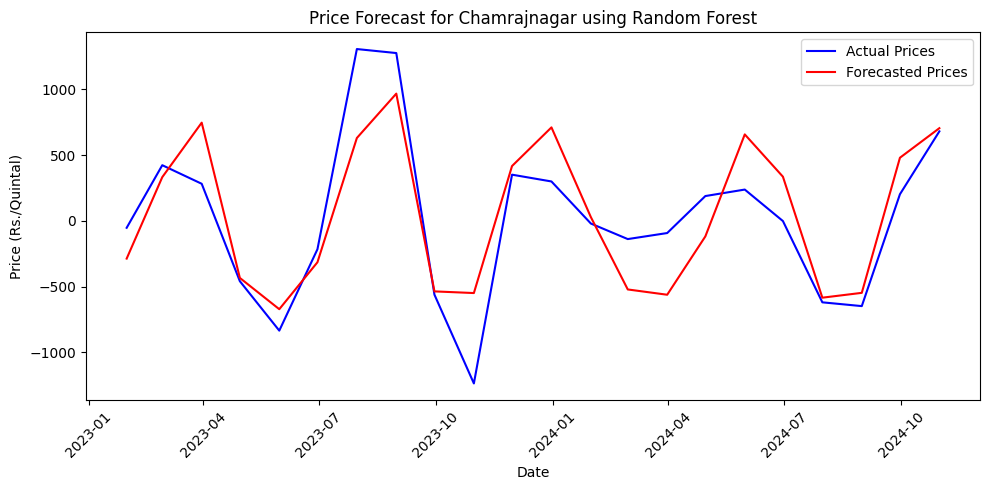

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


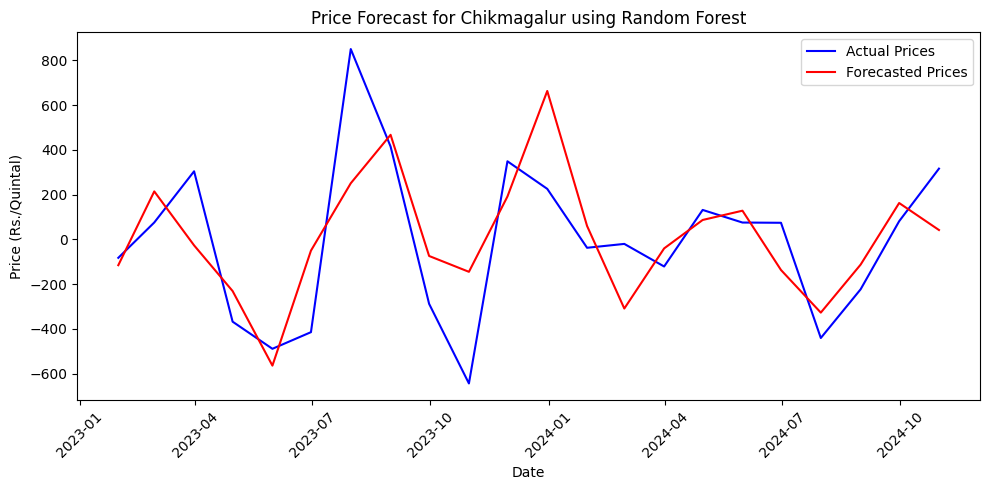

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


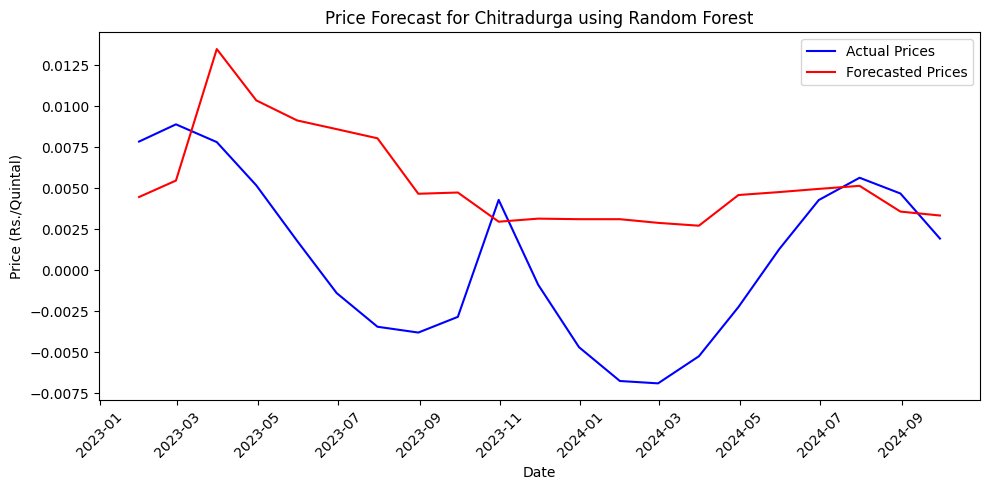

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


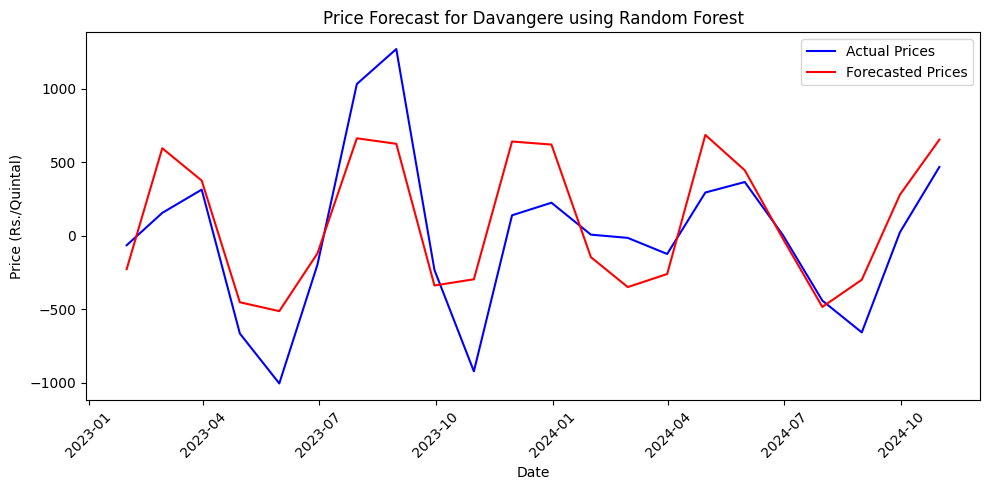

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


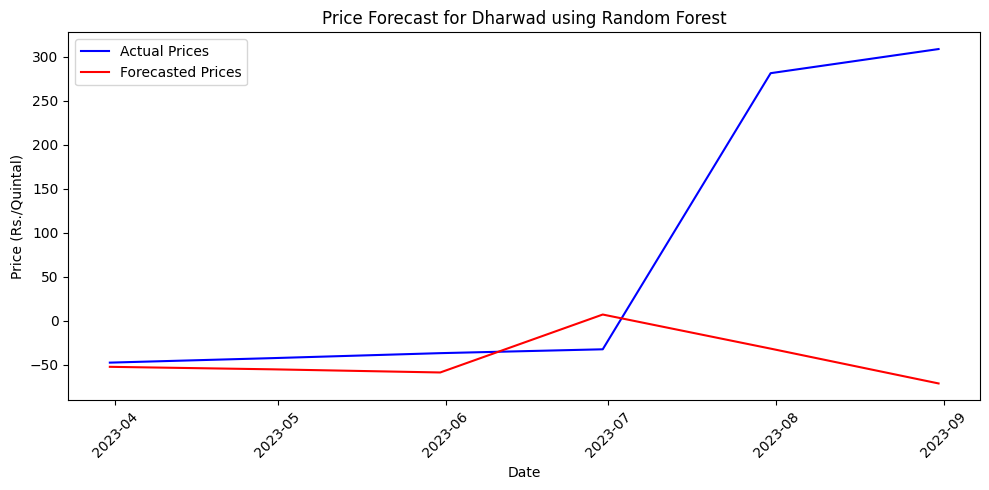

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


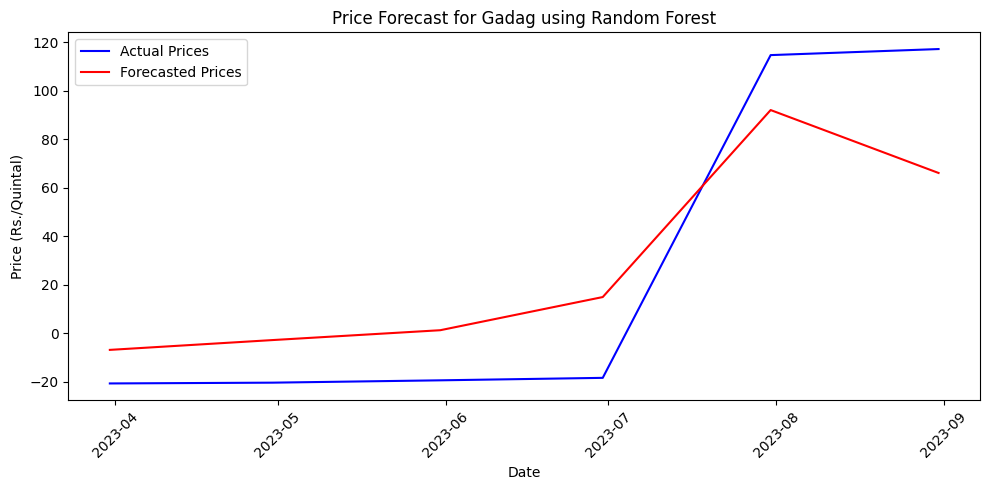

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


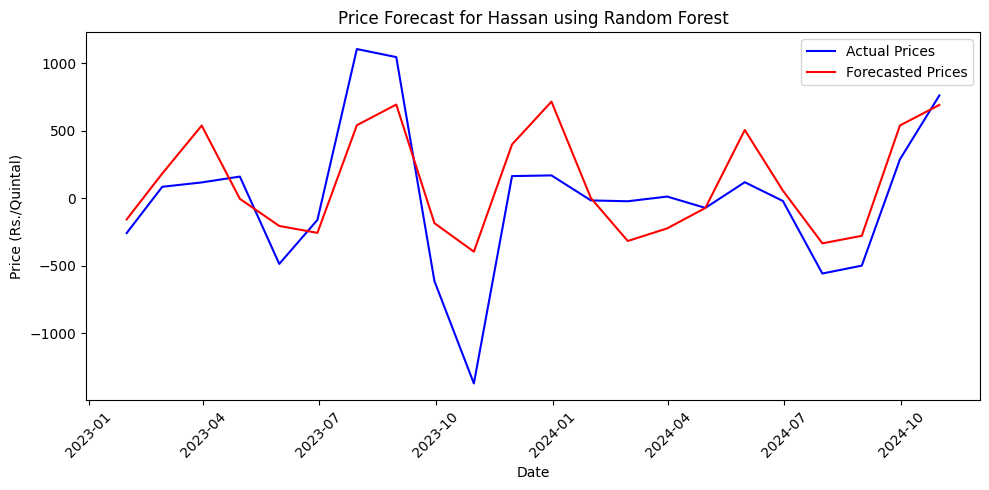

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


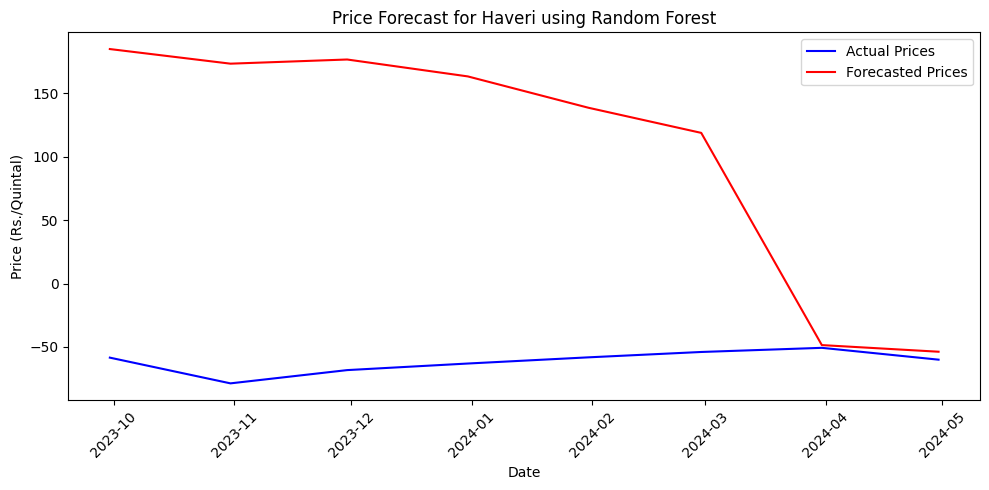

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


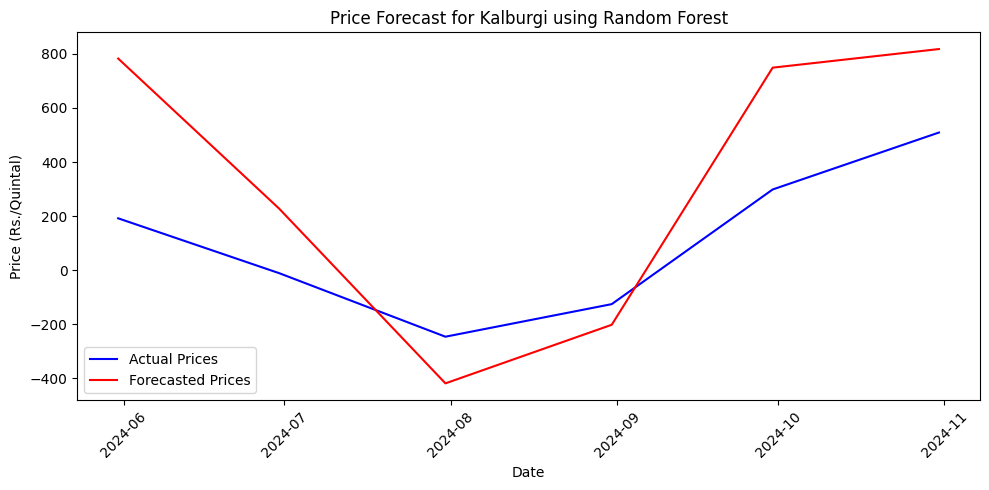

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


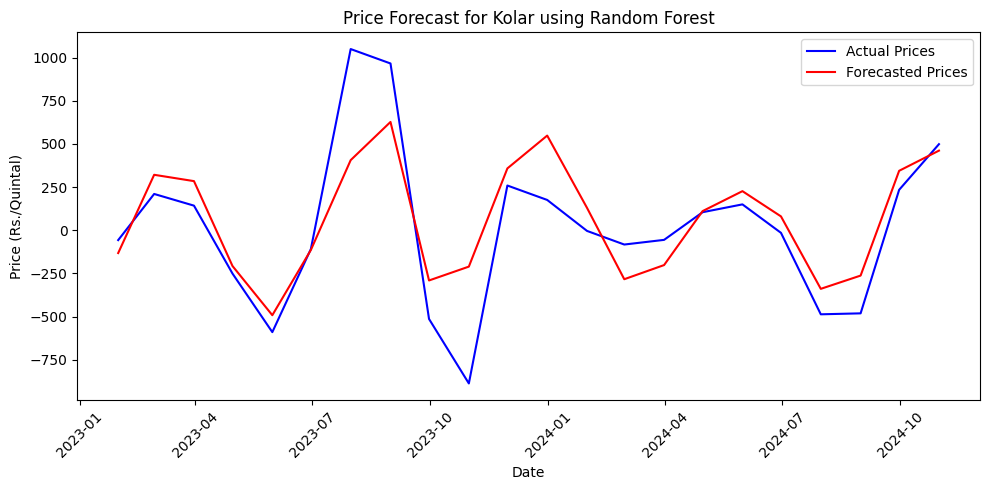

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


Not enough data for Koppal. Skipping decomposition.
Not enough data for Madikeri(Kodagu). Skipping decomposition.


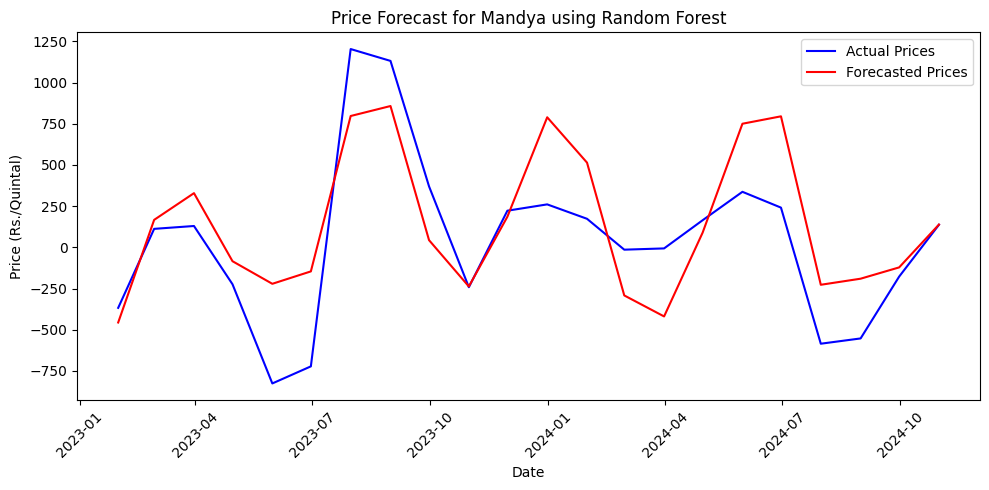

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


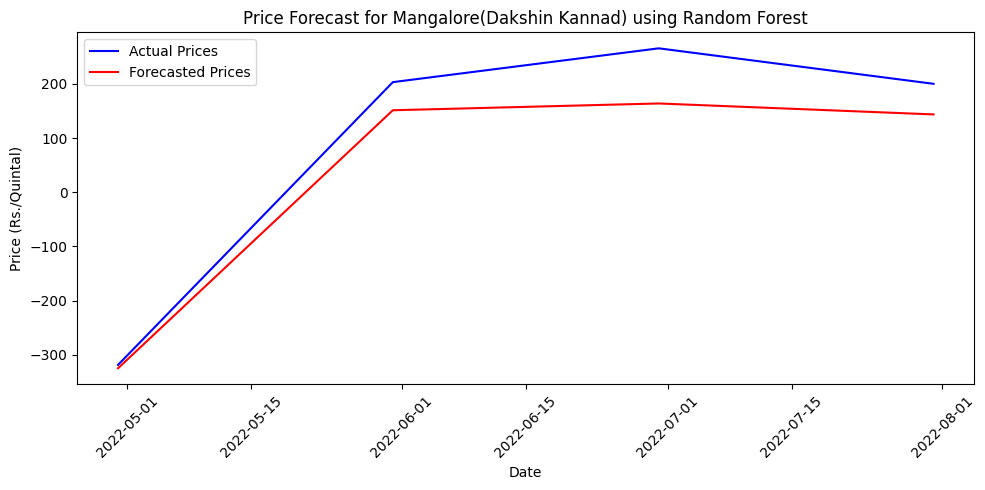

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


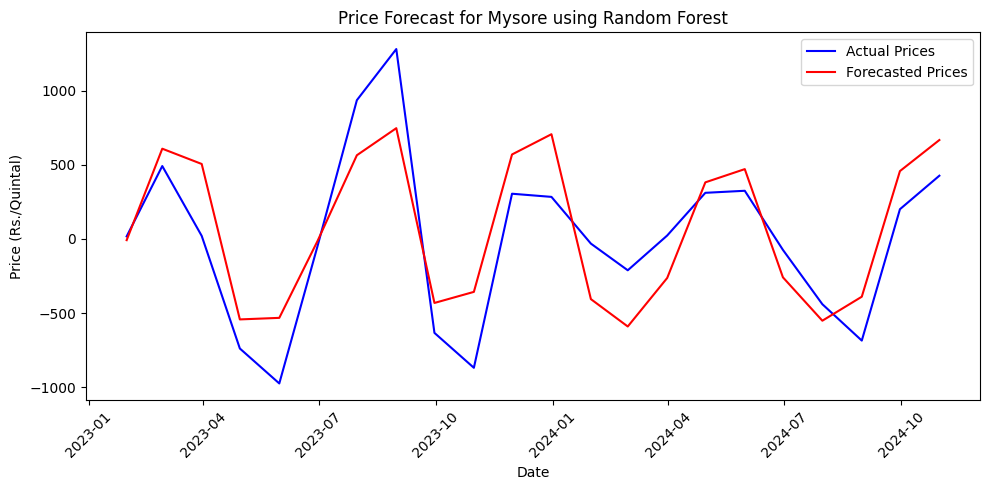

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


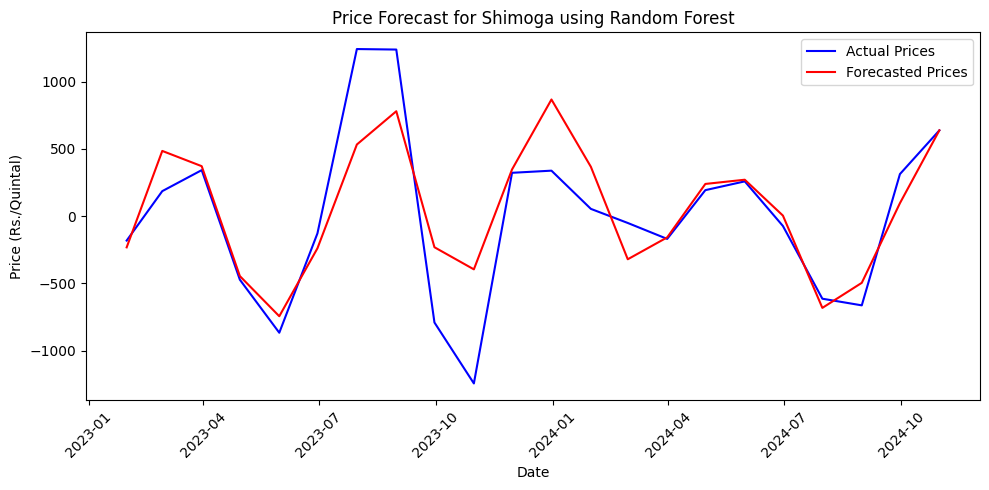

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


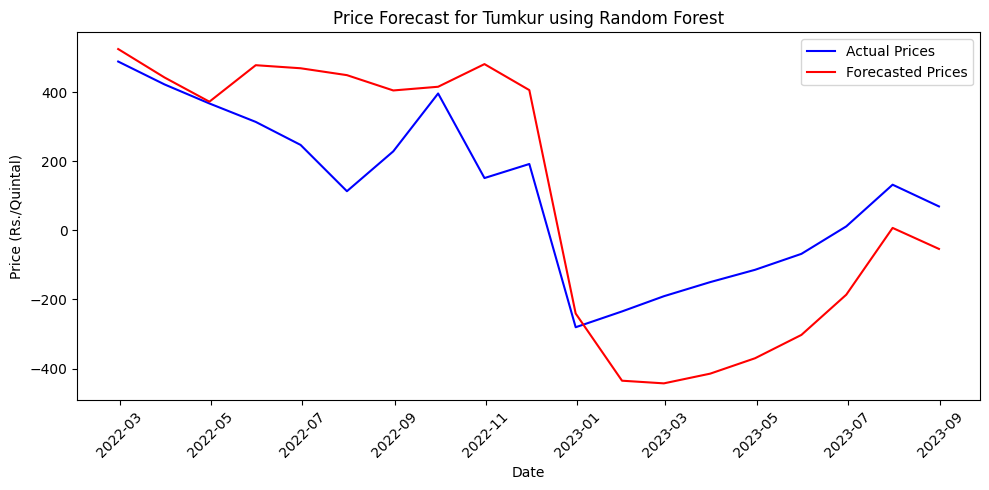

<ipython-input-39-748469b98547>:28: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-748469b98547>:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


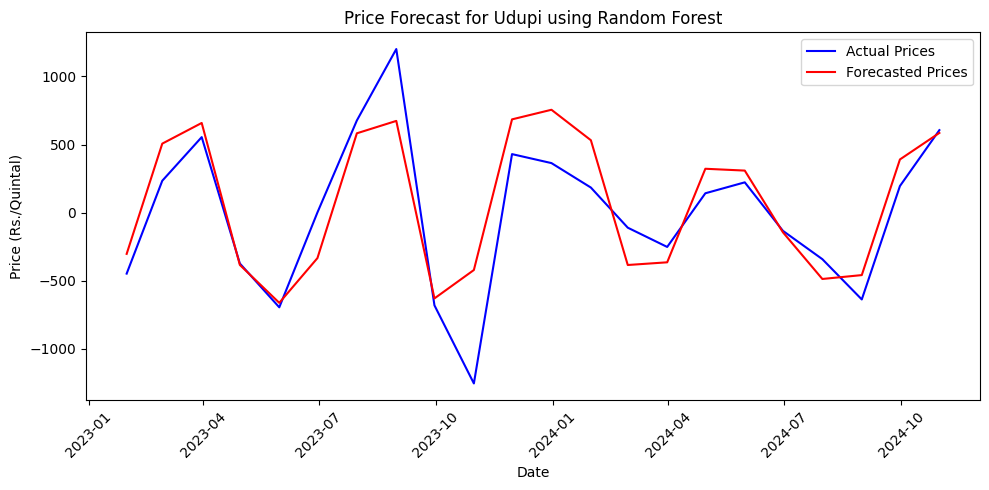

                                  MAE            MSE        RMSE          R2
Bangalore                  261.894047  103856.308754  322.267449    0.687578
Belgaum                    196.659044   53196.578292  230.643834   -0.006360
Bellary                    239.460953  130340.901691  361.027564    0.086012
Chamrajnagar               256.927337  107135.721037  327.315935    0.706409
Chikmagalur                199.705149   64345.994867  253.665123    0.457543
Chitradurga                  0.005584       0.000043    0.006527   -0.786842
Davangere                  274.691916  109922.972162  331.546335    0.618365
Dharwad                    128.703401   40795.103923  201.977979   -0.630426
Gadag                       26.503191     858.972748   29.308237    0.789720
Hassan                     274.404571  122947.883254  350.639249    0.566211
Haveri                     168.186429   37871.250625  194.605372 -559.030572
Kalburgi                   306.183356  123249.233899  351.068703   -0.858924

In [ ]:
# Random Forest without scaler,rolling,differencing
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# Assuming your dataframe tomato_df has 'Date' already as the index
# Group the data by District Name and Date, then aggregate the prices
aggregated_df = tomato_df.groupby(['District Name', tomato_df.index]).agg({'Capped Prices': 'mean'}).reset_index()

# Rename the columns for clarity
aggregated_df.columns = ['District Name', 'Date', 'Capped Prices']

# Set the 'Date' column as the index again
aggregated_df.set_index('Date', inplace=True)

# Group the data by District Name for analysis
grouped = aggregated_df.groupby('District Name')

# Initialize dictionaries to store results
forecast_results = {}
performance_metrics = {}

# Iterate over each group (district)
for district, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:
        print(f"Not enough data for {district}. Skipping decomposition.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency and ensure it's odd and >= 3
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Create lag features
    df = pd.DataFrame({'Value': detrended_data})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Drop rows with NaN values created by lags
    df.dropna(inplace=True)

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=200, random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Store the forecast results along with their dates
    forecast_results[district] = {
        'Date': y_test.index,
        'Forecast': y_pred
    }

    # Calculate performance metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    # Store metrics for the district
    performance_metrics[district] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

    # Optional: Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(y_test.index, y_test, label='Actual Prices', color='blue')
    plt.plot(y_test.index, y_pred, label='Forecasted Prices', color='red')
    plt.title(f'Price Forecast for {district} using Random Forest')
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Convert forecast results to DataFrame for further analysis or export
forecast_dfs = []
for district, data in forecast_results.items():
    temp_df = pd.DataFrame({
        'District Name': district,
        'Date': data['Date'],
        'Forecast': data['Forecast']
    })
    forecast_dfs.append(temp_df)

# Combine all the forecast data into one DataFrame
forecast_df = pd.concat(forecast_dfs)
forecast_df.set_index(['District Name', 'Date'], inplace=True)

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T
print(performance_df)


In [ ]:
tomato_df['District Name'].unique()

array(['Bangalore', 'Mysore', 'Hassan', 'Kolar', 'Chikmagalur', 'Shimoga',
       'Davangere', 'Mandya', 'Chamrajnagar', 'Bellary', 'Chitradurga',
       'Udupi', 'Tumkur', 'Madikeri(Kodagu)', 'Gadag', 'Haveri',
       'Dharwad', 'Mangalore(Dakshin Kannad)', 'Belgaum', 'Kalburgi',
       'Koppal'], dtype=object)

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


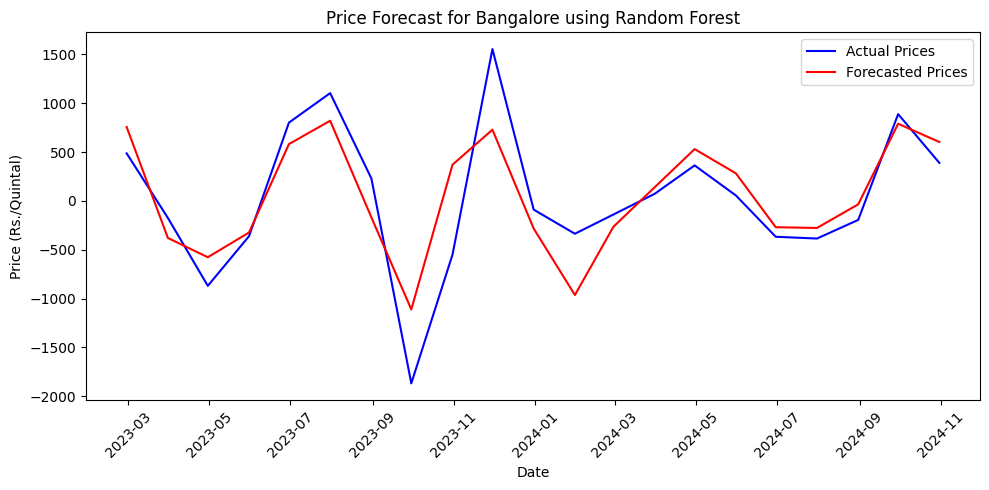

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


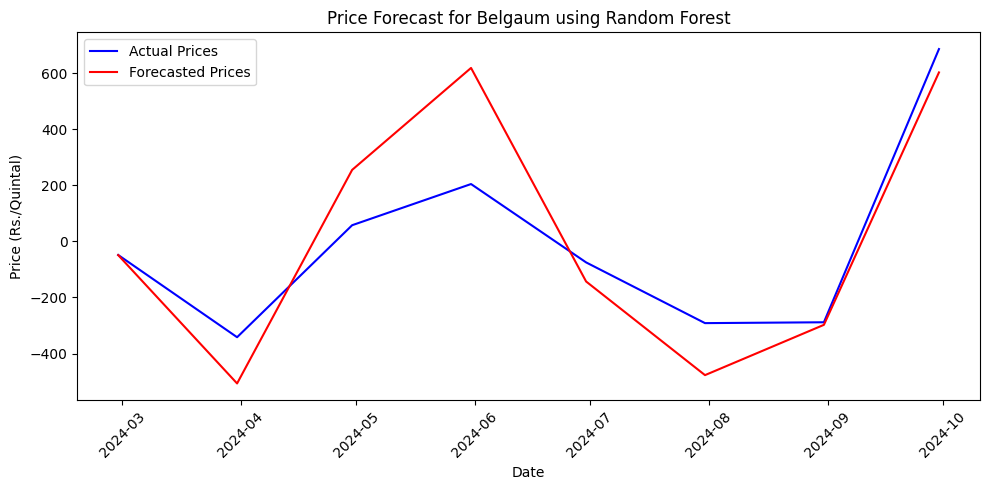

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


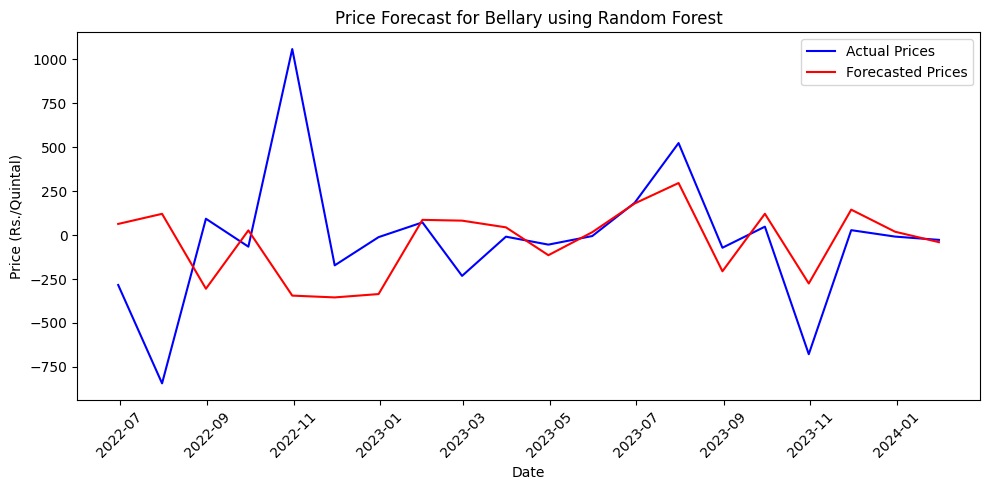

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


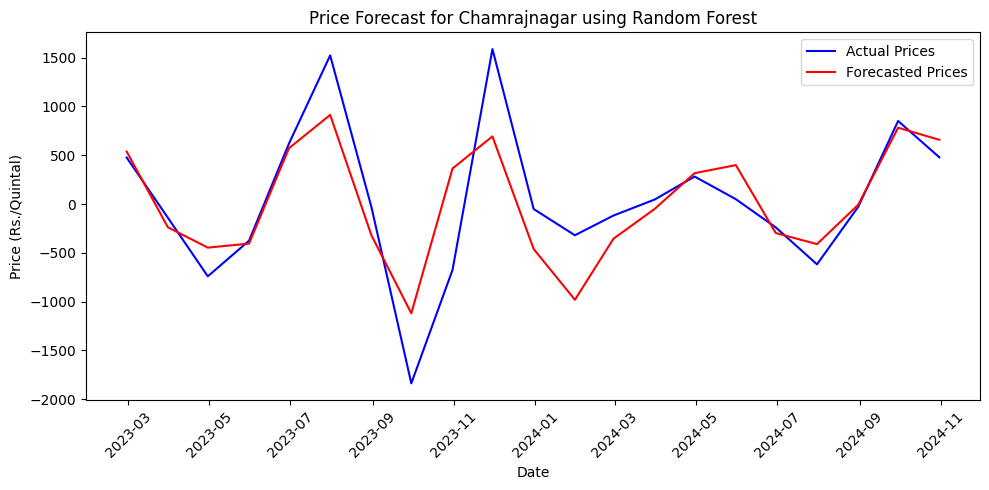

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


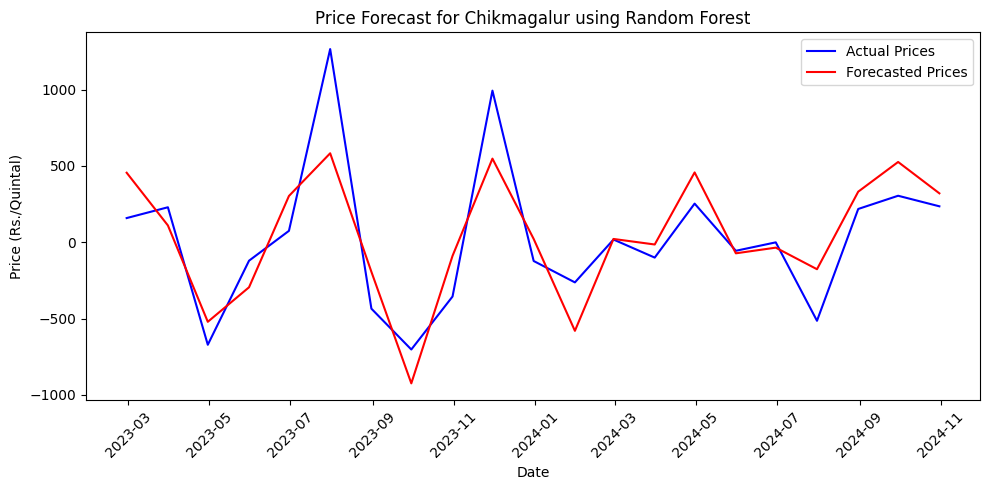

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


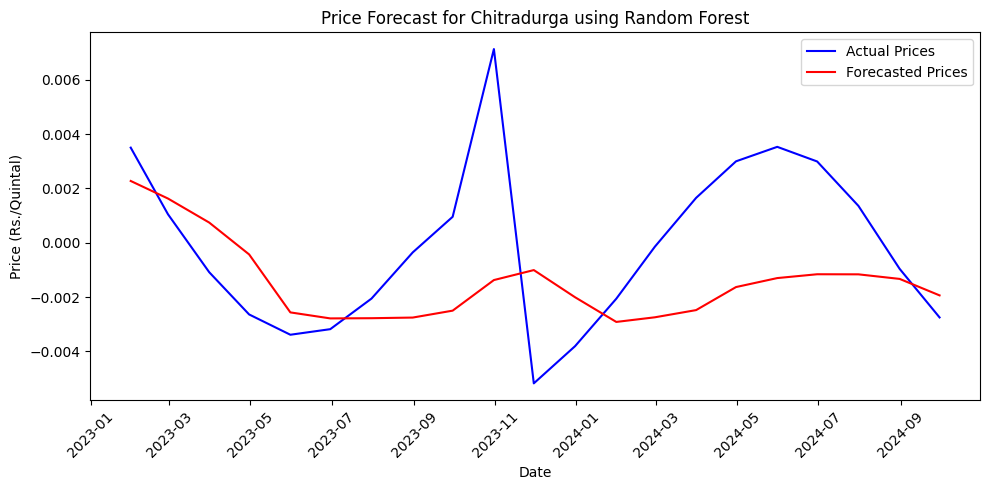

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


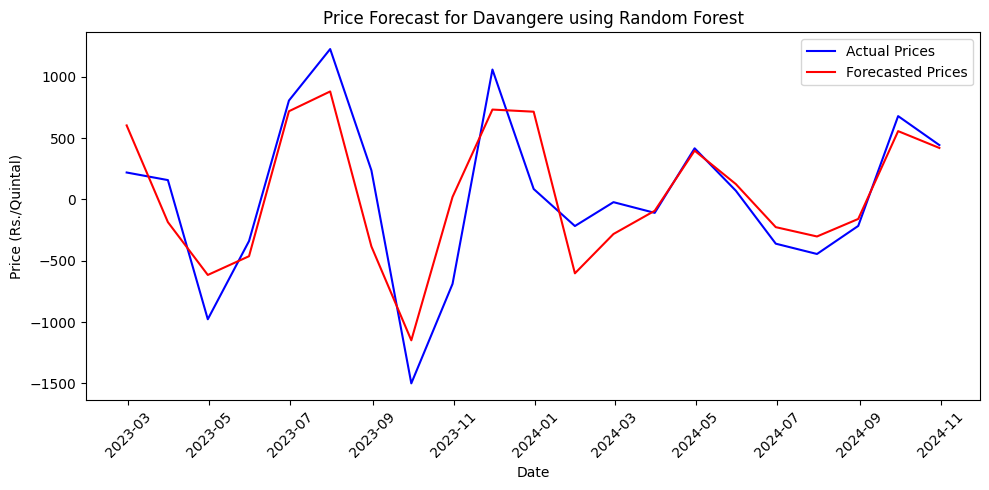

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


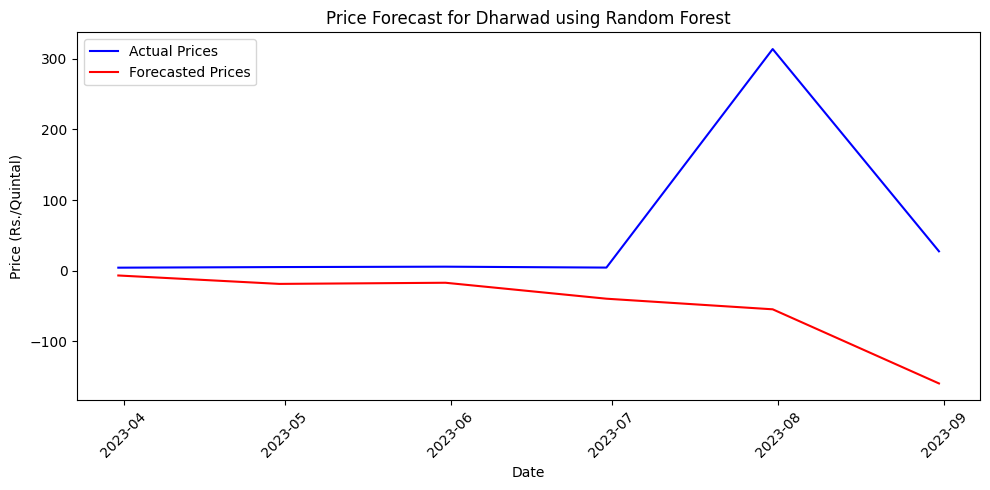

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


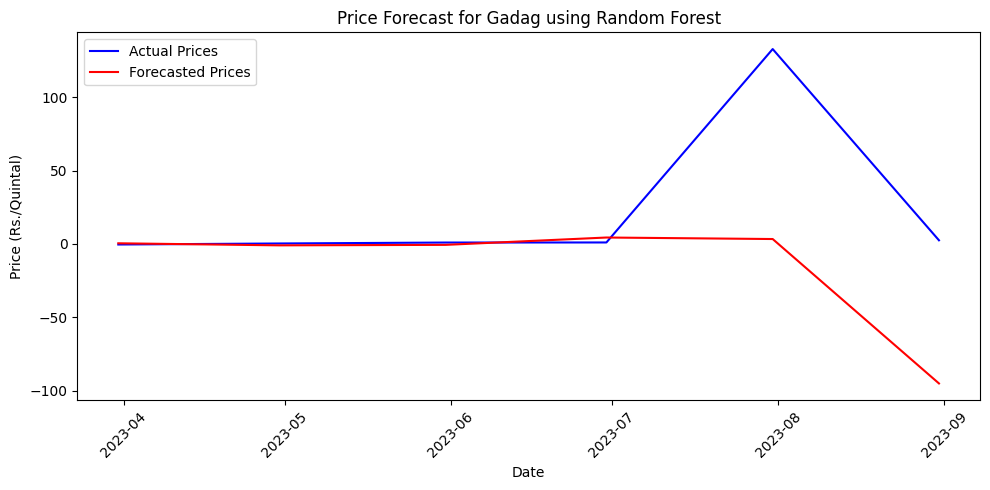

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


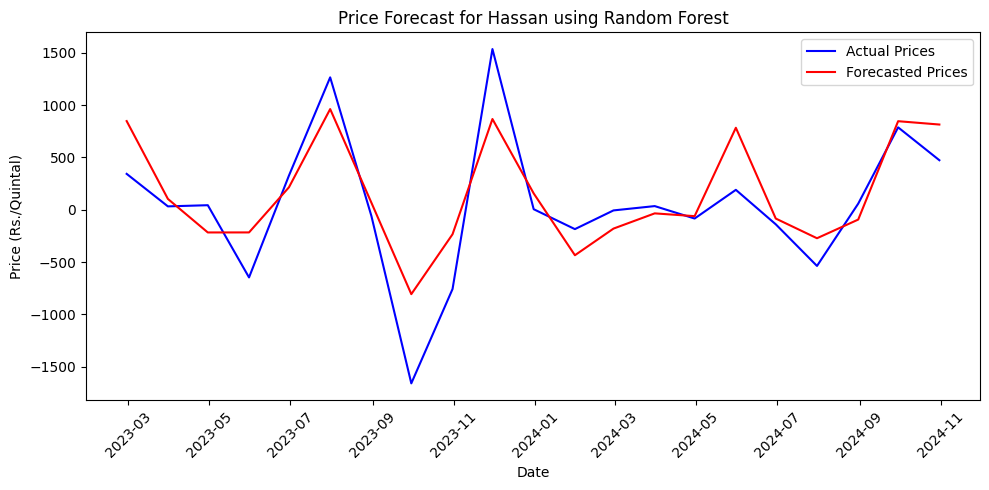

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


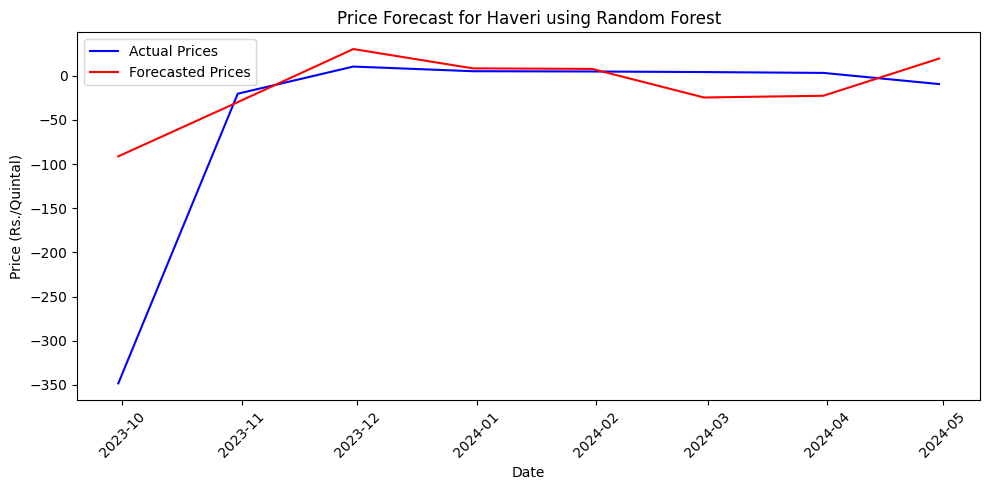

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


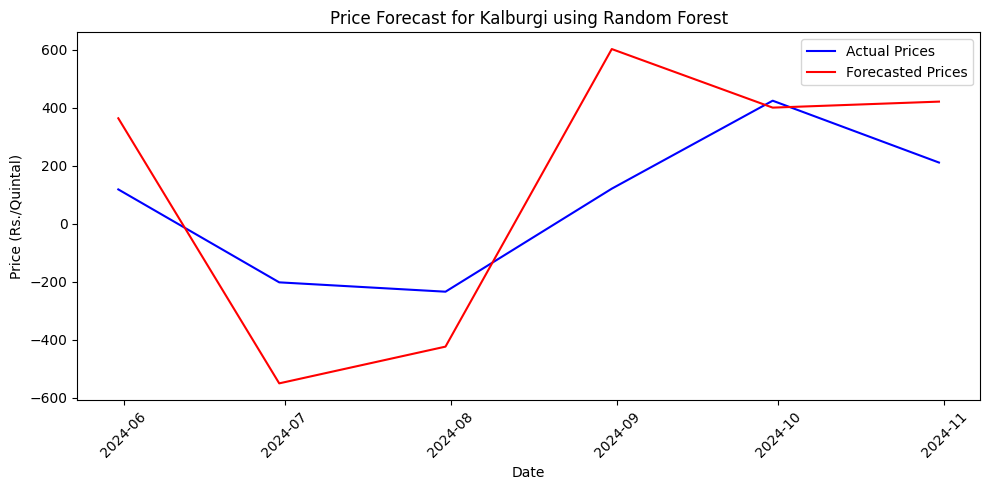

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


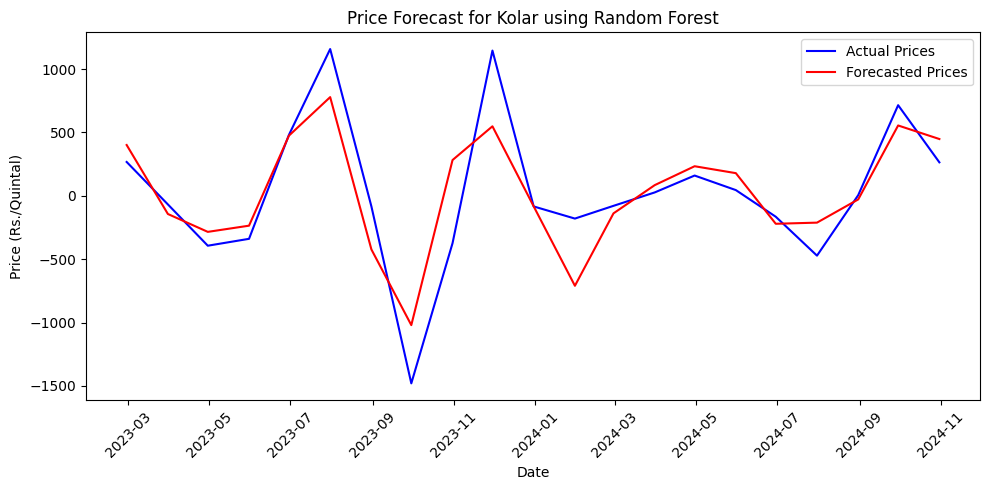

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


Not enough data for Koppal. Skipping decomposition.
Not enough data for Madikeri(Kodagu). Skipping decomposition.


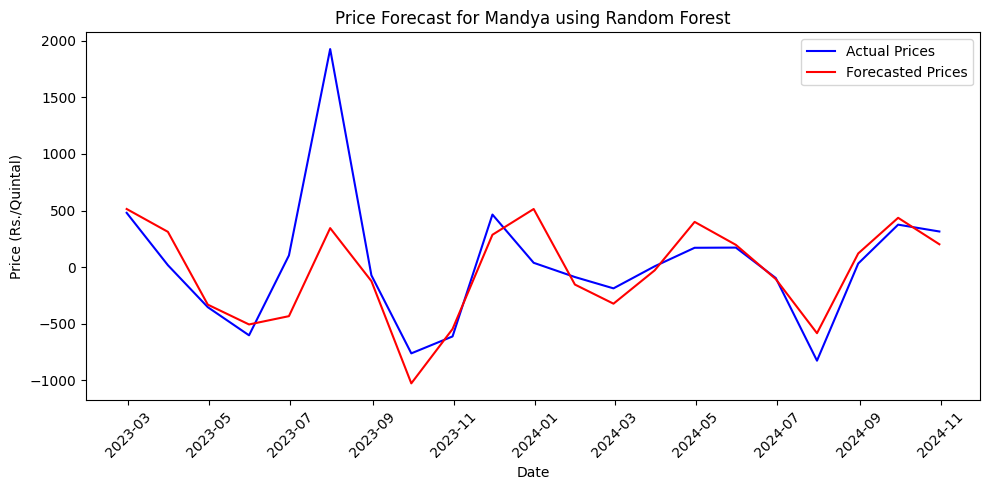

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


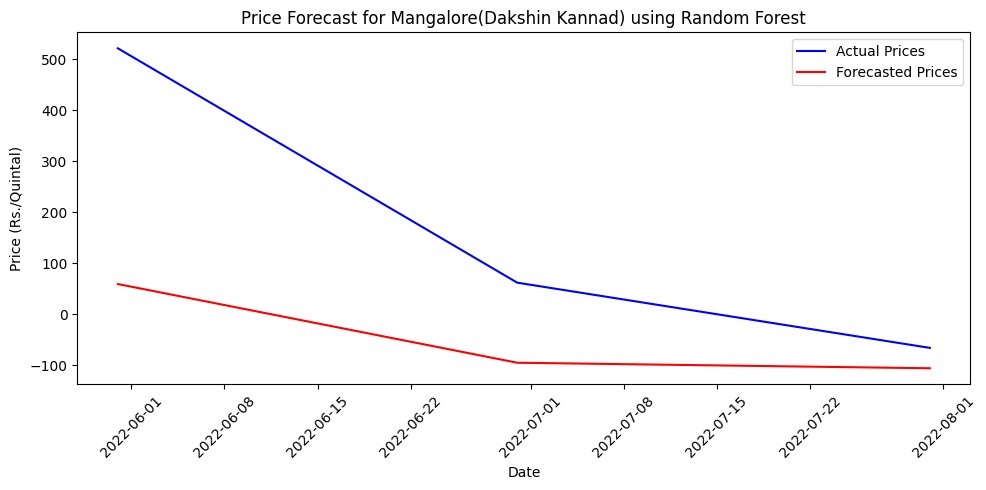

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


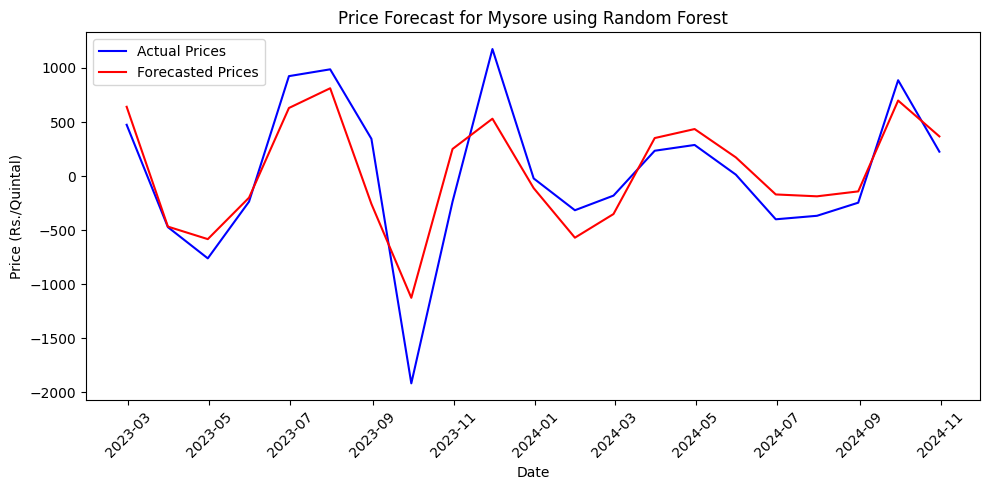

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


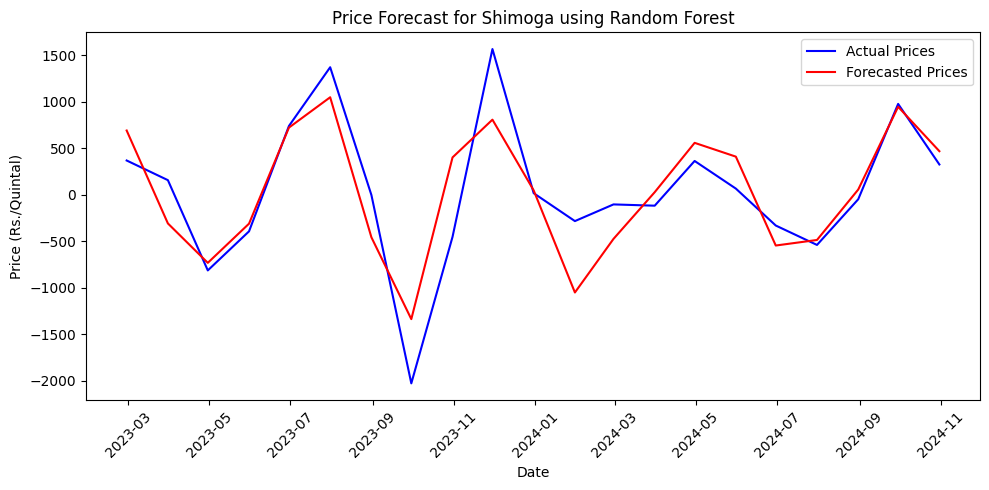

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


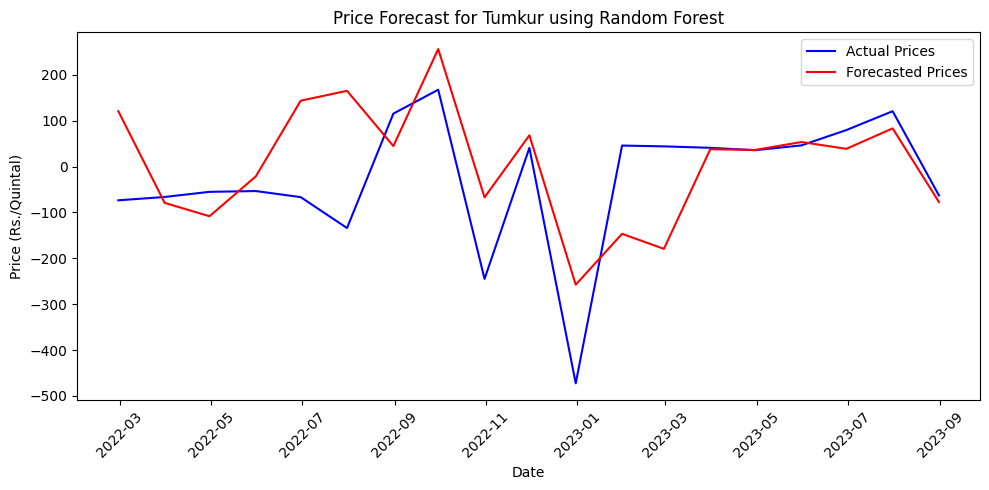

<ipython-input-40-17a1cec2298c>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-40-17a1cec2298c>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


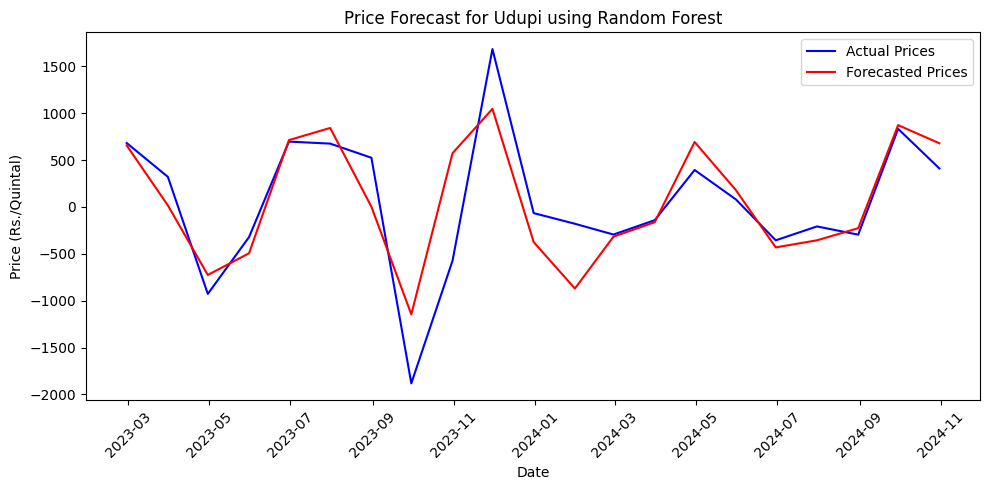

                                  MAE            MSE        RMSE        R2
Bangalore                  299.773484  153548.105680  391.852148  0.701574
Belgaum                    140.343722   35452.805459  188.289154  0.648696
Bellary                    258.755657  184151.499097  429.128768 -0.322667
Chamrajnagar               304.859641  182360.651252  427.037061  0.668642
Chikmagalur                209.066196   66921.017092  258.690968  0.691778
Chitradurga                  0.002524       0.000010    0.003205 -0.148149
Davangere                  261.966962  111081.918324  333.289541  0.724783
Dharwad                    109.573191   29003.574482  170.304358 -1.240194
Gadag                       39.063196    4393.548972   66.283852 -0.812000
Hassan                     284.753301  131663.009503  362.853978  0.696288
Haveri                      47.012584    8614.701023   92.815414  0.354101
Kalburgi                   249.822970   82368.207752  286.998620 -0.558184
Kolar                    

In [ ]:
# Random Forest model

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# Assuming your dataframe tomato_df has 'Date' already as the index
# Group the data by District Name and Date, then aggregate the prices
aggregated_df = tomato_df.groupby(['District Name', tomato_df.index]).agg({'Capped Prices': 'mean'}).reset_index()

# Rename the columns for clarity
aggregated_df.columns = ['District Name', 'Date', 'Capped Prices']

# Set the 'Date' column as the index again
aggregated_df.set_index('Date', inplace=True)

# Group the data by District Name for analysis
grouped = aggregated_df.groupby('District Name')

# Initialize dictionaries to store results
forecast_results = {}
performance_metrics = {}

# Iterate over each group (district)
for district, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:
        print(f"Not enough data for {district}. Skipping decomposition.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency and ensure it's odd and >= 3
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_series})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Add rolling features
    df['rolling_mean'] = df['Value'].rolling(window=3).mean()
    df['rolling_std'] = df['Value'].rolling(window=3).std()

    # Drop rows with NaN values created by lags and rolling calculations
    df.dropna(inplace=True)

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Inverse transform the predictions to the original scale
    y_pred_inverse = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_inverse = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Store the forecast results along with their dates
    forecast_results[district] = {
        'Date': y_test.index,
        'Forecast': y_pred_inverse
    }

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_inverse, y_pred_inverse)
    mse = mean_squared_error(y_test_inverse, y_pred_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inverse, y_pred_inverse)

    # Store metrics for the district
    performance_metrics[district] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

    # Optional: Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(y_test.index, y_test_inverse, label='Actual Prices', color='blue')
    plt.plot(y_test.index, y_pred_inverse, label='Forecasted Prices', color='red')
    plt.title(f'Price Forecast for {district} using Random Forest')
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Convert forecast results to DataFrame for further analysis or export
forecast_dfs = []
for district, data in forecast_results.items():
    temp_df = pd.DataFrame({
        'District Name': district,
        'Date': data['Date'],
        'Forecast': data['Forecast']
    })
    forecast_dfs.append(temp_df)

# Combine all the forecast data into one DataFrame
forecast_df = pd.concat(forecast_dfs)
forecast_df.set_index(['District Name', 'Date'], inplace=True)

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T
print(performance_df)


<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


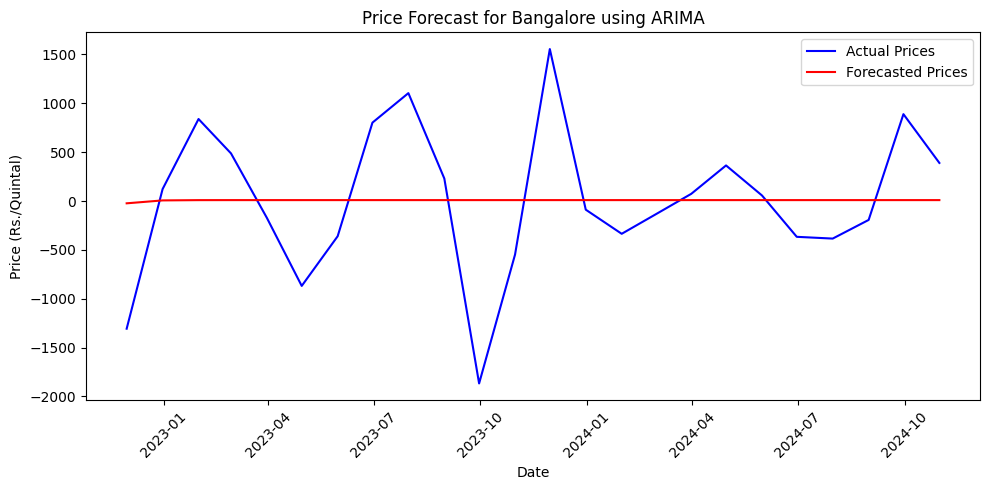

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


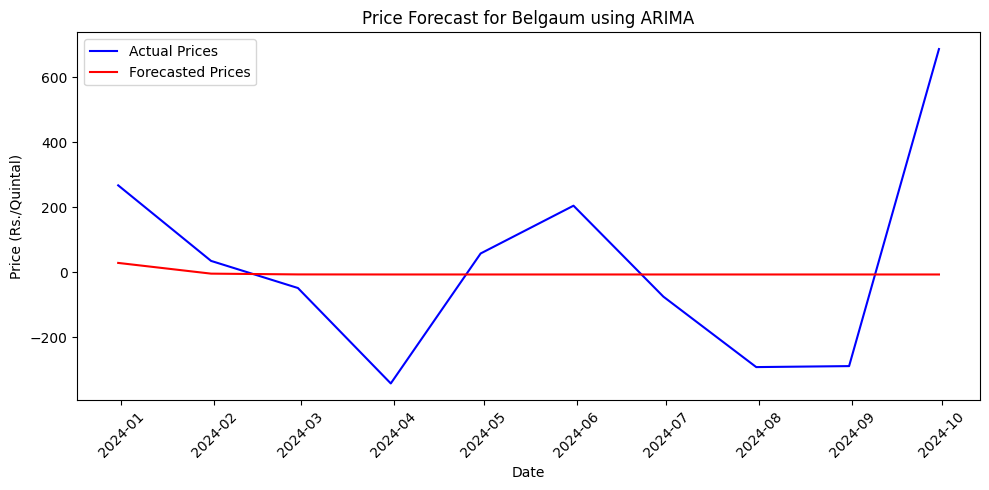

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


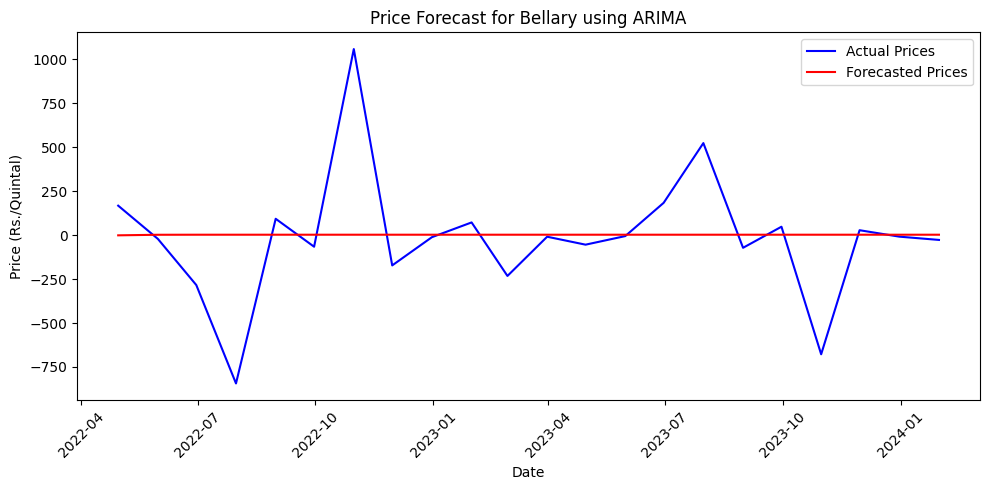

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


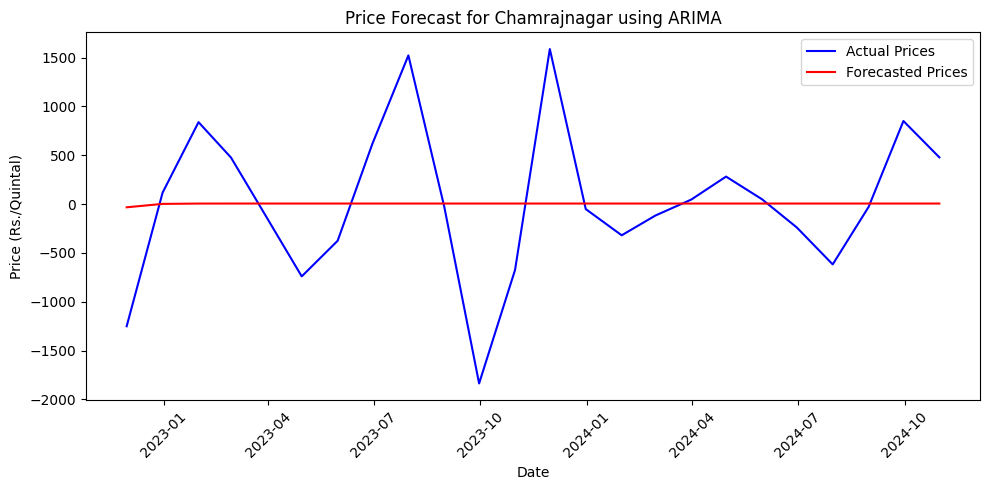

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


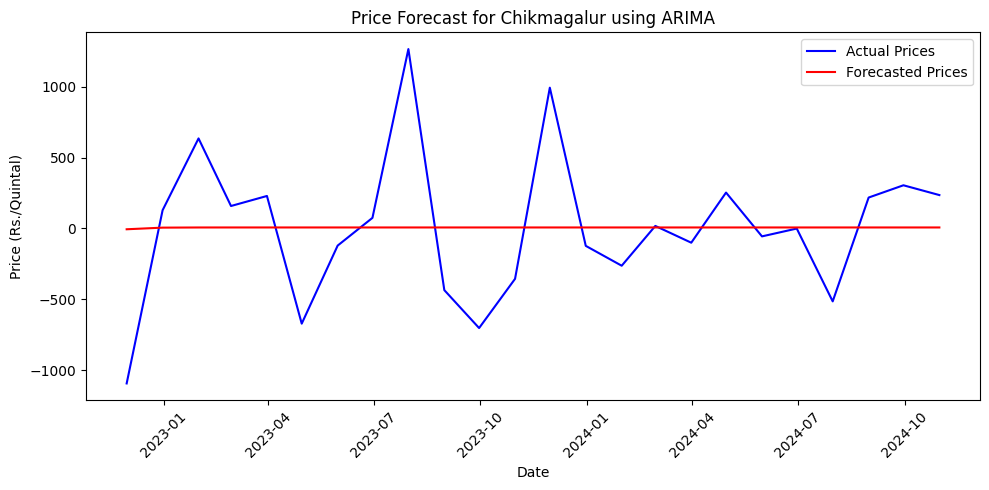

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


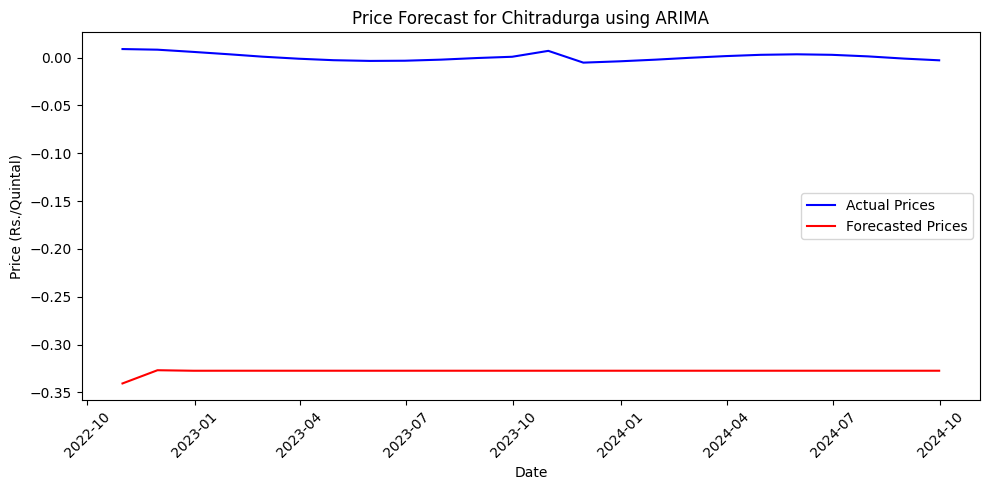

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


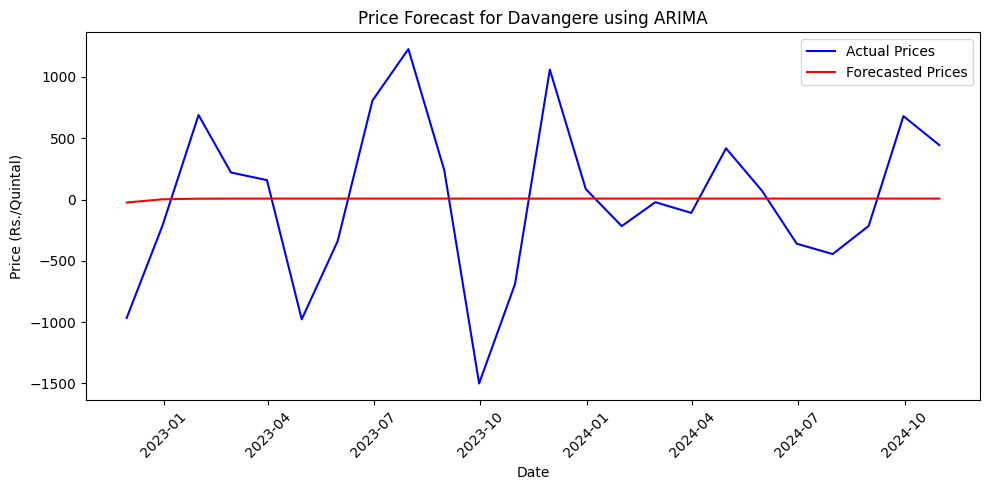

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


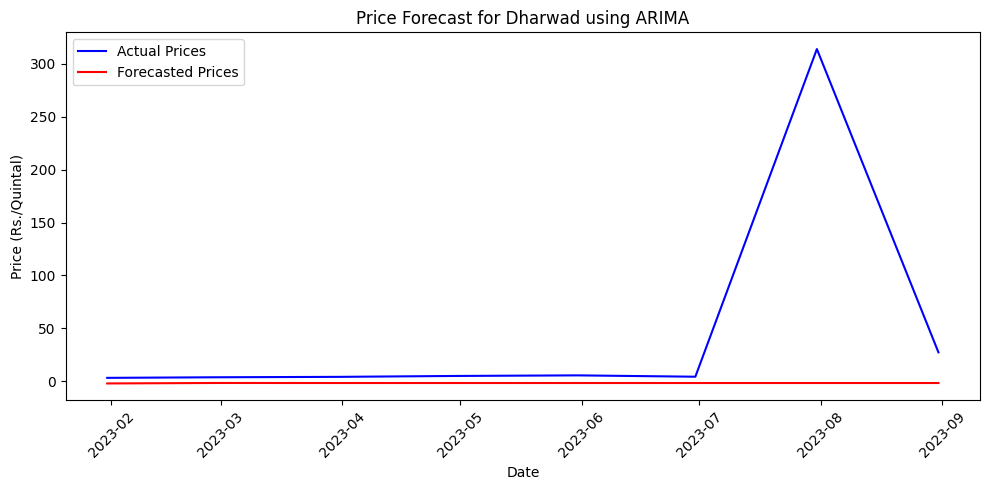

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


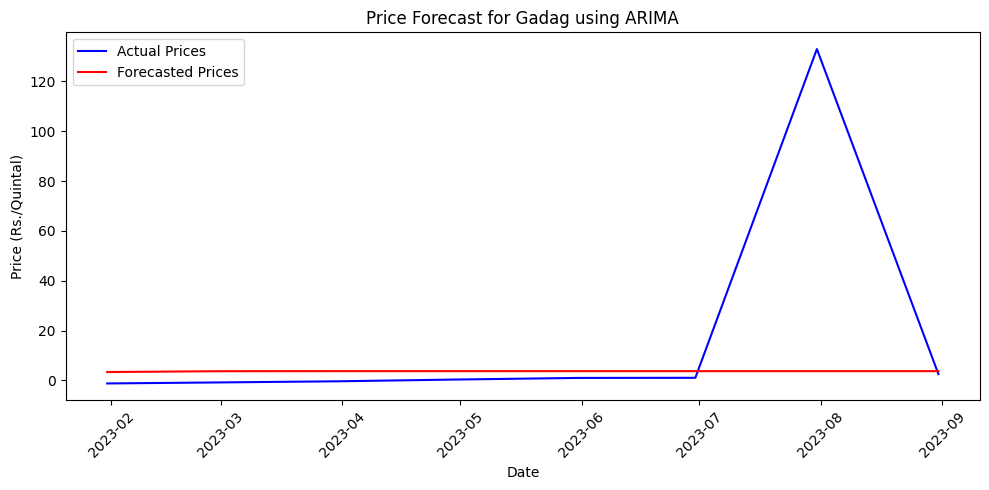

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


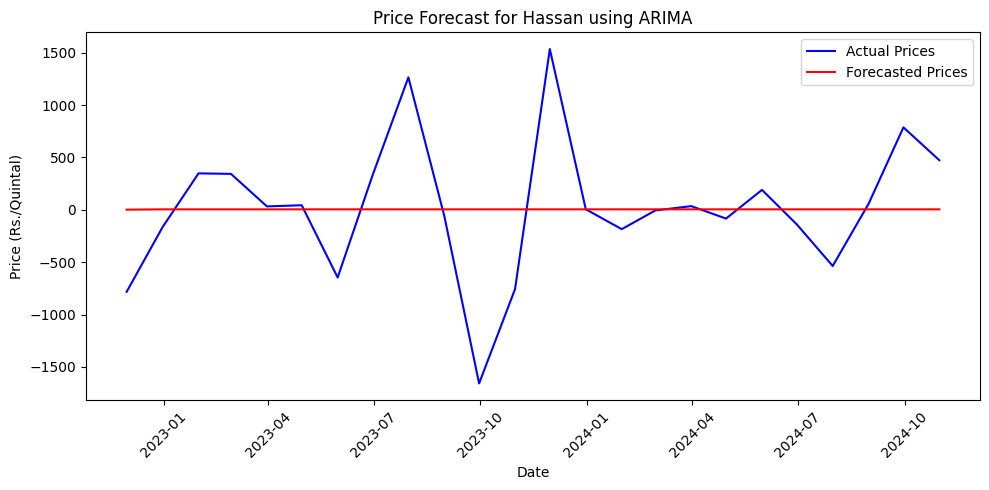

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


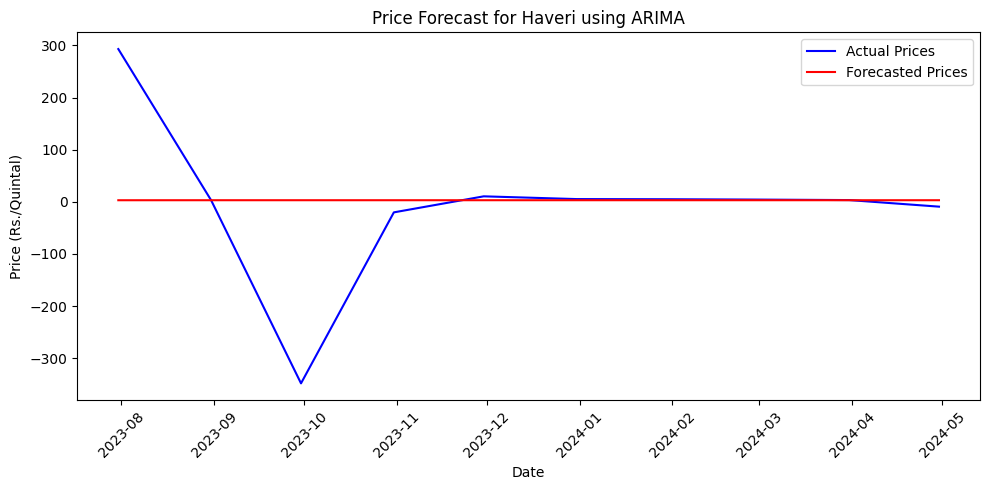

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


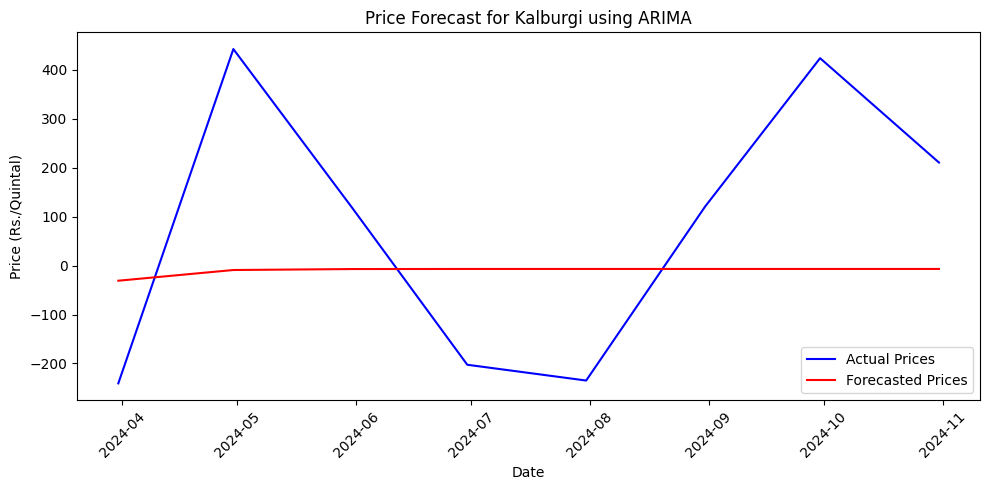

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


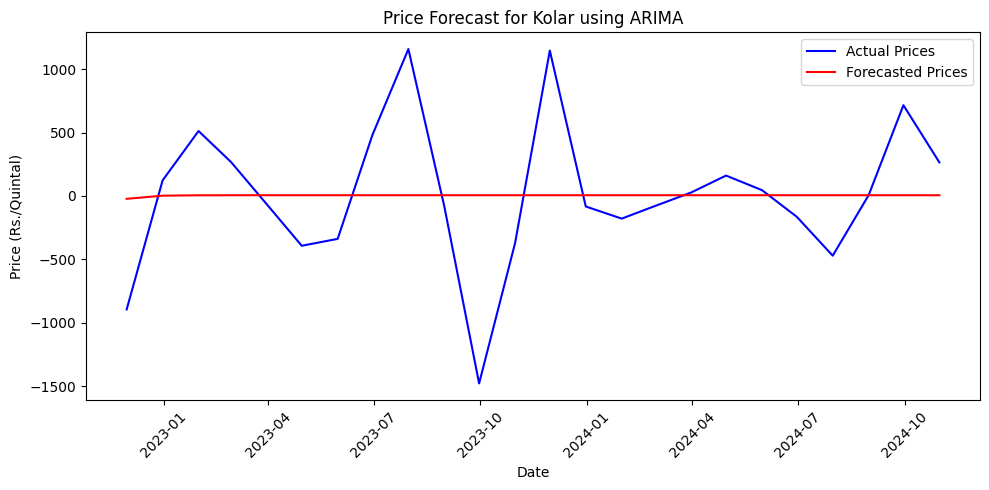

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Not enough data for Koppal. Skipping decomposition.
Not enough data for Madikeri(Kodagu). Skipping decomposition.


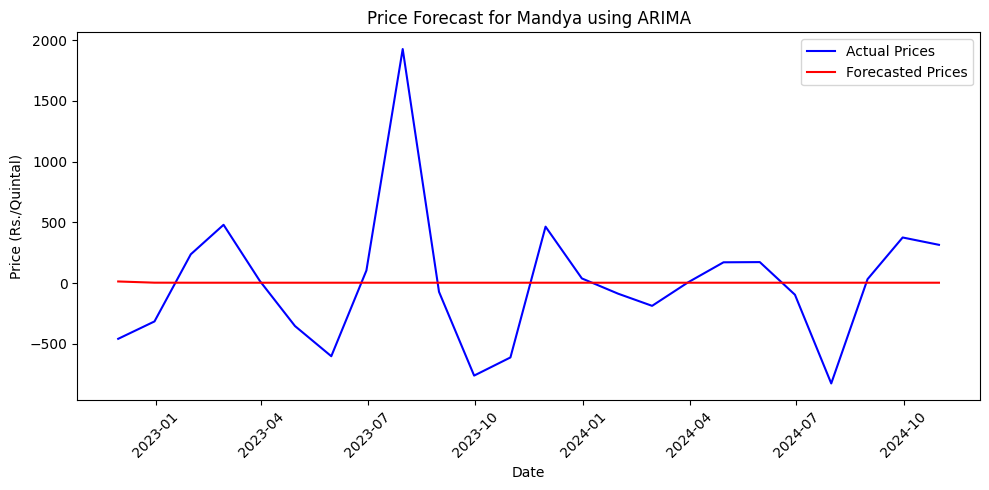

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


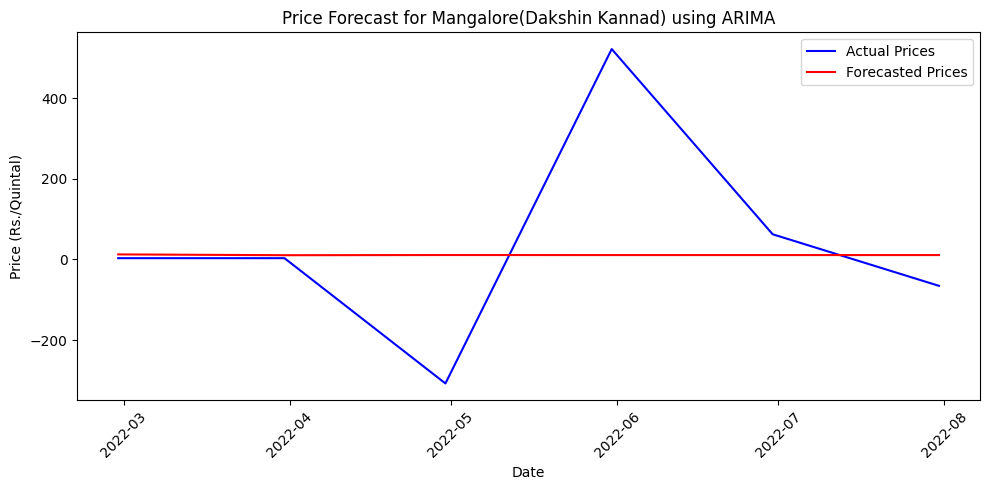

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


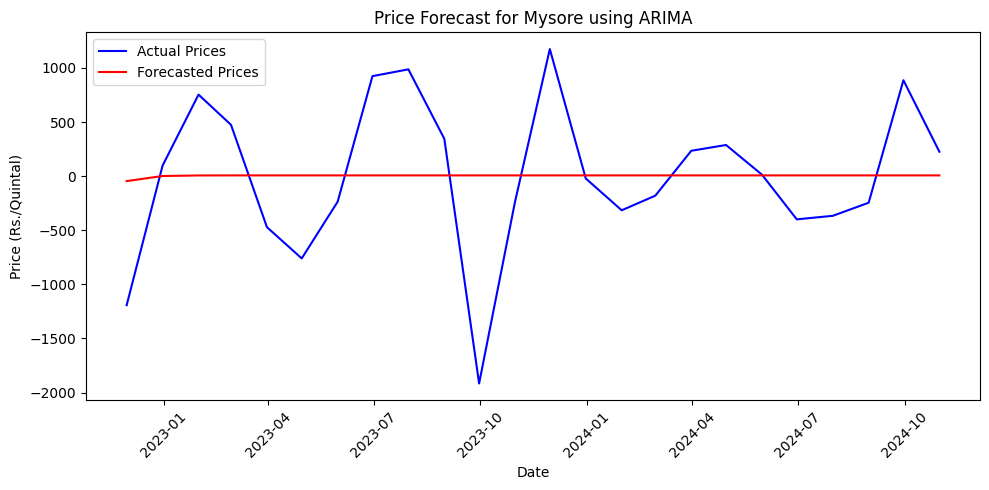

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


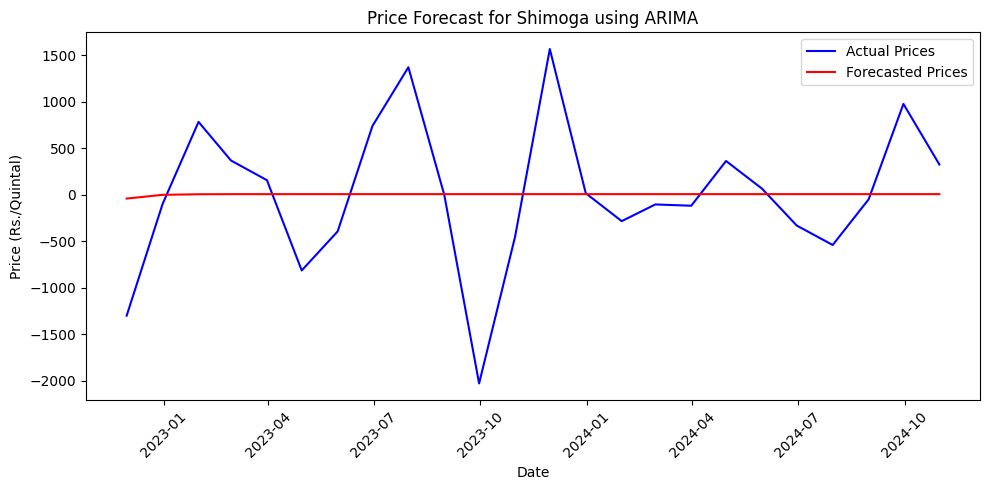

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


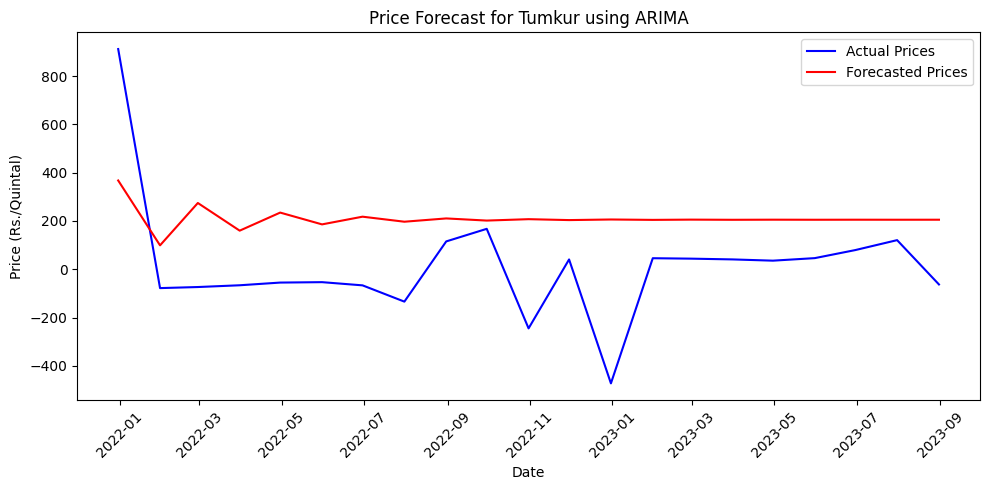

<ipython-input-42-85a8cc764e08>:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-42-85a8cc764e08>:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


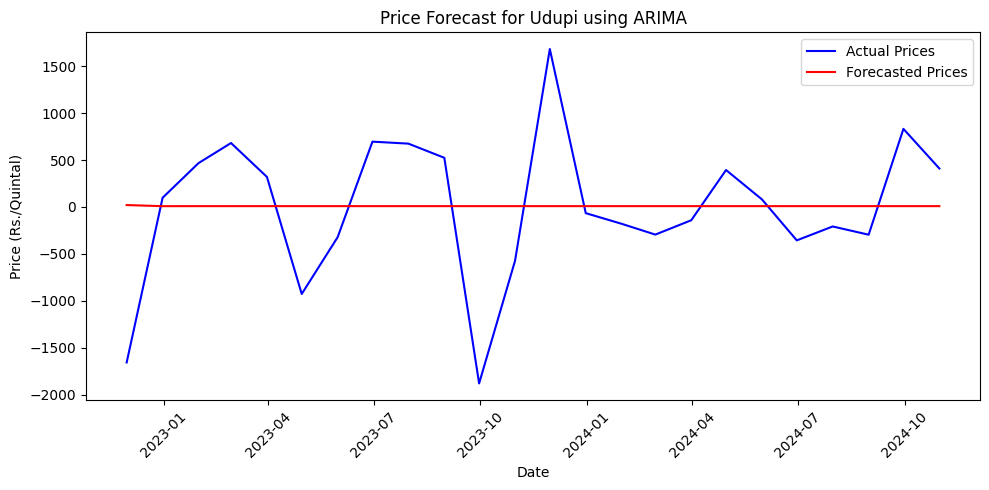

                                  MAE            MSE        RMSE           R2
Bangalore                  563.389881  548546.777232  740.639438     0.006348
Belgaum                    225.713489   86593.838808  294.268311     0.012431
Bellary                    212.652728  128468.419119  358.424914    -0.002534
Chamrajnagar               552.881077  573681.683717  757.417774     0.006504
Chikmagalur                372.402776  256467.325743  506.426032     0.004374
Chitradurga                  0.328744       0.108104    0.328791 -7260.714820
Davangere                  504.718180  411667.320152  641.613061     0.006235
Dharwad                     47.594461   12570.693093  112.119102    -0.219344
Gadag                       19.049818    2100.623438   45.832559    -0.090625
Hassan                     435.258476  412755.119095  642.460208     0.000066
Haveri                      69.014323   20827.970371  144.318988    -0.003500
Kalburgi                   248.230105   75379.838615  274.553890

In [ ]:
# Arima Model

import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# Assuming your dataframe tomato_df has 'Date' already as the index
# Group the data by District Name and Date, then aggregate the prices
aggregated_df = tomato_df.groupby(['District Name', tomato_df.index]).agg({'Capped Prices': 'mean'}).reset_index()

# Rename the columns for clarity
aggregated_df.columns = ['District Name', 'Date', 'Capped Prices']

# Set the 'Date' column as the index again
aggregated_df.set_index('Date', inplace=True)

# Group the data by District Name for analysis
grouped = aggregated_df.groupby('District Name')

# Initialize dictionaries to store results
forecast_results = {}
performance_metrics = {}

# Iterate over each group (district)
for district, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:
        print(f"Not enough data for {district}. Skipping decomposition.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Ensure it's odd and >= 3
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Split the data into training and testing sets
    train_size = int(len(scaled_series) * 0.8)
    train, test = scaled_series[:train_size], scaled_series[train_size:]

    # Train the ARIMA model
    model = ARIMA(train, order=(1, 1, 1))
    model_fit = model.fit()

    # Forecast for the test period
    forecast = model_fit.forecast(steps=len(test))

    # Convert the forecast and test data to NumPy arrays for inverse transformation
    forecast = forecast.to_numpy().reshape(-1, 1)
    test_values = test.to_numpy().reshape(-1, 1)

    # Inverse transform the forecast and test data to the original scale
    forecast_inverse = scaler.inverse_transform(forecast).flatten()
    test_inverse = scaler.inverse_transform(test_values).flatten()

    # Store the forecast results along with their dates
    forecast_results[district] = {
        'Date': test.index,
        'Forecast': forecast_inverse
    }

    # Calculate performance metrics
    mae = mean_absolute_error(test_inverse, forecast_inverse)
    mse = mean_squared_error(test_inverse, forecast_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(test_inverse, forecast_inverse)

    # Store metrics for the district
    performance_metrics[district] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

    # Optional: Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(test.index, test_inverse, label='Actual Prices', color='blue')
    plt.plot(test.index, forecast_inverse, label='Forecasted Prices', color='red')
    plt.title(f'Price Forecast for {district} using ARIMA')
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Convert forecast results to DataFrame for further analysis or export
forecast_dfs = []
for district, data in forecast_results.items():
    temp_df = pd.DataFrame({
        'District Name': district,
        'Date': data['Date'],
        'Forecast': data['Forecast']
    })
    forecast_dfs.append(temp_df)

# Combine all the forecast data into one DataFrame
forecast_df = pd.concat(forecast_dfs)
forecast_df.set_index(['District Name', 'Date'], inplace=True)

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T
print(performance_df)


<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


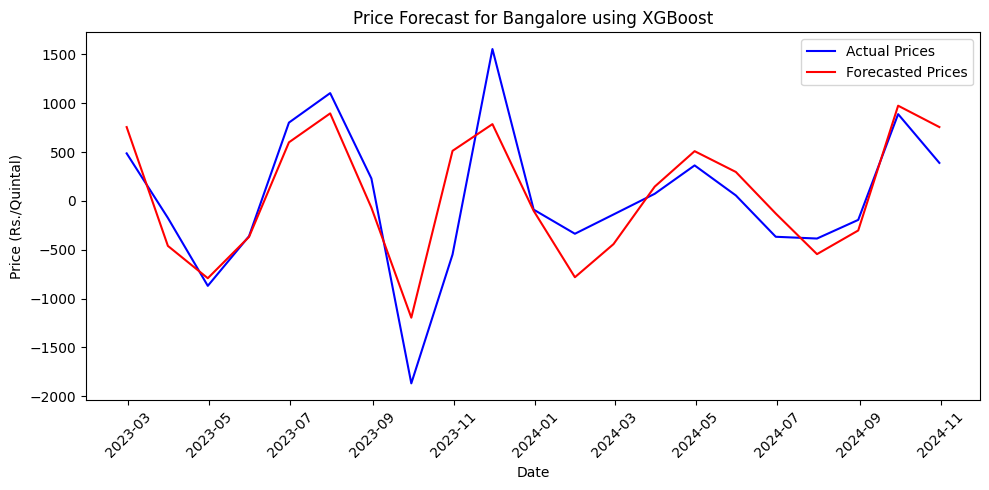

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


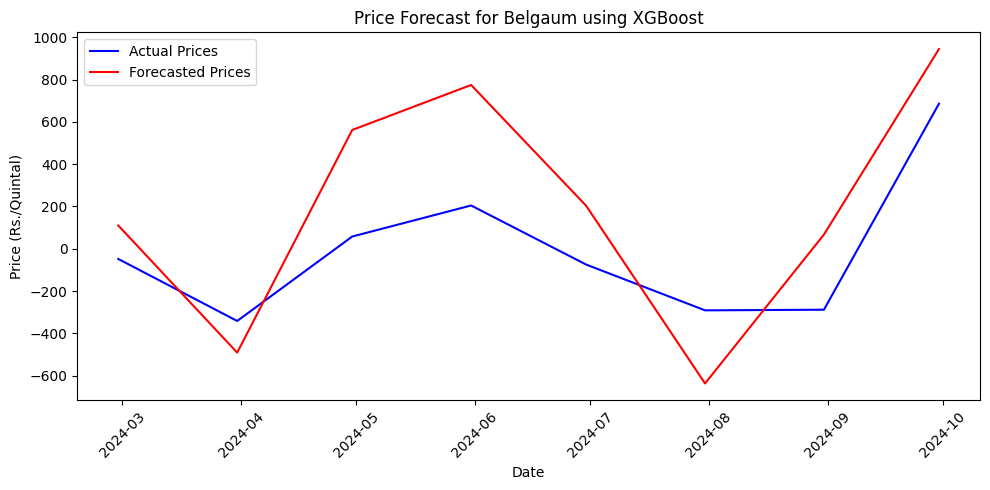

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


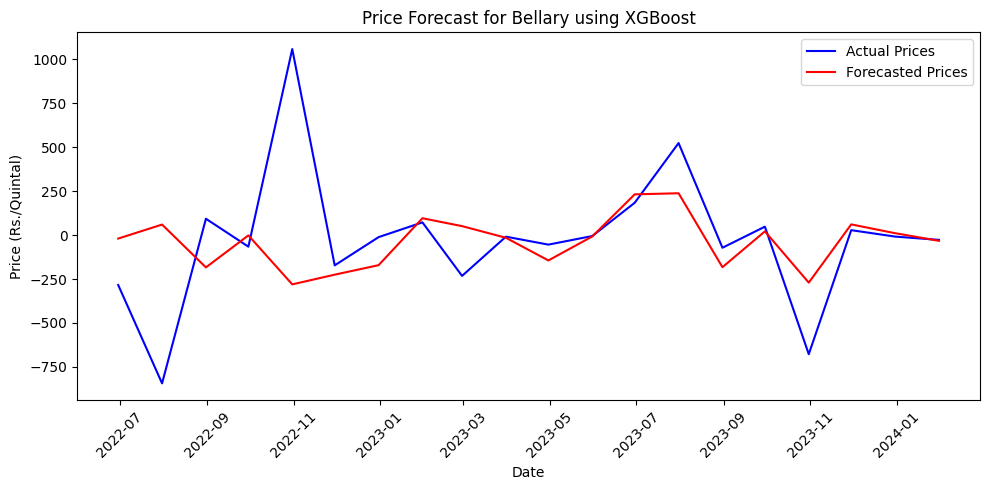

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


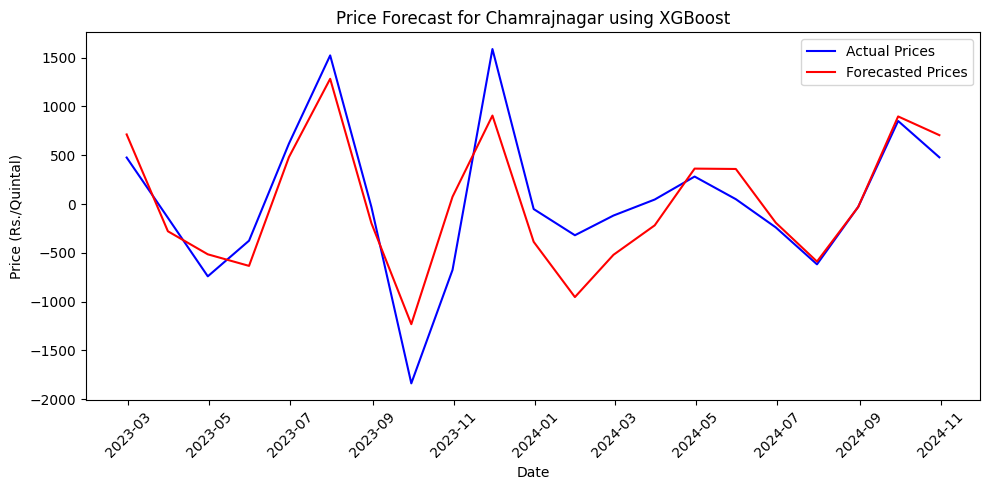

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


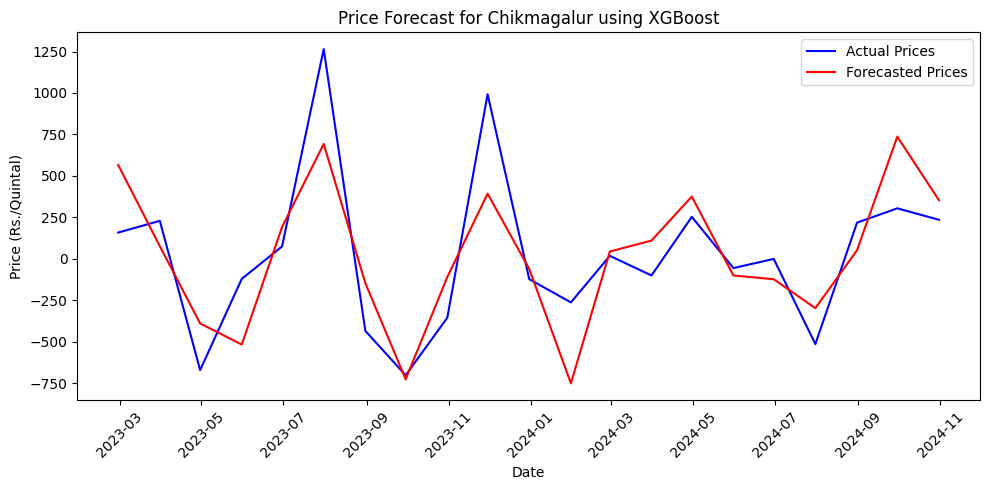

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


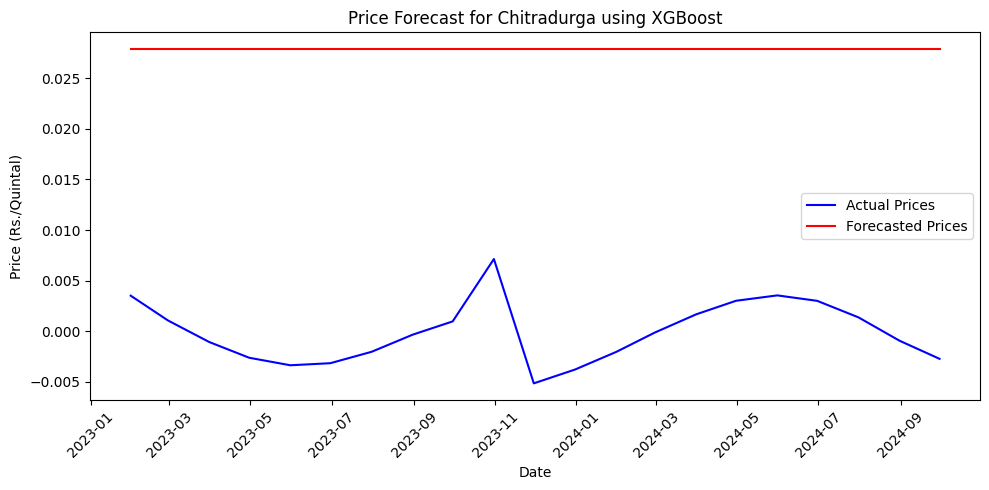

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


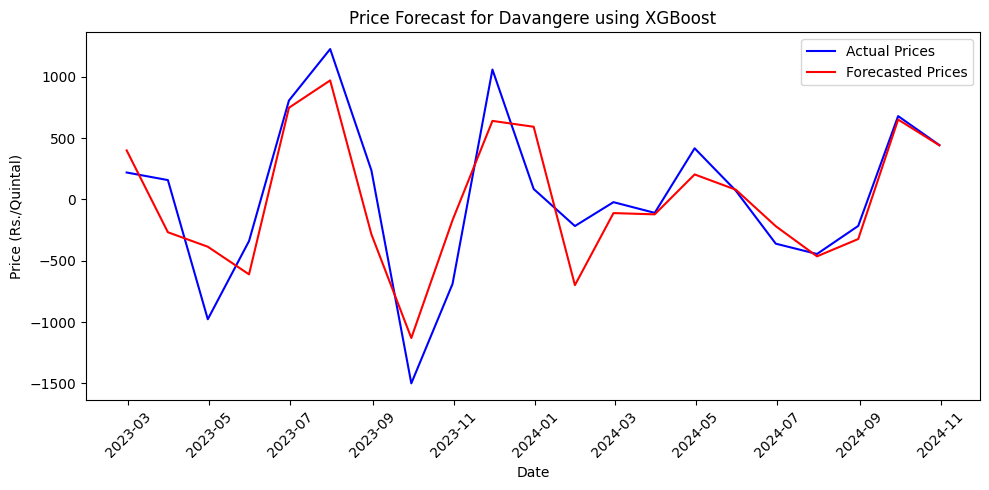

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


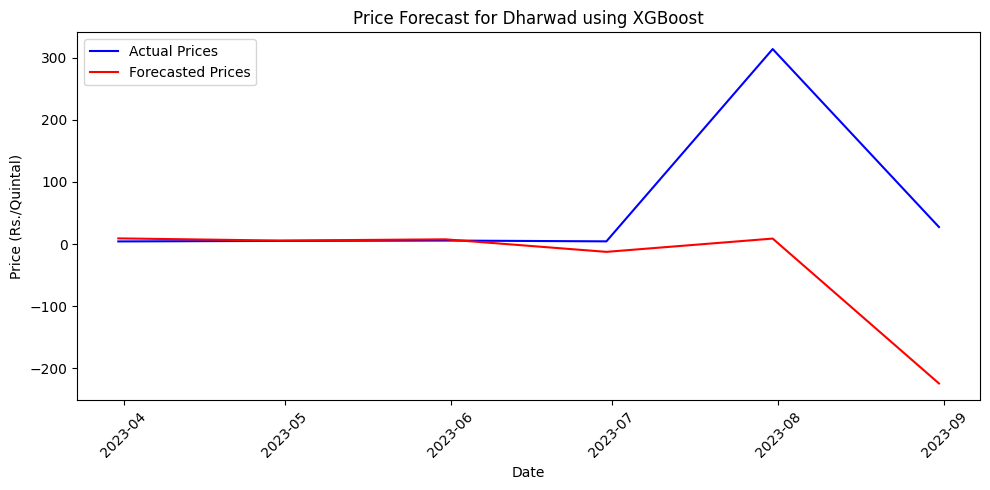

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


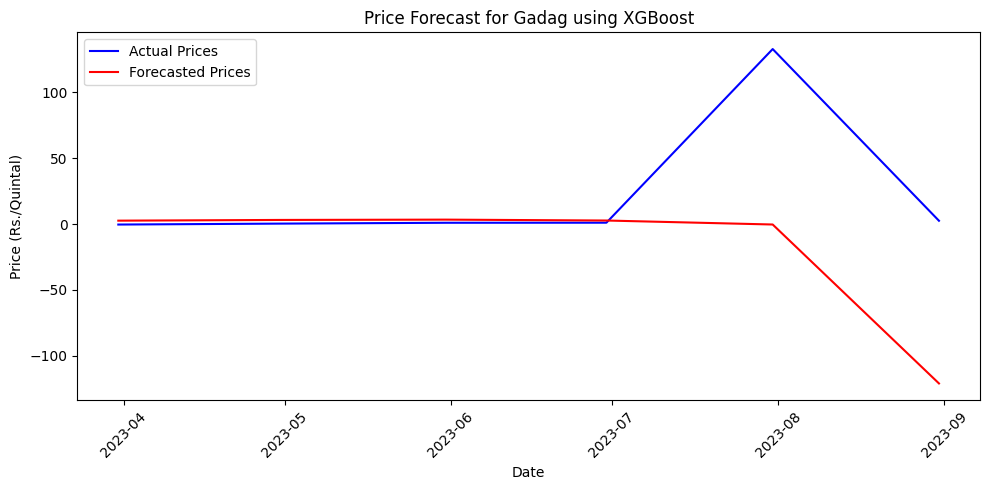

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


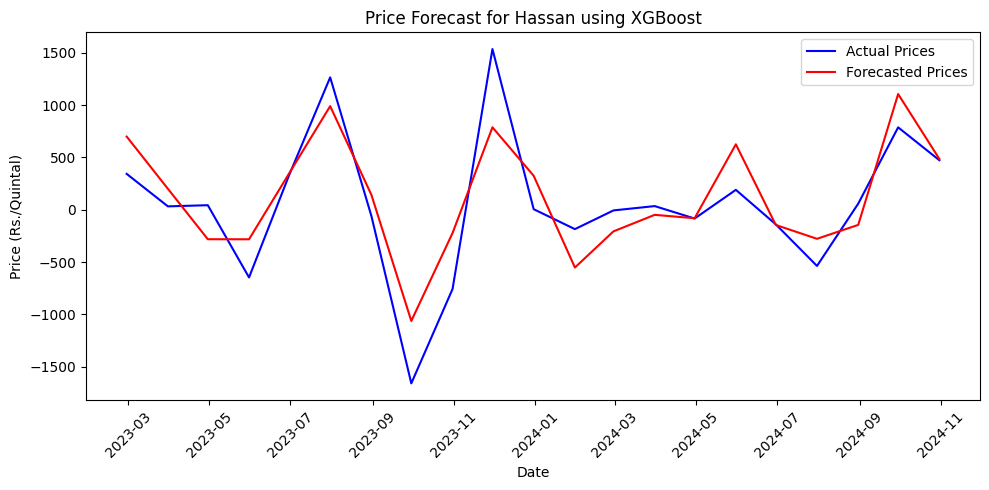

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


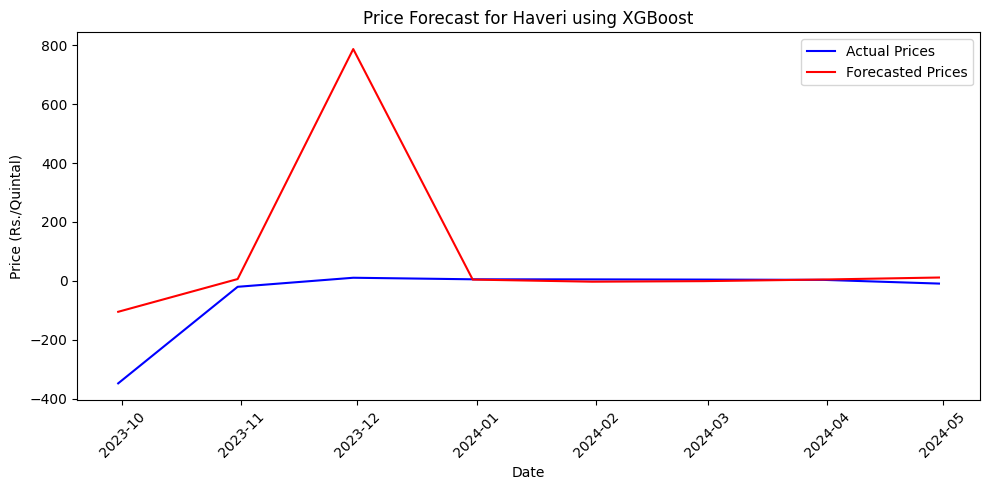

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


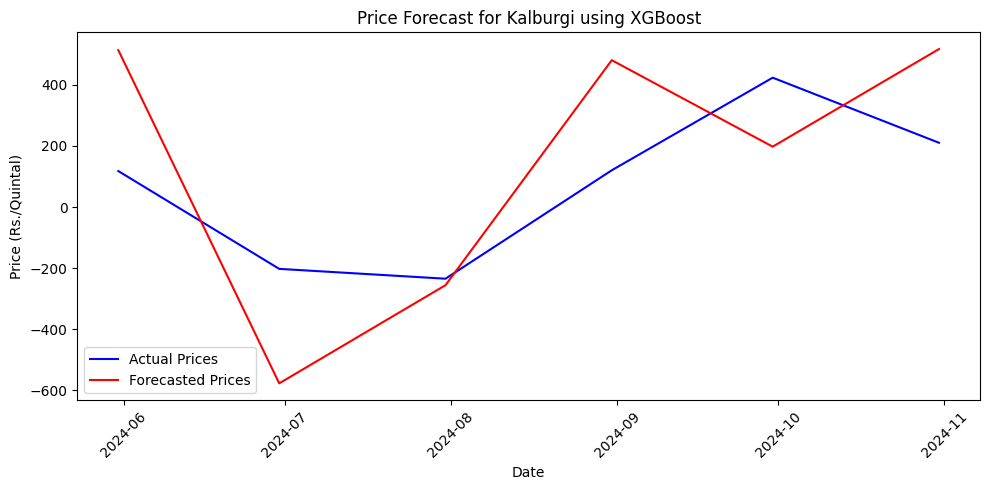

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


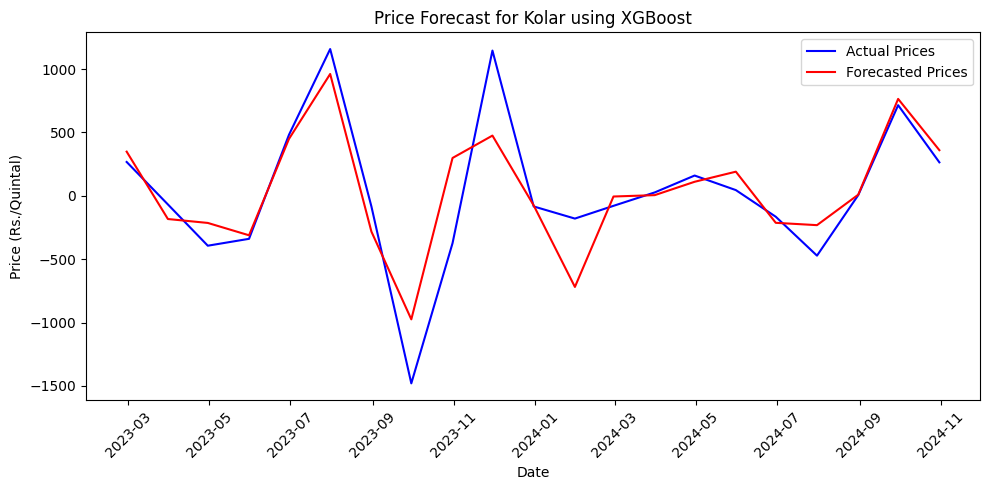

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


Not enough data for Koppal. Skipping decomposition.
Not enough data for Madikeri(Kodagu). Skipping decomposition.


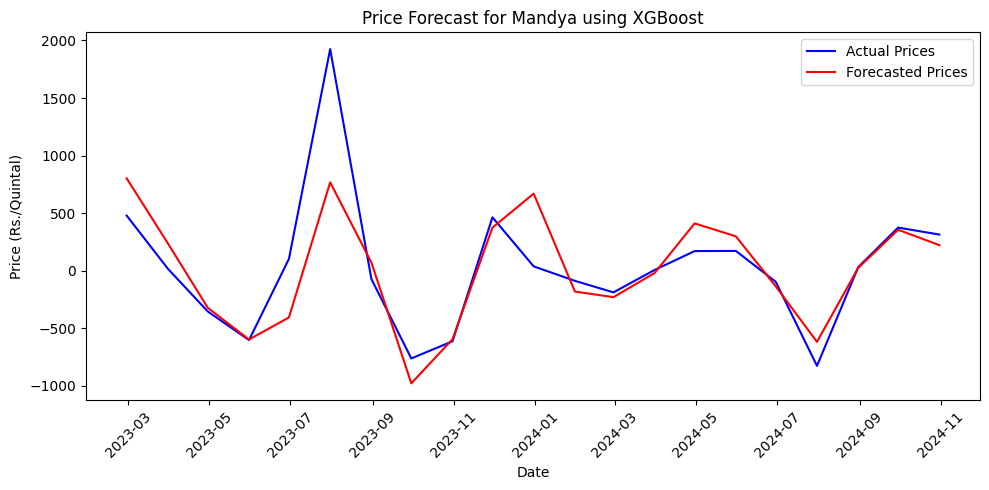

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


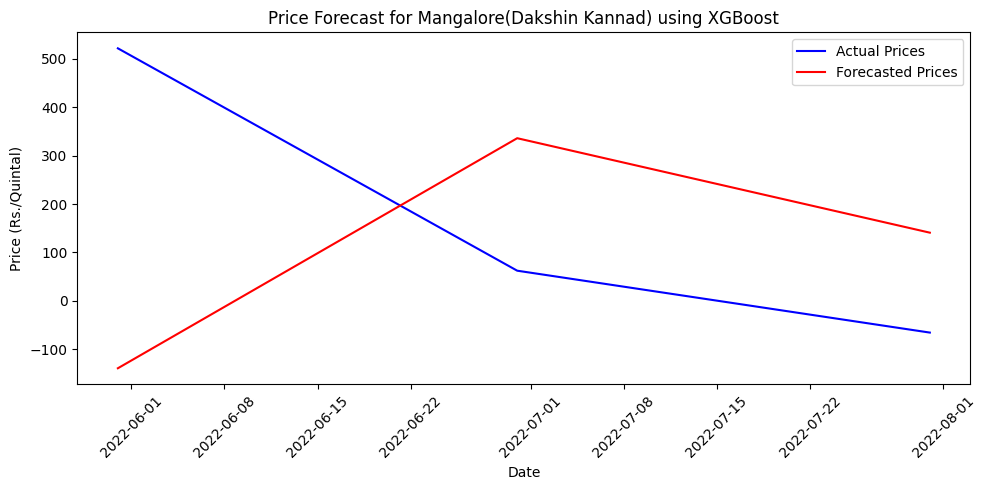

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


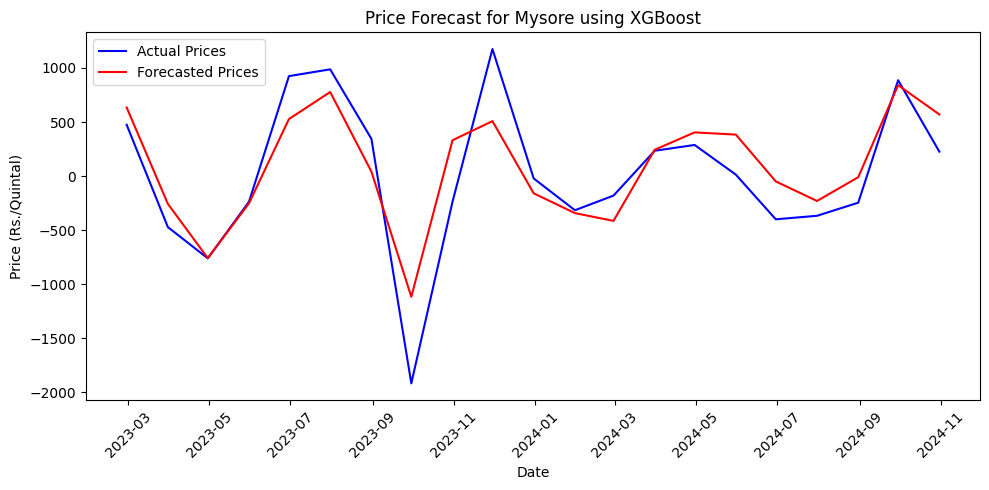

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


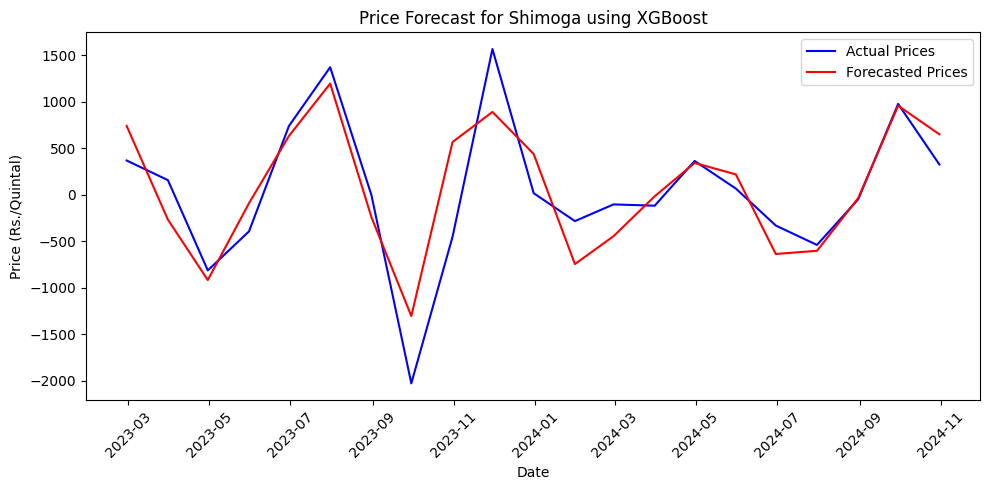

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


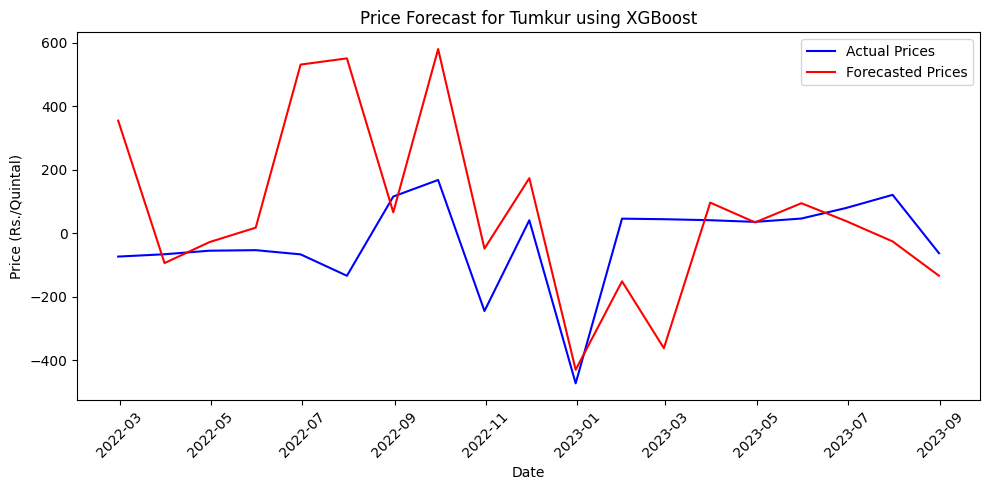

<ipython-input-43-099bf163b70d>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-43-099bf163b70d>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


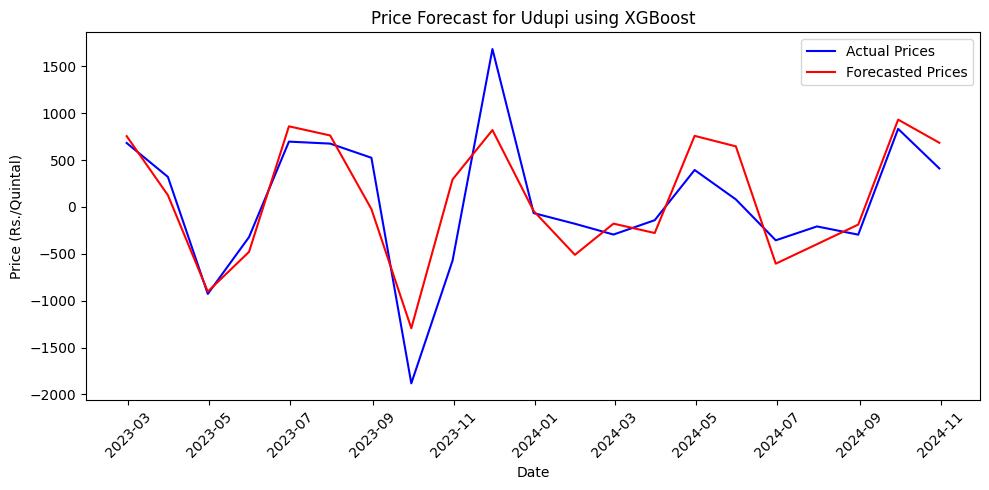

                                  MAE            MSE        RMSE         R2
Bangalore                  287.311506  148380.451134  385.201832   0.711618
Belgaum                    327.454319  127044.458505  356.432965  -0.258893
Bellary                    220.097623  157097.399531  396.355143  -0.128351
Chamrajnagar               276.993463  123559.288404  351.510012   0.775487
Chikmagalur                242.655076   88863.028219  298.099024   0.590718
Chitradurga                  0.028020       0.000794    0.028180 -87.783759
Davangere                  248.891113  101855.425111  319.147967   0.747643
Dharwad                     96.844494   26120.969090  161.619829  -1.017546
Gadag                       44.463405    5515.290419   74.265001  -1.274632
Hassan                     275.716331  113823.435074  337.377289   0.737439
Haveri                     135.265792   82985.250565  288.071607  -5.221935
Kalburgi                   281.146638   95664.199142  309.296297  -0.809708
Kolar       

In [ ]:
# XG Boost

import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# Assuming your dataframe tomato_df has 'Date' already as the index
# Group the data by District Name and Date, then aggregate the prices
aggregated_df = tomato_df.groupby(['District Name', tomato_df.index]).agg({'Capped Prices': 'mean'}).reset_index()

# Rename the columns for clarity
aggregated_df.columns = ['District Name', 'Date', 'Capped Prices']

# Set the 'Date' column as the index again
aggregated_df.set_index('Date', inplace=True)

# Group the data by District Name for analysis
grouped = aggregated_df.groupby('District Name')

# Initialize dictionaries to store results
forecast_results = {}
performance_metrics = {}

# Iterate over each group (district)
for district, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:
        print(f"Not enough data for {district}. Skipping decomposition.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency and ensure it's odd and >= 3
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_series})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Add rolling features
    df['rolling_mean'] = df['Value'].rolling(window=3).mean()
    df['rolling_std'] = df['Value'].rolling(window=3).std()

    # Drop rows with NaN values created by lags and rolling calculations
    df.dropna(inplace=True)

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Train an XGBoost model
    model = xgb.XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Inverse transform the predictions to the original scale
    y_pred_inverse = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_inverse = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Store the forecast results along with their dates
    forecast_results[district] = {
        'Date': y_test.index,
        'Forecast': y_pred_inverse
    }

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_inverse, y_pred_inverse)
    mse = mean_squared_error(y_test_inverse, y_pred_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inverse, y_pred_inverse)

    # Store metrics for the district
    performance_metrics[district] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

    # Optional: Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(y_test.index, y_test_inverse, label='Actual Prices', color='blue')
    plt.plot(y_test.index, y_pred_inverse, label='Forecasted Prices', color='red')
    plt.title(f'Price Forecast for {district} using XGBoost')
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Convert forecast results to DataFrame for further analysis or export
forecast_dfs = []
for district, data in forecast_results.items():
    temp_df = pd.DataFrame({
        'District Name': district,
        'Date': data['Date'],
        'Forecast': data['Forecast']
    })
    forecast_dfs.append(temp_df)

# Combine all the forecast data into one DataFrame
forecast_df = pd.concat(forecast_dfs)
forecast_df.set_index(['District Name', 'Date'], inplace=True)

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T
print(performance_df)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# Assuming your dataframe tomato_df has 'Date' already as the index
# Group the data by District Name and Date, then aggregate the prices
aggregated_df = tomato_df.groupby(['District Name', tomato_df.index]).agg({'Capped Prices': 'mean'}).reset_index()

# Rename the columns for clarity
aggregated_df.columns = ['District Name', 'Date', 'Capped Prices']

# Set the 'Date' column as the index again
aggregated_df.set_index('Date', inplace=True)

# Group the data by District Name for analysis
grouped = aggregated_df.groupby('District Name')

# Initialize dictionaries to store results
forecast_results = {}
performance_metrics = {}

# Iterate over each group (district)
for district, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:
        print(f"Not enough data for {district}. Skipping decomposition.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency and ensure it's odd and >= 3
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_series})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Add rolling features
    df['rolling_mean'] = df['Value'].rolling(window=3).mean()
    df['rolling_std'] = df['Value'].rolling(window=3).std()

    # Drop rows with NaN values created by lags and rolling calculations
    df.dropna(inplace=True)

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Set up the parameter grid for GridSearchCV
    param_grid = {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    }

    # Initialize the Random Forest Regressor
    rf = RandomForestRegressor(random_state=42)

    # Use GridSearchCV to find the best parameters
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                               cv=3, scoring='neg_mean_squared_error',
                               n_jobs=-1, verbose=2)
    grid_search.fit(X_train, y_train)

    # Get the best model
    best_rf = grid_search.best_estimator_

    # Make predictions
    y_pred = best_rf.predict(X_test)

    # Inverse transform the predictions to the original scale
    y_pred_inverse = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_inverse = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Store the forecast results along with their dates
    forecast_results[district] = {
        'Date': y_test.index,
        'Forecast': y_pred_inverse
    }

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_inverse, y_pred_inverse)
    mse = mean_squared_error(y_test_inverse, y_pred_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inverse, y_pred_inverse)

    # Store metrics for the district
    performance_metrics[district] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }



# Convert forecast results to DataFrame for further analysis or export
forecast_dfs = []
for district, data in forecast_results.items():
    temp_df = pd.DataFrame({
        'District Name': district,
        'Date': data['Date'],
        'Forecast': data['Forecast']
    })
    forecast_dfs.append(temp_df)

# Combine all the forecast data into one DataFrame
forecast_df = pd.concat(forecast_dfs)
forecast_df.set_index(['District Name', 'Date'], inplace=True)

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T
print(performance_df)


<ipython-input-59-af1e3e5eed91>:30: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-59-af1e3e5eed91>:30: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


Fitting 3 folds for each of 216 candidates, totalling 648 fits


<ipython-input-59-af1e3e5eed91>:30: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-59-af1e3e5eed91>:30: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


Fitting 3 folds for each of 216 candidates, totalling 648 fits


<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


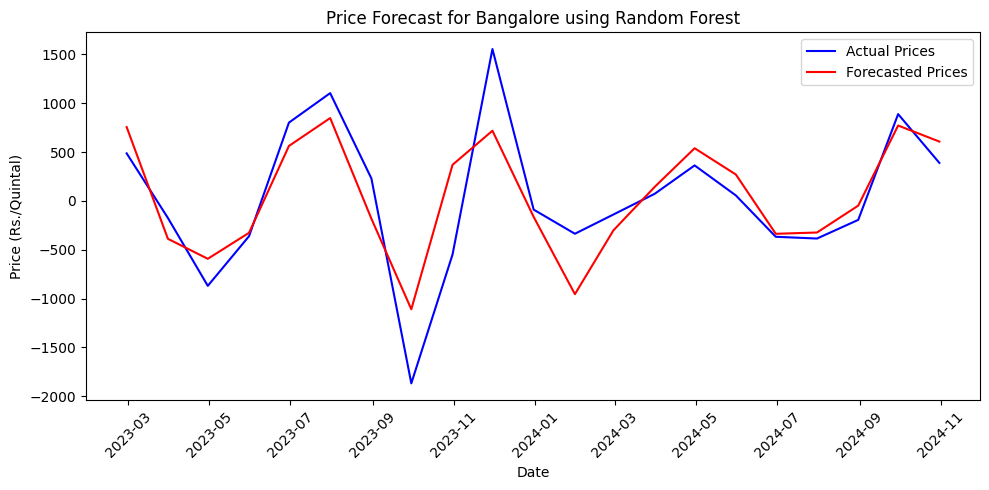

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


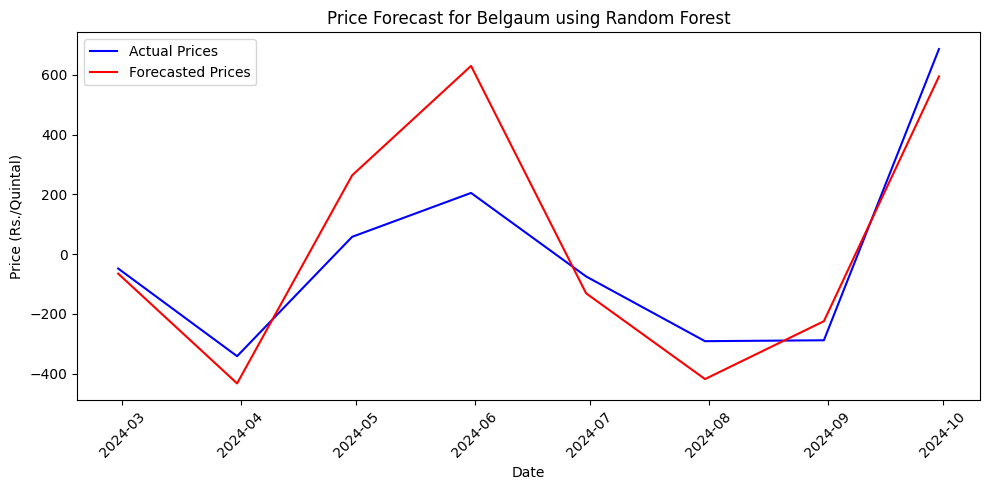

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


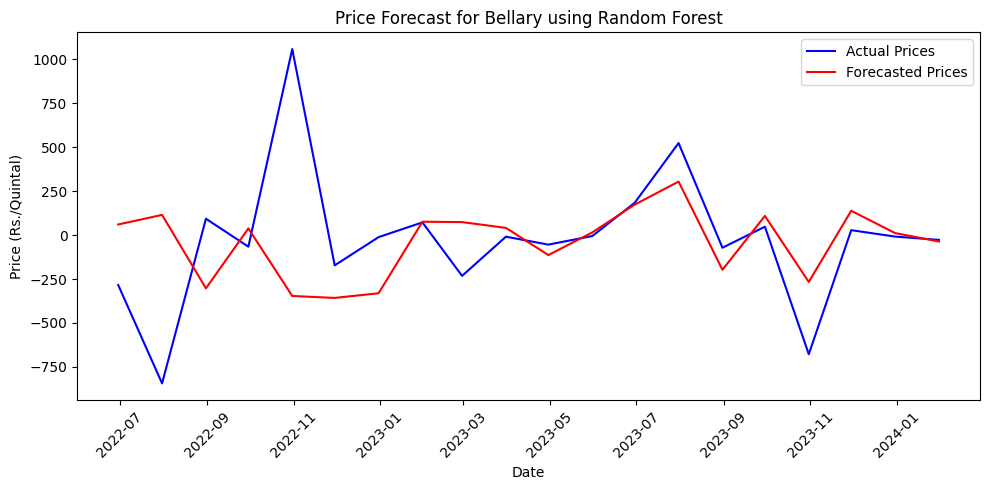

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


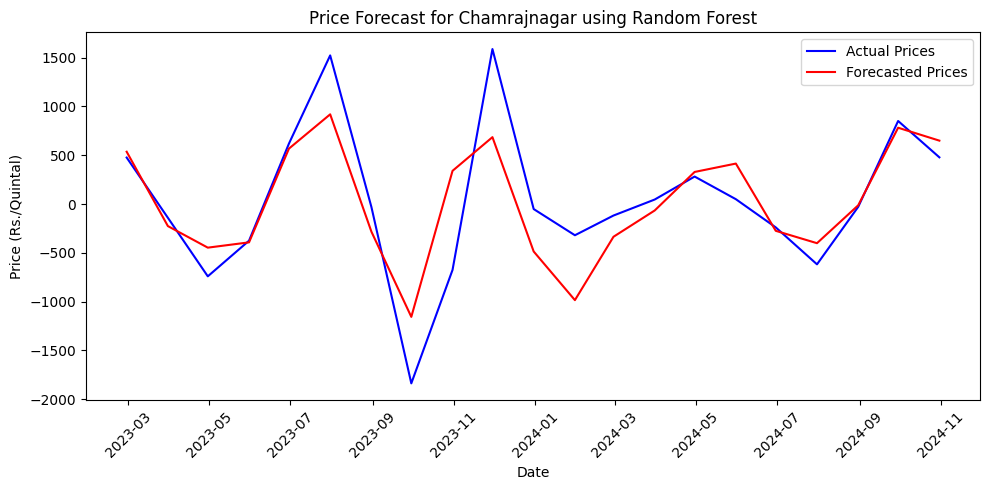

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


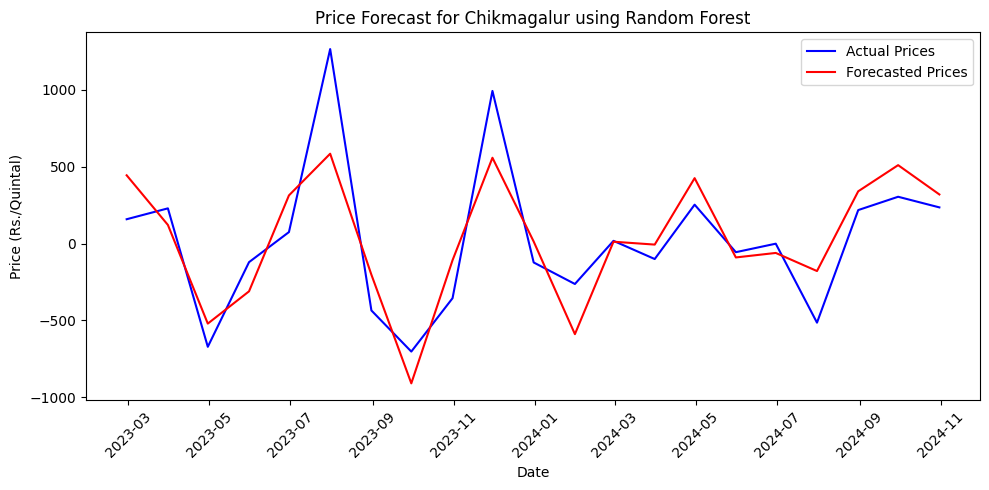

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


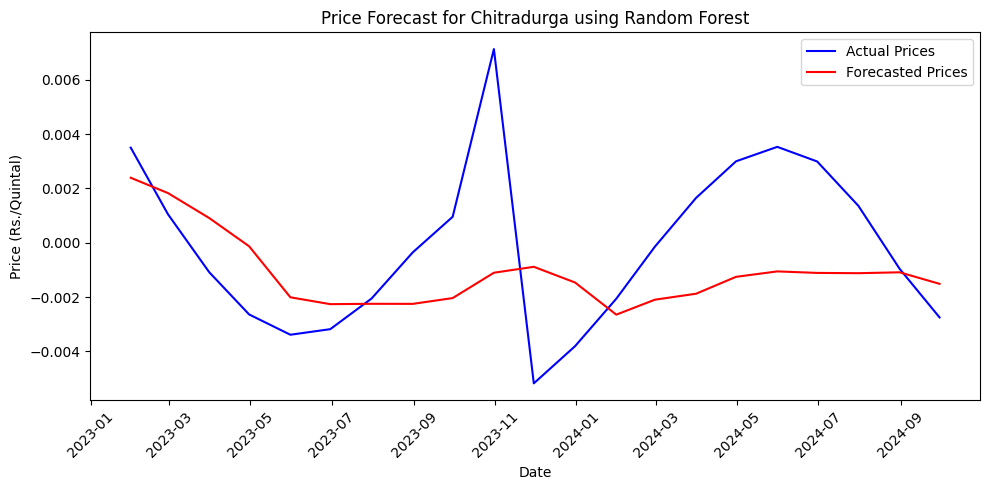

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


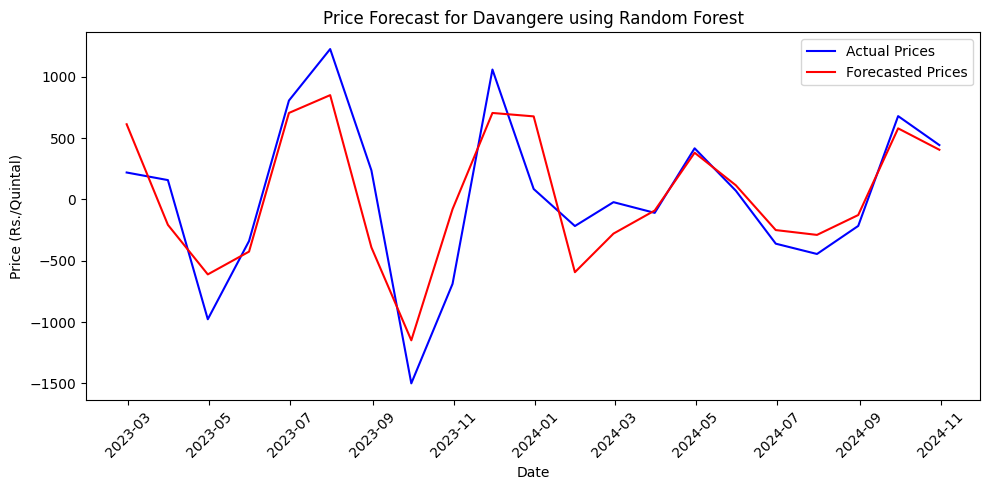

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


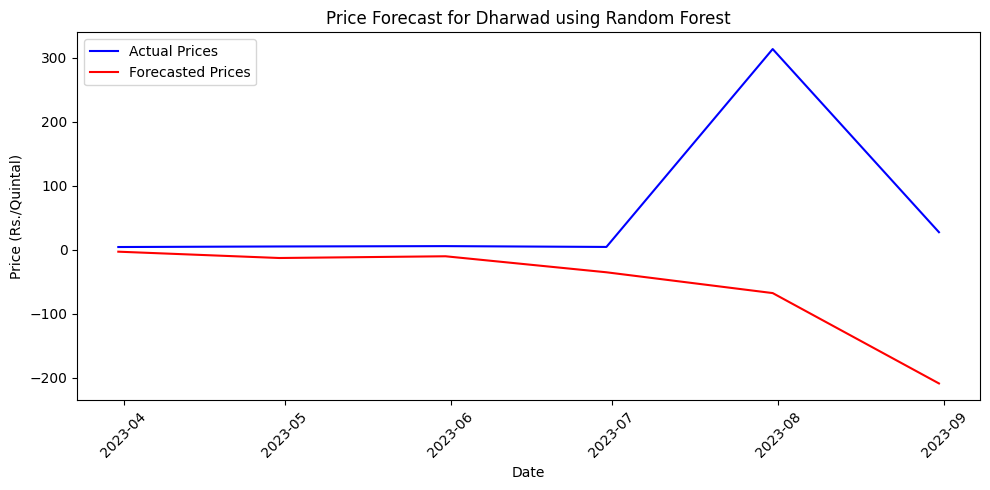

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


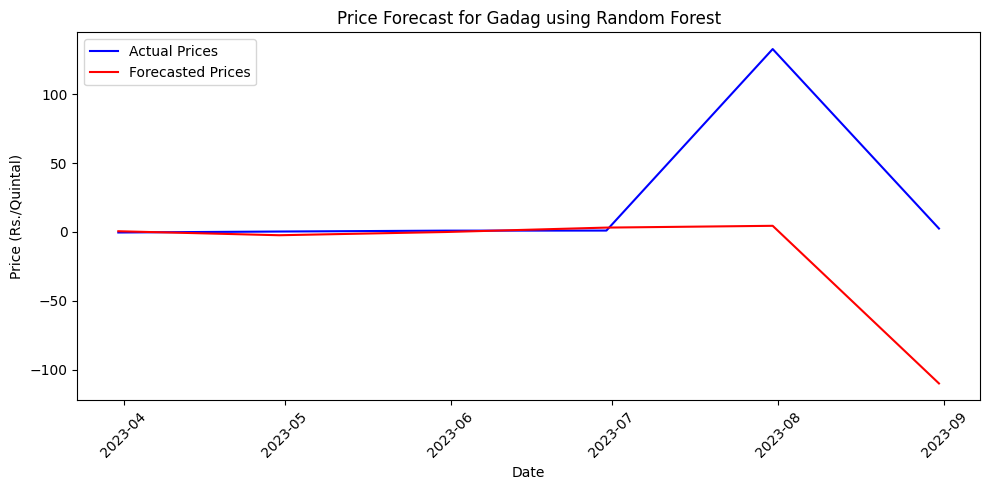

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


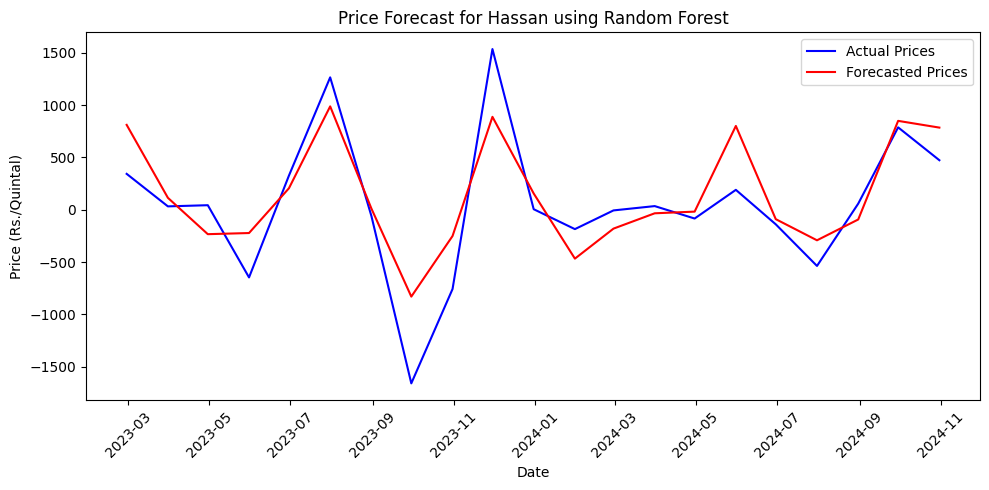

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


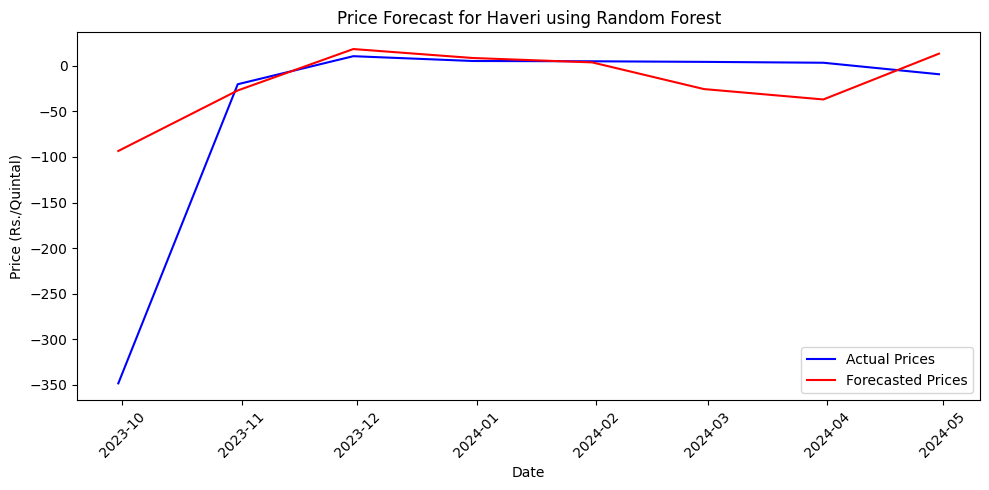

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


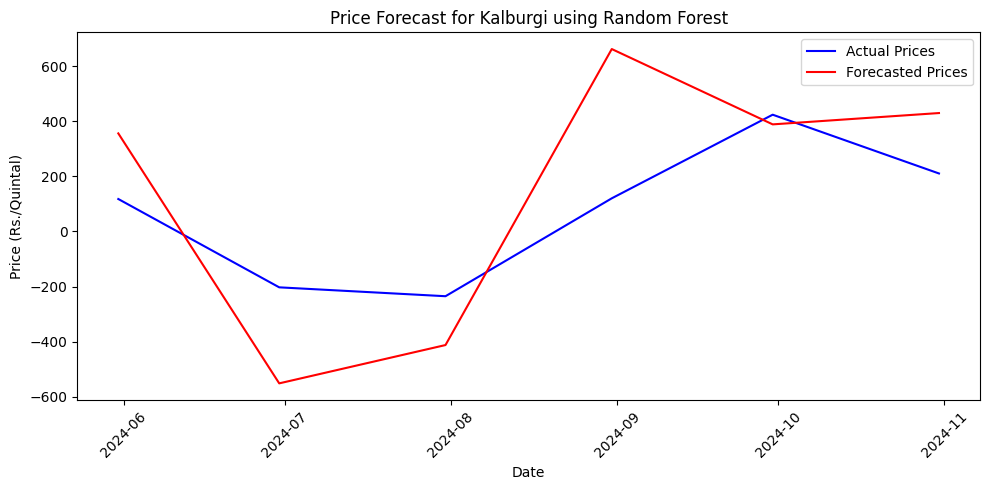

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


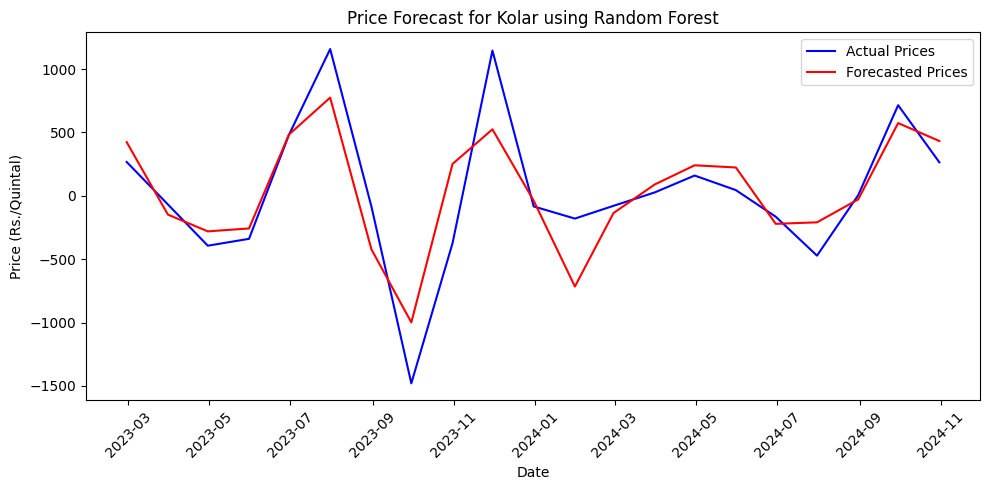

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


Not enough data for Koppal. Skipping decomposition.
Not enough data for Madikeri(Kodagu). Skipping decomposition.


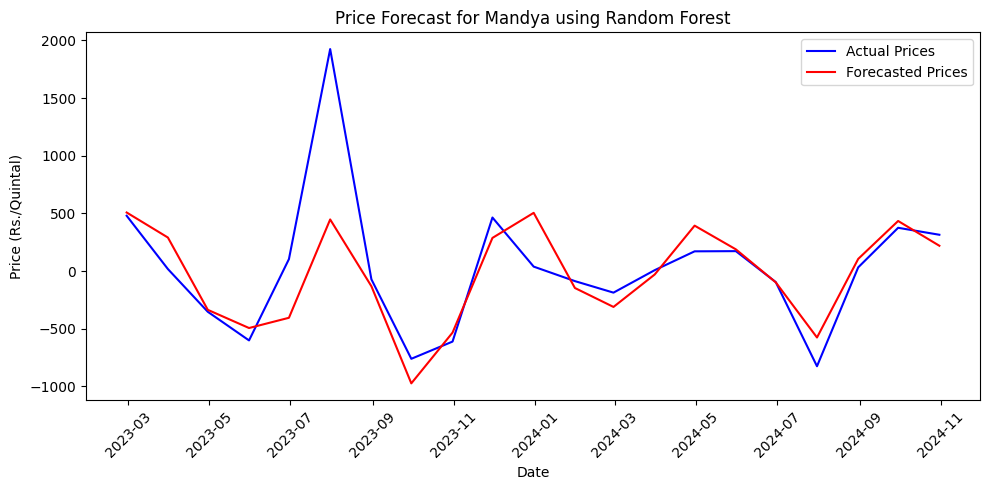

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


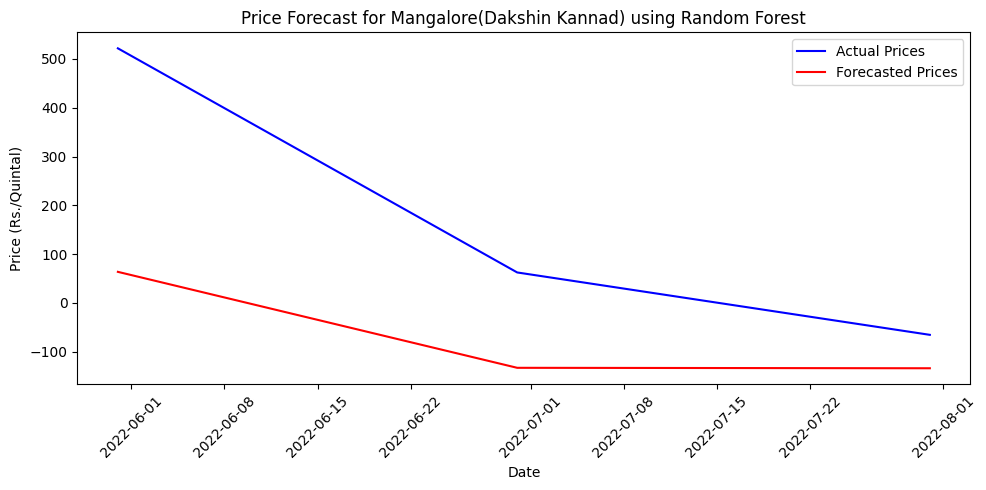

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


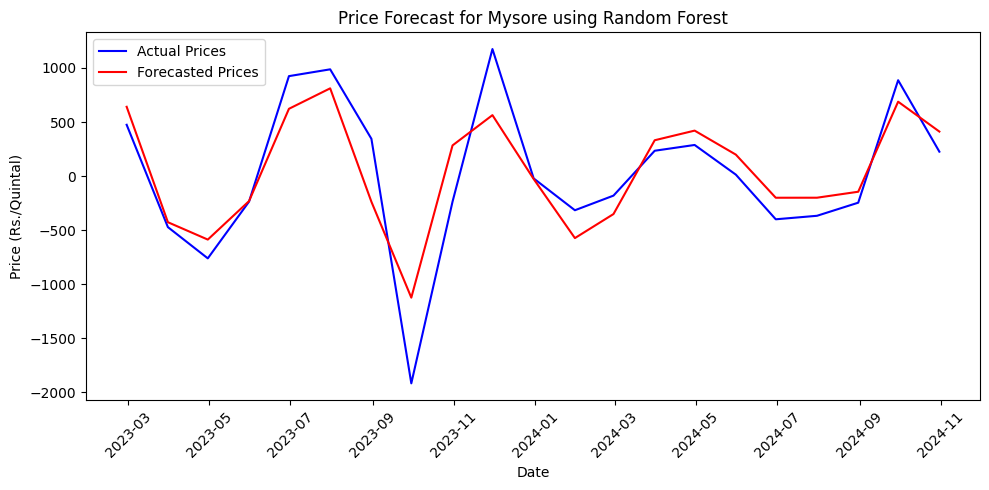

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


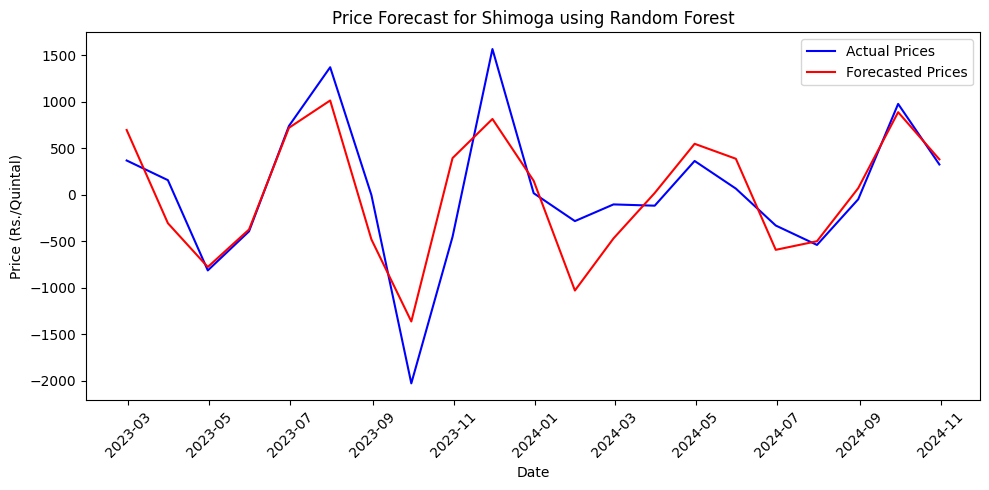

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


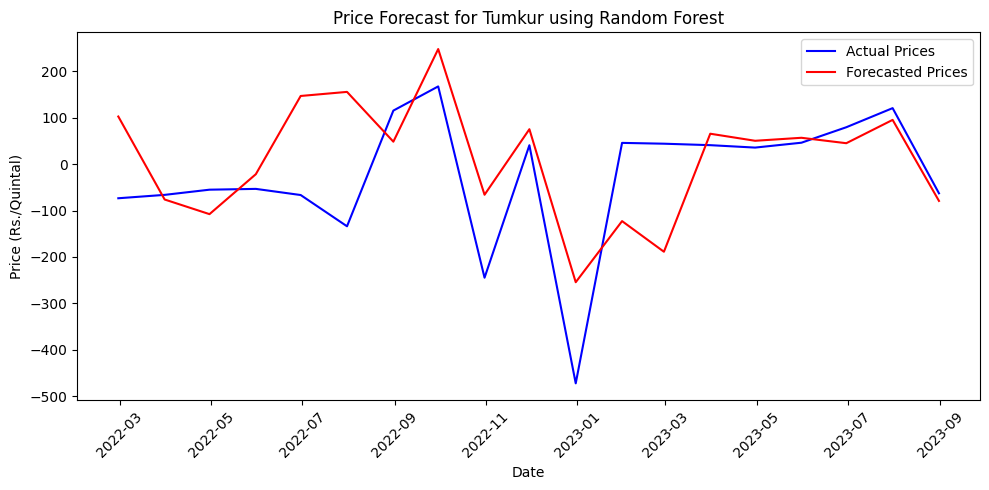

<ipython-input-39-ce447ac98cba>:31: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')
<ipython-input-39-ce447ac98cba>:31: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')


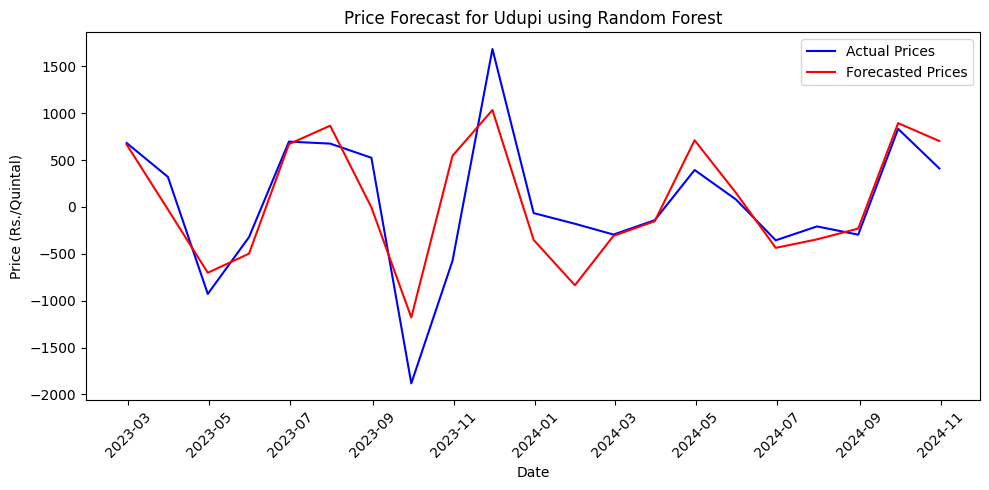

                                  MAE            MSE        RMSE        R2
Bangalore                  290.660623  151944.566633  389.800676  0.704691
Belgaum                    134.715487   32913.990131  181.422132  0.673853
Bellary                    255.964955  183272.518660  428.103397 -0.316354
Chamrajnagar               300.475048  178336.423161  422.298974  0.675954
Chikmagalur                207.218111   64997.082452  254.945254  0.700639
Chitradurga                  0.002451       0.000009    0.003080 -0.060877
Davangere                  259.583608  105496.524694  324.802286  0.738621
Dharwad                    116.505762   33969.161416  184.307247 -1.623729
Gadag                       41.316603    4868.776223   69.776617 -1.007995
Hassan                     279.528007  125670.107239  354.499799  0.710112
Haveri                      45.829618    8509.673230   92.247890  0.361975
Kalburgi                   260.017032   92073.344063  303.435898 -0.741779
Kolar                    

In [ ]:
# Random Forest model n_estimators = 150 , depth = 20

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# Assuming your dataframe tomato_df has 'Date' already as the index
# Group the data by District Name and Date, then aggregate the prices
aggregated_df = tomato_df.groupby(['District Name', tomato_df.index]).agg({'Capped Prices': 'mean'}).reset_index()

# Rename the columns for clarity
aggregated_df.columns = ['District Name', 'Date', 'Capped Prices']

# Set the 'Date' column as the index again
aggregated_df.set_index('Date', inplace=True)

# Group the data by District Name for analysis
grouped = aggregated_df.groupby('District Name')

# Initialize dictionaries to store results
forecast_results = {}
performance_metrics = {}

# Iterate over each group (district)
for district, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:
        print(f"Not enough data for {district}. Skipping decomposition.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency and ensure it's odd and >= 3
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_series})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Add rolling features
    df['rolling_mean'] = df['Value'].rolling(window=3).mean()
    df['rolling_std'] = df['Value'].rolling(window=3).std()

    # Drop rows with NaN values created by lags and rolling calculations
    df.dropna(inplace=True)

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=150,max_depth = 20 ,random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Inverse transform the predictions to the original scale
    y_pred_inverse = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_inverse = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Store the forecast results along with their dates
    forecast_results[district] = {
        'Date': y_test.index,
        'Forecast': y_pred_inverse
    }

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_inverse, y_pred_inverse)
    mse = mean_squared_error(y_test_inverse, y_pred_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inverse, y_pred_inverse)

    # Store metrics for the district
    performance_metrics[district] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

    # Optional: Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(y_test.index, y_test_inverse, label='Actual Prices', color='blue')
    plt.plot(y_test.index, y_pred_inverse, label='Forecasted Prices', color='red')
    plt.title(f'Price Forecast for {district} using Random Forest')
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Convert forecast results to DataFrame for further analysis or export
forecast_dfs = []
for district, data in forecast_results.items():
    temp_df = pd.DataFrame({
        'District Name': district,
        'Date': data['Date'],
        'Forecast': data['Forecast']
    })
    forecast_dfs.append(temp_df)

# Combine all the forecast data into one DataFrame
forecast_df = pd.concat(forecast_dfs)
forecast_df.set_index(['District Name', 'Date'], inplace=True)

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T
print(performance_df)


In [ ]:
tomato_df.columns

Index(['District Name', 'Variety', 'Modal Price (Rs./Quintal)'], dtype='object')

In [ ]:


df['Modal Price (Rs./Quintal)'] = pd.to_numeric(df['Modal Price (Rs./Quintal)'].str.replace(',', ''), errors='coerce')

<ipython-input-73-e08b8eadaf4b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Modal Price (Rs./Quintal)'] = pd.to_numeric(df['Modal Price (Rs./Quintal)'].str.replace(',', ''), errors='coerce')


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1591566 entries, 0 to 1591565
Data columns (total 4 columns):
 #   Column                     Non-Null Count    Dtype         
---  ------                     --------------    -----         
 0   District Name              1591566 non-null  object        
 1   Variety                    1591566 non-null  object        
 2   Modal Price (Rs./Quintal)  1394662 non-null  float64       
 3   Price Date                 1591270 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 48.6+ MB


In [ ]:
df.columns

Index(['District Name', 'Variety', 'Modal Price (Rs./Quintal)', 'Price Date'], dtype='object')

In [ ]:
df.head()

,District Name,Variety,Modal Price (Rs./Quintal),Price Date
0,Chikmagalur,Alsandikai,1750.0,2023-12-17
1,Chikmagalur,Alsandikai,1750.0,2023-12-18
2,Chikmagalur,Alsandikai,2700.0,2023-08-04
3,Chikmagalur,Alsandikai,3500.0,2024-03-11
4,Bangalore,Alsandikai,1900.0,2018-02-24


In [ ]:
df.isnull().sum()

,0
District Name,0
Variety,0
Modal Price (Rs./Quintal),196904
Price Date,296


In [ ]:
import pandas as pd
import numpy as np

# step 1: Cap outliers using the IQR method for each variety
def cap_outliers(group):
    Q1 = group['Modal Price (Rs./Quintal)'].quantile(0.25)
    Q3 = group['Modal Price (Rs./Quintal)'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    group['Capped Price'] = np.where(group['Modal Price (Rs./Quintal)'] < lower_bound, lower_bound, group['Modal Price (Rs./Quintal)'])
    group['Capped Price'] = np.where(group['Capped Price'] > upper_bound, upper_bound, group['Capped Price'])
    return group

# Apply the function to each variety
df = df.groupby(['District Name', 'Variety'], group_keys=False).apply(cap_outliers)

# Step 2: Fill missing values with the previous price for that variety
df['Capped Price'] = df.groupby(['District Name', 'Variety'])['Capped Price'].fillna(method='ffill')

# Step 3: Fill missing values with the next price for that variety
df['Capped Price'] = df.groupby(['District Name', 'Variety'])['Capped Price'].fillna(method='bfill')


# Now, you can use 'df' in the previous model training code


<ipython-input-78-1c74dd7e7907>:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby(['District Name', 'Variety'], group_keys=False).apply(cap_outliers)
<ipython-input-78-1c74dd7e7907>:19: FutureWarning: SeriesGroupBy.fillna is deprecated and will be removed in a future version. Use obj.ffill() or obj.bfill() for forward or backward filling instead. If you want to fill with a single value, use Series.fillna instead
  df['Capped Price'] = df.groupby(['District Name', 'Variety'])['Capped Price'].fillna(method='ffill')
<ipython-input-78-1c74dd7e7907>:19: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
 

In [ ]:
df.head()

,District Name,Variety,Modal Price (Rs./Quintal),Price Date,Capped Price
0,Chikmagalur,Alsandikai,1750.0,2023-12-17,1750.0
1,Chikmagalur,Alsandikai,1750.0,2023-12-18,1750.0
2,Chikmagalur,Alsandikai,2700.0,2023-08-04,2700.0
3,Chikmagalur,Alsandikai,3500.0,2024-03-11,3500.0
4,Bangalore,Alsandikai,1900.0,2018-02-24,1900.0


In [ ]:
df.isnull().sum()

,0
District Name,0
Variety,0
Modal Price (Rs./Quintal),196904
Price Date,296
Capped Price,30493


In [ ]:
df['Variety'].unique()

array(['Alsandikai', '-', 'Hybrid', 'Local', 'Other', 'Jawari',
       'Banana - Green', 'Bitter Gourd', 'Borehannu', 'Brinjal', 'Round',
       'Round/Long', 'Bullar-W', 'Chapparada Avarekai', 'Coriander',
       'Cow', 'Dry Grapes', 'Elephant Yam (Suran)', 'Dry',
       'Fresh Unbleached', 'Goat', 'Ground Nut Seed', 'Achhu', 'Black',
       'Nizamabad', 'NO 2', 'Unde', 'Mudde', 'Yellow', 'Red', 'Kurikatu',
       'NO 3', 'He Baffelo', 'Honge Seed', 'Knool Khol',
       'Horse gram (Whole)', 'Lime', 'Badami', 'Keshar', 'Hapus(Alphaso)',
       'Malgoa', 'Neelam', 'Raspuri', 'Totapuri', 'Onion',
       'Bangalore-Samall', 'Beelary-Red', 'Puna', 'Pusa-Red', 'White',
       'Bombay (U.P.)', 'Telagi', 'Papaya', 'Safflower', 'Seemebadanekai',
       'She Goat', 'Snakeguard', 'Thogarikai', 'Apple',
       'Kasmir/Shimla - II', 'Elakki Bale', 'Nauti Bale', 'Medium',
       'Banana - Ripe', 'Nendra Bale', 'Pachha Bale', 'Rasa Bale',
       'Ordinary Big', 'Beetroot', 'Bull', 'Cabbage', 'Capsi

In [ ]:

# List of non-crop entries to filter out
non_crops = ['Bull', 'Cow', 'Sheep', 'She Buffalo', 'Ox', 'Goat', 'She Goat',
             'Ram', 'He Buffalo', 'Calf', 'Skin And Hide', 'Wood']

# Filter out rows where the 'Commodity' column matches any of the non-crop entries
filtered_df = df[~df['Variety'].isin(non_crops)]


In [ ]:

filtered_df.isnull().sum()

,0
District Name,0
Variety,0
Modal Price (Rs./Quintal),196904
Price Date,296
Capped Price,30493


In [ ]:
filtered_df_commodity = filtered_df.groupby('Variety').filter(lambda x: len(x) >= 10000)

In [ ]:
filter = filtered_df_commodity = filtered_df.groupby('Variety').filter(lambda x: len(x) >= 1000)

In [ ]:
filtered_df_commodity.shape

(1549126, 5)

In [ ]:
filtered_df_commodity.drop('Modal Price (Rs./Quintal)',inplace = True,axis = 1)

In [ ]:
filtered_df_commodity.dropna(inplace = True)

In [ ]:
filtered_df_commodity.isnull().sum()

,0
District Name,0
Variety,0
Price Date,0
Capped Price,0


In [ ]:
filtered_df_commodity.shape

(1519486, 4)

In [ ]:
filtered_df_commodity.head()

,District Name,Variety,Price Date,Capped Price
0,Chikmagalur,Alsandikai,2023-12-17,1750.0
1,Chikmagalur,Alsandikai,2023-12-18,1750.0
2,Chikmagalur,Alsandikai,2023-08-04,2700.0
3,Chikmagalur,Alsandikai,2024-03-11,3500.0
4,Bangalore,Alsandikai,2018-02-24,1900.0


In [ ]:
filtered_df_commodity.sort_values(by='Price Date', inplace=True)

In [ ]:
filtered_df_commodity.reset_index(drop=True, inplace=True)

In [ ]:
filtered_df_commodity.shape

(1519486, 4)

In [ ]:
import pandas as pd

# Assuming your DataFrame is named filtered_df_commodity
csv_file_path = 'filtered_df_commodity.csv'  # Specify the file name or path

# Save the DataFrame as a CSV file
filtered_df_commodity.to_csv(csv_file_path, index=False)

print(f"DataFrame saved as {csv_file_path}")


DataFrame saved as filtered_df_commodity.csv


In [ ]:
import pandas as pd
from google.colab import files

# Assuming your DataFrame is named filtered_df_commodity
csv_file_path = 'filtered_df_commodity.csv'  # File name

# Save the DataFrame as a CSV file
filtered_df_commodity.to_csv(csv_file_path, index=False)

# Download the file
files.download(csv_file_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
filtered_df_commodity.head()

,District Name,Variety,Price Date,Capped Price
0,Bangalore,Byadgi,2015-01-01,17200.0
1,Bangalore,Bitter Gourd,2015-01-01,1800.0
2,Mysore,Sweet Pumpkin,2015-01-01,250.0
3,Shimoga,Gorabalu,2015-01-01,22376.5
4,Bangalore,Papaya,2015-01-01,800.0


In [ ]:
pip install statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 88.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.9/233.9 kB 16.6 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import joblib
from statsmodels.tsa.seasonal import STL


# Aggregate the mean price for each variety under each district on the same date
aggregated_df = filtered_df_commodity.groupby(['District Name', 'Variety', 'Price Date']).agg({'Capped Price': 'mean'}).reset_index()

# Set Date as the index
aggregated_df.set_index('Price Date', inplace=True)

# Group the data by District Name and Variety (commodity)
grouped = aggregated_df.groupby(['District Name', 'Variety'])

# Initialize dictionaries to store models and metrics
model_dict = {}
performance_metrics = {}

# Iterate over each group (district and variety)
for (district, variety), group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Price'].resample('ME').mean().ffill()

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:
        print(f"Not enough data for {district} - {variety}. Skipping.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Check if there are enough data points after differencing
    if len(differenced_data) < 12:
        print(f"Not enough data after differencing for {district} - {variety}. Skipping.")
        continue

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_series})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Add rolling features
    df['rolling_mean'] = df['Value'].rolling(window=3).mean()
    df['rolling_std'] = df['Value'].rolling(window=3).std()

    # Drop rows with NaN values created by lags and rolling calculations
    df.dropna(inplace=True)

    # Check if there are any samples left for training
    if df.empty:
        print(f"No samples left after feature engineering for {district} - {variety}. Skipping.")
        continue

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Check if training data is sufficient
    if len(X_train) == 0 or len(y_train) == 0:
        print(f"Training data is empty for {district} - {variety}. Skipping.")
        continue

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=150, max_depth=20, random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Inverse transform the predictions to the original scale
    y_pred_inverse = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_inverse = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Store the trained model
    model_dict[(district, variety)] = model

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_inverse, y_pred_inverse)
    mse = mean_squared_error(y_test_inverse, y_pred_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inverse, y_pred_inverse)

    # Store metrics for the district and variety
    performance_metrics[(district, variety)] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

# Save all models to a single PKL file
joblib.dump(model_dict, 'random_forest_models.pkl')

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T


Not enough data for Bagalkot - Avare (Whole). Skipping.
Not enough data for Bagalkot - Black Gram Dal. Skipping.
Not enough data for Bagalkot - Green Ginger. Skipping.
Not enough data for Bagalkot - Guntur. Skipping.
Not enough data for Bagalkot - Neem Seed. Skipping.
Not enough data for Bagalkot - Same/Savi Local. Skipping.
Not enough data for Belgaum - Alasande Gram. Skipping.
Not enough data for Belgaum - Chennangi Dal. Skipping.
Not enough data for Belgaum - Dry Grapes. Skipping.
Not enough data for Belgaum - F-1054. Skipping.
Not enough data for Belgaum - FQ(Burma). Skipping.
Not enough data for Belgaum - Green Gram Dal. Skipping.
Not enough data for Belgaum - Sona. Skipping.
Training data is empty for Belgaum - Tamarind Seed. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Bellary - Alsandikai. Skipping.
Not enough data for Bellary - Avare (Whole). Skipping.
Not enough data for Bellary - Capsicum. Skipping.
Not enough data for Bellary - Chilly Capsicum. Skipping.
Not enough data for Bellary - Copra. Skipping.
Not enough data for Bellary - Grade-III. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Bellary - Tender Coconut. Skipping.
Not enough data for Bellary - Thondekai. Skipping.
Not enough data for Bellary - Varalakshmi  (Ginned). Skipping.
Not enough data for Bellary - White. Skipping.
Not enough data for Bidar - Big (With Shell). Skipping.
Not enough data for Bidar - Garlic. Skipping.
Not enough data for Bidar - H.D.. Skipping.
Not enough data for Bidar - Paddy. Skipping.
Not enough data for Bijapur - Balli/Habbu. Skipping.
Not enough data for Bijapur - Coarse. Skipping.
Not enough data for Bijapur - Copra. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Bijapur - She Baffelo. Skipping.
Not enough data for Bijapur - White. Skipping.
Not enough data for Chamrajnagar - Arhar Dal(Tur). Skipping.
Not enough data for Chamrajnagar - Bengal Gram Dal. Skipping.
Not enough data for Chamrajnagar - Bitter Gourd. Skipping.
Not enough data for Chamrajnagar - Black Gram Dal. Skipping.
Not enough data for Chamrajnagar - Brinjal. Skipping.
Not enough data for Chamrajnagar - Drumstick. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Training data is empty for Chamrajnagar - Green Gram Dal. Skipping.
Not enough data for Chamrajnagar - Green Peas. Skipping.
Not enough data for Chamrajnagar - Leafy Vegetables. Skipping.
Not enough data for Chamrajnagar - Lime. Skipping.
Not enough data for Chamrajnagar - Malabar. Skipping.
Not enough data for Chamrajnagar - Onion. Skipping.
Not enough data for Chamrajnagar - Sheep Medium. Skipping.
Not enough data for Chamrajnagar - White Pumpkin. Skipping.
Not enough data for Chamrajnagar - other. Skipping.
Not enough data for Chikmagalur - Alsandikai. Skipping.
Not enough data for Chikmagalur - Bangalore-Samall. Skipping.
Not enough data for Chikmagalur - Beelary-Red. Skipping.
Not enough data for Chikmagalur - Black Gram (Whole). Skipping.
Not enough data for Chikmagalur - Black Gram Dal. Skipping.
Not enough data for Chikmagalur - Byadgi. Skipping.
Not enough data for Chikmagalur - Coarse. Skipping.
Not enough data for Chikmagalur - Elephant Yam (Suran). Skipping.
Not enough data

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Chikmagalur - Pomogranate. Skipping.
Not enough data for Chikmagalur - Snakeguard. Skipping.
Not enough data for Chikmagalur - Sona. Skipping.
Not enough data for Chikmagalur - Thogarikai. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Chitradurga - Bhindi. Skipping.
Not enough data for Chitradurga - Brinjal. Skipping.
Not enough data for Chitradurga - Byadgi. Skipping.
Not enough data for Chitradurga - Chali. Skipping.
Not enough data for Chitradurga - Cowpea (Whole). Skipping.
Not enough data for Chitradurga - Dry. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Chitradurga - Green Chilly. Skipping.
Not enough data for Chitradurga - Green Gram Dal. Skipping.
Not enough data for Chitradurga - Hansa. Skipping.
Not enough data for Chitradurga - Jowar ( White). Skipping.
Not enough data after differencing for Chitradurga - Jowar Hybrid. Skipping.
Training data is empty for Chitradurga - Malabar. Skipping.
Not enough data for Chitradurga - Neem Seed. Skipping.
Not enough data for Chitradurga - Soyabeen. Skipping.
Not enough data for Chitradurga - White. Skipping.
Not enough data for Davangere - Achhu. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Davangere - Guntur. Skipping.
Not enough data for Davangere - Leafy Vegetables. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Davangere - Red. Skipping.
Not enough data for Davangere - Sona Mahsuri. Skipping.
No samples left after feature engineering for Davangere - Unde. Skipping.
Not enough data for Dharwad - Apple. Skipping.
Not enough data for Dharwad - Banana - Green. Skipping.
Not enough data for Dharwad - Beetroot. Skipping.
Not enough data for Dharwad - Bhindi. Skipping.
Not enough data for Dharwad - Bitter Gourd. Skipping.
Not enough data for Dharwad - Brinjal. Skipping.
Not enough data for Dharwad - Bunch Beans. Skipping.
Not enough data for Dharwad - CR 1009 (Coarse) Boiled. Skipping.
Not enough data for Dharwad - Cabbage. Skipping.
Not enough data for Dharwad - Capsicum. Skipping.
Not enough data for Dharwad - Cauliflower. Skipping.
Not enough data for Dharwad - Cucumbar. Skipping.
Not enough data for Dharwad - Drumstick. Skipping.
Not enough data for Dharwad - Garlic. Skipping.
Not enough data for Dharwad - Green Avare (W). Skipping.
Not enough data for Dharwad - Green Chilly.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Dharwad - Water Melon. Skipping.
Not enough data after differencing for Gadag - Arhar Dal(Tur). Skipping.
Not enough data for Gadag - Beetroot. Skipping.
Not enough data for Gadag - Big (With Shell). Skipping.
Not enough data for Gadag - Bitter Gourd. Skipping.
Not enough data for Gadag - Bottle Gourd. Skipping.
Training data is empty for Gadag - Byadgi. Skipping.
Not enough data for Gadag - Cauliflower. Skipping.
Not enough data for Gadag - Coarse. Skipping.
Not enough data for Gadag - Drumstick. Skipping.
Not enough data for Gadag - Green Avare (W). Skipping.
Not enough data for Gadag - Green Peas. Skipping.
Not enough data for Gadag - LH-1556. Skipping.
Not enough data for Gadag - Leafy Vegetables. Skipping.
Not enough data for Gadag - Medium. Skipping.
Not enough data for Gadag - Neem Seed. Skipping.
Not enough data for Gadag - Orange. Skipping.
Not enough data for Gadag - Pine Apple. Skipping.
Not enough data for Gadag - Pomogranate. Skipping.
Not enough data f

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Hassan - Local(Raw). Skipping.
Not enough data for Hassan - Methiseeds. Skipping.
Not enough data after differencing for Hassan - Mousambi. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Hassan - Papaya. Skipping.
Not enough data for Hassan - Pomogranate. Skipping.
Not enough data for Hassan - Rashi. Skipping.
Not enough data after differencing for Hassan - Sajje. Skipping.
Not enough data for Hassan - Sheep Medium. Skipping.
No samples left after feature engineering for Hassan - Suvarnagadde. Skipping.
Not enough data for Haveri - 1001. Skipping.
Not enough data for Haveri - Big (With Shell). Skipping.
Not enough data for Haveri - Byadgi. Skipping.
Not enough data for Haveri - Capsicum. Skipping.
Not enough data for Haveri - Carrot. Skipping.
Not enough data for Haveri - Chilly Capsicum. Skipping.
Not enough data for Haveri - Drumstick. Skipping.
No samples left after feature engineering for Haveri - FQ(Burma). Skipping.
Not enough data for Haveri - Green Avare (W). Skipping.
Not enough data for Haveri - Green Peas. Skipping.
Not enough data for Haveri - Knool Khol. Skipping.
Not enough data for Haveri - Paddy Dappa. Skipping.
Not enough data for H

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Kalburgi - Green Gram Dal. Skipping.
Not enough data for Kalburgi - She Baffelo. Skipping.
Not enough data for Kalburgi - Sheep Small. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Karwar(Uttar Kannad) - Gejje. Skipping.
Not enough data for Karwar(Uttar Kannad) - Ground Nut Seed. Skipping.
Not enough data for Karwar(Uttar Kannad) - Jaya. Skipping.
Not enough data for Karwar(Uttar Kannad) - Jowar ( White). Skipping.
Not enough data for Karwar(Uttar Kannad) - Lime. Skipping.
Not enough data for Karwar(Uttar Kannad) - Medium. Skipping.
Not enough data for Karwar(Uttar Kannad) - Mudde. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Karwar(Uttar Kannad) - Paddy Jyoti. Skipping.
No samples left after feature engineering for Karwar(Uttar Kannad) - Paddy fine. Skipping.
Not enough data for Karwar(Uttar Kannad) - She Baffelo. Skipping.
No samples left after feature engineering for Karwar(Uttar Kannad) - Sheep Small. Skipping.
Not enough data for Karwar(Uttar Kannad) - Sippegotu. Skipping.
Not enough data for Karwar(Uttar Kannad) - Super Fine. Skipping.
Not enough data for Karwar(Uttar Kannad) - Tamarind Fruit. Skipping.
Not enough data for Karwar(Uttar Kannad) - Unde. Skipping.
Not enough data for Kolar - Alasande Gram. Skipping.
Not enough data for Kolar - Alsandikai. Skipping.
Not enough data for Kolar - CR 1009 (Coarse) Boiled. Skipping.
Not enough data for Kolar - Chennangi Dal. Skipping.
Not enough data for Kolar - Coconut. Skipping.
Not enough data for Kolar - Jowar Hybrid. Skipping.
Not enough data for Kolar - Puna. Skipping.
Not enough data for Kolar - Super Fine. Skipping.
Not enough data 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


No samples left after feature engineering for Madikeri(Kodagu) - Arhar Dal(Tur). Skipping.
Not enough data for Madikeri(Kodagu) - Avare (Whole). Skipping.
Not enough data for Madikeri(Kodagu) - Bhindi. Skipping.
Not enough data for Madikeri(Kodagu) - Black. Skipping.
Not enough data for Madikeri(Kodagu) - Cabbage. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Madikeri(Kodagu) - Jaya. Skipping.
Not enough data for Madikeri(Kodagu) - Lime. Skipping.
Not enough data for Madikeri(Kodagu) - Thondekai. Skipping.
Not enough data for Madikeri(Kodagu) - Tomato. Skipping.
Not enough data for Mandya - Alsandikai. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Mandya - Bunch Beans. Skipping.
Not enough data after differencing for Mandya - Byadgi. Skipping.
Not enough data for Mandya - Chali. Skipping.
Not enough data for Mandya - Chapparada Avarekai. Skipping.
Not enough data for Mandya - Coconut. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Mandya - FQ(Burma). Skipping.
Not enough data for Mandya - Garlic. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Mandya - Green Gram Dal. Skipping.
Not enough data for Mandya - Guntur. Skipping.
Not enough data for Mandya - Hybrid. Skipping.
Not enough data for Mandya - Jowar ( White). Skipping.
Not enough data for Mandya - Leafy Vegetables. Skipping.
Not enough data for Mandya - Nendra Bale. Skipping.
Not enough data after differencing for Mandya - Pachha Bale. Skipping.
Not enough data for Mandya - Paddy Medium. Skipping.
Not enough data for Mandya - Peas Wet. Skipping.
Not enough data for Mandya - Pomogranate. Skipping.
Training data is empty for Mandya - Sheep Small. Skipping.
Not enough data for Mandya - Sona. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Mandya - White. Skipping.
Not enough data for Mandya - White Pumpkin. Skipping.
Training data is empty for Mangalore(Dakshin Kannad) - Ashgourd. Skipping.
Not enough data for Mangalore(Dakshin Kannad) - Black Gram (Whole). Skipping.
Not enough data for Mangalore(Dakshin Kannad) - Cucumbar. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Mangalore(Dakshin Kannad) - Green Chilly. Skipping.
Not enough data for Mangalore(Dakshin Kannad) - Green Gram Dal. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Mangalore(Dakshin Kannad) - Sapota. Skipping.
Training data is empty for Mangalore(Dakshin Kannad) - Sweet Potato. Skipping.
Not enough data for Mangalore(Dakshin Kannad) - Sweet Pumpkin. Skipping.
Not enough data for Mangalore(Dakshin Kannad) - White Pumpkin. Skipping.
Not enough data for Mysore - 1001. Skipping.
Not enough data for Mysore - Byadgi. Skipping.
Not enough data for Mysore - Chapparada Avarekai. Skipping.
Not enough data for Mysore - Guntur. Skipping.
Not enough data for Mysore - Soyabeen. Skipping.
Not enough data for Mysore - Totapuri. Skipping.
Not enough data for Mysore - Turmeric Stick. Skipping.
Not enough data for Raichur - Alasande Gram. Skipping.
No samples left after feature engineering for Raichur - Big (With Shell). Skipping.
Not enough data for Raichur - Black Gram Dal. Skipping.
Not enough data for Raichur - Grade-I. Skipping.
Not enough data for Raichur - Green Chilly. Skipping.
Not enough data for Raichur - Green Peas. Skipping.
Not eno

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Shimoga - Totapuri. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Tumkur - Brinjal. Skipping.
Not enough data for Tumkur - Carrot. Skipping.
Not enough data for Tumkur - Dry. Skipping.
Not enough data for Tumkur - Elakki Bale. Skipping.
Not enough data for Tumkur - Green Peas. Skipping.
Not enough data for Tumkur - Karbhuja. Skipping.
Not enough data for Tumkur - Local(Raw). Skipping.
Not enough data for Tumkur - Malabar. Skipping.
Not enough data for Tumkur - Mousambi. Skipping.
Training data is empty for Tumkur - Paddy Dappa. Skipping.
Not enough data for Tumkur - Paddy Medium. Skipping.
Not enough data for Tumkur - Papaya. Skipping.
Not enough data for Tumkur - Potato. Skipping.
Not enough data for Tumkur - Sippegotu. Skipping.
Not enough data for Tumkur - Water Melon. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Udupi - CR 1009 (Coarse) Boiled. Skipping.
No samples left after feature engineering for Udupi - Nauti Bale. Skipping.
Not enough data for Udupi - Sona. Skipping.
Not enough data for Udupi - Sweet Pumpkin. Skipping.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Not enough data for Yadgiri - LH-1556. Skipping.


In [ ]:
performance_df

MAE           MSE        RMSE        R2
Bagalkot Arhar (Whole)       211.963452  7.892706e+04  280.939598  0.558657
         Average (Whole)       0.000484  3.101993e-07    0.000557 -0.201241
         Black Gram (Whole)  113.254851  5.733243e+04  239.441923  0.005388
         Gejje               298.567439  1.465222e+05  382.782203  0.530590
         Grade-I             347.251588  3.186816e+05  564.518890  0.265732
...                                 ...           ...         ...       ...
Yadgiri  Black Gram (Whole)  436.369072  7.495090e+05  865.741903  0.113395
         Gejje                64.180948  8.634416e+03   92.921559  0.831005
         Green (Whole)       221.423650  1.288156e+05  358.908890  0.431678
         Hybrid               53.505514  6.656849e+03   81.589516  0.688087
         Sunflower           127.261229  2.478498e+04  157.432465  0.717175

[681 rows x 4 columns]

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import joblib
from statsmodels.tsa.seasonal import STL

# Aggregate the median price for each commodity on the same date
aggregated_df = filtered_df_commodity.groupby(['Variety', 'Price Date']).agg({'Capped Price': 'median'}).reset_index()

# Set Date as the index
aggregated_df.set_index('Price Date', inplace=True)

# Group the data by Variety (commodity)
grouped = aggregated_df.groupby('Variety')

# Initialize dictionaries to store models and metrics
model_dict = {}
performance_metrics = {}

# Iterate over each group (variety)
for variety, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Price'].resample('ME').mean().ffill()

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:
        print(f"Not enough data for {variety}. Skipping.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Check if there are enough data points after differencing
    if len(differenced_data) < 12:
        print(f"Not enough data after differencing for {variety}. Skipping.")
        continue

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_series})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Add rolling features
    df['rolling_mean'] = df['Value'].rolling(window=3).mean()
    df['rolling_std'] = df['Value'].rolling(window=3).std()

    # Drop rows with NaN values created by lags and rolling calculations
    df.dropna(inplace=True)

    # Check if there are any samples left for training
    if df.empty:
        print(f"No samples left after feature engineering for {variety}. Skipping.")
        continue

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Check if training data is sufficient
    if len(X_train) == 0 or len(y_train) == 0:
        print(f"Training data is empty for {variety}. Skipping.")
        continue

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=150, max_depth=20, random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Inverse transform the predictions to the original scale
    y_pred_inverse = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_inverse = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Store the trained model
    model_dict[variety] = model

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_inverse, y_pred_inverse)
    mse = mean_squared_error(y_test_inverse, y_pred_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inverse, y_pred_inverse)

    # Store metrics for the variety
    performance_metrics[variety] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

# Save all models to a single PKL file
joblib.dump(model_dict, 'random_forest_models_commodity.pkl')

# Convert performance metrics to DataFrame for easier viewing
performance_df_commodity = pd.DataFrame(performance_metrics).T



In [ ]:
performance_df_commodity

,MAE,MSE,RMSE,R2
Arhar (Whole),152.160146,6.457008e+04,254.106426,-0.020645
Average (Whole),77.912037,1.325321e+04,115.122572,0.635848
Beans (Whole),165.305339,4.914878e+04,221.695252,0.684964
Beetroot,83.134559,1.356862e+04,116.484404,0.184773
Bhindi,150.564704,4.099830e+04,202.480363,0.613990
Bitter Gourd,192.508261,6.712520e+04,259.085323,0.239537
Black Gram (Whole),205.259927,1.319684e+05,363.274562,0.401136
Bottle Gourd,64.779203,1.036940e+04,101.830239,0.473166
Brinjal,63.318924,6.232199e+03,78.944280,0.864445
Broken Rice,30.199552,1.584294e+03,39.803185,0.566074


In [ ]:
performance_df.shape

(681, 4)

In [ ]:
performance_df_commodity.shape

(46, 4)

In [ ]:
filter

,District Name,Variety,Modal Price (Rs./Quintal),Price Date,Capped Price
0,Chikmagalur,Alsandikai,1750.0,2023-12-17,1750.0
1,Chikmagalur,Alsandikai,1750.0,2023-12-18,1750.0
2,Chikmagalur,Alsandikai,2700.0,2023-08-04,2700.0
3,Chikmagalur,Alsandikai,3500.0,2024-03-11,3500.0
4,Bangalore,Alsandikai,1900.0,2018-02-24,1900.0
...,...,...,...,...,...
1591560,Udupi,White Pumpkin,3500.0,2024-07-18,2850.0
1591561,Udupi,White Pumpkin,3500.0,2024-07-19,2850.0
1591562,Udupi,White Pumpkin,3500.0,2024-07-20,2850.0
1591563,Udupi,White Pumpkin,3500.0,2024-07-22,2850.0


In [ ]:
filter.sort_values(by='Price Date', inplace=True)

In [ ]:
filter.drop('Modal Price (Rs./Quintal)',inplace = True,axis = 1)

In [ ]:
filter.isnull().sum()

,0
District Name,0
Variety,0
Price Date,0
Capped Price,29640


In [ ]:
filter.dropna(inplace = True)

In [ ]:
filter.head()

,District Name,Variety,Price Date,Capped Price
10570,Bidar,Local,2015-01-01,1300.0
1288245,Gadag,Arhar (Whole),2015-01-01,4550.0
1179325,Chamrajnagar,Local,2015-01-01,1300.0
827835,Chikmagalur,Green Ginger,2015-01-01,1500.0
1430697,Bangalore,Chennangi Dal,2015-01-01,7100.0


In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import joblib
from statsmodels.tsa.seasonal import STL

# Aggregate the median price for each commodity on the same date
aggregated_df = filter.groupby(['Variety', 'Price Date']).agg({'Capped Price': 'median'}).reset_index()

# Set Date as the index
aggregated_df.set_index('Price Date', inplace=True)

# Group the data by Variety (commodity)
grouped = aggregated_df.groupby('Variety')

# Initialize dictionaries to store models and metrics
model_dict = {}
performance_metrics = {}

# Iterate over each group (variety)
for variety, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Price'].resample('ME').mean().ffill()

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:
        print(f"Not enough data for {variety}. Skipping.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Check if there are enough data points after differencing
    if len(differenced_data) < 12:
        print(f"Not enough data after differencing for {variety}. Skipping.")
        continue

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_series})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Add rolling features
    df['rolling_mean'] = df['Value'].rolling(window=3).mean()
    df['rolling_std'] = df['Value'].rolling(window=3).std()

    # Drop rows with NaN values created by lags and rolling calculations
    df.dropna(inplace=True)

    # Check if there are any samples left for training
    if df.empty:
        print(f"No samples left after feature engineering for {variety}. Skipping.")
        continue

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Check if training data is sufficient
    if len(X_train) == 0 or len(y_train) == 0:
        print(f"Training data is empty for {variety}. Skipping.")
        continue

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=150, max_depth=20, random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Inverse transform the predictions to the original scale
    y_pred_inverse = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_inverse = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Store the trained model
    model_dict[variety] = model

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_inverse, y_pred_inverse)
    mse = mean_squared_error(y_test_inverse, y_pred_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inverse, y_pred_inverse)

    # Store metrics for the variety
    performance_metrics[variety] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

# Save all models to a single PKL file
joblib.dump(model_dict, 'random_forest_models_commodity_over_1000.pkl')

# Convert performance metrics to DataFrame for easier viewing
performance_df_commodity_over_1000 = pd.DataFrame(performance_metrics).T



In [ ]:
performance_df_commodity_over_1000

,MAE,MSE,RMSE,R2
1001,55.121650,5.157364e+03,71.814790,0.499287
777 New Vasad Imp,140.021326,4.811584e+04,219.353231,-5.158513
Achhu,50.787733,5.221243e+03,72.258171,0.738677
Alasande Gram,166.835921,6.342695e+04,251.847080,0.070397
Alsandikai,214.302136,7.116364e+04,266.765147,0.378968
...,...,...,...,...
White,258.439929,1.448601e+05,380.604916,0.551757
White Pumpkin,74.763422,1.026030e+04,101.293157,0.310271
Yellow,62.066829,7.624337e+03,87.317447,0.237693
api,944.420508,1.777132e+06,1333.091279,0.500360
